<a href="https://colab.research.google.com/github/HansAzharr/ML-Material-Screening/blob/main/05b_Reduced_Model_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import sys
import os
import joblib
import pandas as pd
import numpy as np
import random

from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor

## Load files

In [2]:
# Define paths to saved model, scaler, and data

# Define paths for loading the newly trained models and data with selected features
models_selected_features_folder = '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Model_Selected_Features'
data_selected_features_folder = '/content/drive/MyDrive/Colab Notebooks/Masters Research Project/Data/Training_Data_Selected_Features'

# Define filenames for the newly trained models
xgb_model_sf_filename = os.path.join(models_selected_features_folder, "xgboost_selected_features_model_v2.joblib")
rf_model_sf_filename = os.path.join(models_selected_features_folder, "random_forest_selected_features_model_v2.joblib")
lgbm_model_sf_filename = os.path.join(models_selected_features_folder, "lightgbm_selected_features_model_v2.joblib")

# Define filenames for the data with selected features
# Note: These filenames include the model name as the features are model-specific
xgb_X_train_sf_filename = os.path.join(data_selected_features_folder, "X_train_scaled_xgboost_features_with_formula_v2.csv")
xgb_X_test_sf_filename = os.path.join(data_selected_features_folder, "X_test_scaled_xgboost_features_with_formula_v2.csv")

rf_X_train_sf_filename = os.path.join(data_selected_features_folder, "X_train_scaled_random_forest_features_with_formula_v2.csv")
rf_X_test_sf_filename = os.path.join(data_selected_features_folder, "X_test_scaled_random_forest_features_with_formula_v2.csv")

lgbm_X_train_sf_filename = os.path.join(data_selected_features_folder, "X_train_scaled_lightgbm_features_with_formula_v2.csv")
lgbm_X_test_sf_filename = os.path.join(data_selected_features_folder, "X_test_scaled_lightgbm_features_with_formula_v2.csv")

# Y_train and Y_test are the same for all models with selected features
y_train_sf_filename = os.path.join(data_selected_features_folder, "Y_train_v2.csv")
y_test_sf_filename = os.path.join(data_selected_features_folder, "Y_test_v2.csv")

# Define scaler and feature names filenames
scaler_filename = os.path.join(models_selected_features_folder, "scaler_X_v2.joblib")
feature_names_filename = os.path.join(models_selected_features_folder, "top_features_per_model_v2.joblib")

In [3]:
# Load Model, Scaler, and Feature Names


try:
    # Load all three models
    loaded_xgboost_model = joblib.load(xgb_model_sf_filename) # XGBoost model
    loaded_random_forest_model = joblib.load(rf_model_sf_filename) # Random Forest model
    loaded_lightgbm_model = joblib.load(lgbm_model_sf_filename) # LightGBM model


    loaded_scaler_X = joblib.load(scaler_filename)
    loaded_feature_names = joblib.load(feature_names_filename)
    print("Models, scaler, and feature names loaded successfully.")
    print(f"Type of loaded XGBoost model: {type(loaded_xgboost_model)}")
    print(f"Type of loaded Random Forest model: {type(loaded_random_forest_model)}")
    print(f"Type of loaded LightGBM model: {type(loaded_lightgbm_model)}")
    print(f"Type of loaded scaler: {type(loaded_scaler_X)}")

    # Inspect loaded_feature_names
    print("\n--- Inspection of loaded_feature_names ---")
    print(f"Type of loaded_feature_names: {type(loaded_feature_names)}")
    print(f"Number of feature sets loaded: {len(loaded_feature_names)}")

    # Iterate through each model's feature list in the dictionary
    for model_name, feature_list in loaded_feature_names.items():
        if isinstance(feature_list, list):
            print(f"\n--- {model_name} Features ---")
            print(f"Number of features: {len(feature_list)}")
            print(f"First 5 feature names: {feature_list[:5]}")
            print(f"Last 5 feature names: {feature_list[-5:]}")
        else:
            print(f"\nWarning: Value for key '{model_name}' in loaded_feature_names is not a list.")


except Exception as e:
    print(f"Error loading models, scaler, or feature names: {e}")
    sys.exit("Exiting due to critical loading error.") # Exit if these critical components can't be loaded

Models, scaler, and feature names loaded successfully.
Type of loaded XGBoost model: <class 'sklearn.multioutput.MultiOutputRegressor'>
Type of loaded Random Forest model: <class 'sklearn.multioutput.MultiOutputRegressor'>
Type of loaded LightGBM model: <class 'sklearn.multioutput.MultiOutputRegressor'>
Type of loaded scaler: <class 'sklearn.preprocessing._data.StandardScaler'>

--- Inspection of loaded_feature_names ---
Type of loaded_feature_names: <class 'dict'>
Number of feature sets loaded: 3

--- XGBoost Features ---
Number of features: 20
First 5 feature names: ['theo_energy_vol', 'max_electronegativity', 'exp_energy_vol', 'crystal_system_Hexagonal', 'theoretical_False']
Last 5 feature names: ['nelements', 'max_covalent_radius', 'is_metal_False', 'stability_discharge', 'avg_atomic_mass']

--- Random Forest Features ---
Number of features: 20
First 5 feature names: ['energy_grav', 'max_electronegativity', 'energy_vol', 'stability_discharge', 'theo_energy_vol']
Last 5 feature name

In [4]:
#  Define Target KPIs
target_kpis = ['theoretical_capacity_grav', 'average_voltage', 'energy_above_hull']
print(f"\nTarget KPIs for analysis: {target_kpis}")

# Define filenames for the test data with selected features for each model
# Y_test is the same for all selected feature datasets.

# Load the Test Data (X_test_scaled for each model and Y_test)
print("\n--- Loading Test Data (with selected features for each model) ---")

# Dictionary to store the loaded X_test DataFrames for each model
X_test_loaded_dfs_sf = {}

try:
    # Load Y_test once, as it's the same for all selected feature datasets
    Y_test_loaded_df_sf = pd.read_csv(y_test_sf_filename, index_col=0)
    print(f"Y_test data loaded successfully from {y_test_sf_filename}")
    print(f"Shape of loaded Y_test_loaded_df_sf: {Y_test_loaded_df_sf.shape}")

    # Load X_test for XGBoost
    print(f"\nLoading X_test for XGBoost from {xgb_X_test_sf_filename}")
    xgb_X_test_loaded_df_sf = pd.read_csv(xgb_X_test_sf_filename, index_col=0)
    X_test_loaded_dfs_sf['XGBoost'] = xgb_X_test_loaded_df_sf
    print(f"Shape of loaded xgb_X_test_loaded_df_sf: {xgb_X_test_loaded_df_sf.shape}")


    # Load X_test for Random Forest
    print(f"\nLoading X_test for Random Forest from {rf_X_test_sf_filename}")
    rf_X_test_loaded_df_sf = pd.read_csv(rf_X_test_sf_filename, index_col=0)
    X_test_loaded_dfs_sf['Random Forest'] = rf_X_test_loaded_df_sf
    print(f"Shape of loaded rf_X_test_loaded_df_sf: {rf_X_test_loaded_df_sf.shape}")


    # Load X_test for LightGBM
    print(f"\nLoading X_test for LightGBM from {lgbm_X_test_sf_filename}")
    lgbm_X_test_loaded_df_sf = pd.read_csv(lgbm_X_test_sf_filename, index_col=0)
    X_test_loaded_dfs_sf['LightGBM'] = lgbm_X_test_loaded_df_sf
    print(f"Shape of loaded lgbm_X_test_loaded_df_sf: {lgbm_X_test_loaded_df_sf.shape}")


    print("\nAll test data (with selected features) loaded successfully.")


    # Assign to variables used in subsequent cells (for consistency, we can still use these names
    # but keep in mind X_test_loaded_df_full now refers to one of the loaded dataframes,
    # likely the XGBoost one for initial compatibility with subsequent cells)
    # It's better to explicitly use X_test_loaded_dfs_sf['Model Name'] going forward.
    # However, for compatibility with existing downstream cells expecting X_test_loaded_df_full,
    # we can assign the first one (XGBoost) to it. This might need adjustment in later cells.
    X_test_loaded_df_full = xgb_X_test_loaded_df_sf # Assign one for backward compatibility
    Y_test_loaded_df = Y_test_loaded_df_sf # Y_test is the same for all


except FileNotFoundError as e:
    print(f"Error loading one or more test data files with selected features: {e}")
    print("Please ensure all specified X_test and Y_test files exist in the correct locations.")
except Exception as e:
    print(f"An unexpected error occurred during data loading: {e}")


Target KPIs for analysis: ['theoretical_capacity_grav', 'average_voltage', 'energy_above_hull']

--- Loading Test Data (with selected features for each model) ---
Y_test data loaded successfully from /content/drive/MyDrive/Colab Notebooks/Masters Research Project/Data/Training_Data_Selected_Features/Y_test_v2.csv
Shape of loaded Y_test_loaded_df_sf: (689, 3)

Loading X_test for XGBoost from /content/drive/MyDrive/Colab Notebooks/Masters Research Project/Data/Training_Data_Selected_Features/X_test_scaled_xgboost_features_with_formula_v2.csv
Shape of loaded xgb_X_test_loaded_df_sf: (689, 21)

Loading X_test for Random Forest from /content/drive/MyDrive/Colab Notebooks/Masters Research Project/Data/Training_Data_Selected_Features/X_test_scaled_random_forest_features_with_formula_v2.csv
Shape of loaded rf_X_test_loaded_df_sf: (689, 21)

Loading X_test for LightGBM from /content/drive/MyDrive/Colab Notebooks/Masters Research Project/Data/Training_Data_Selected_Features/X_test_scaled_lightg

In [5]:
# Inspect the loaded X_test DataFrames for each model

if 'X_test_loaded_dfs_sf' in locals() and isinstance(X_test_loaded_dfs_sf, dict):
    print("\n--- Inspecting Loaded X_test DataFrames for Each Model ---")

    for model_name, X_test_df in X_test_loaded_dfs_sf.items():
        print(f"\n--- Inspection for {model_name} ---")
        if isinstance(X_test_df, pd.DataFrame):
            print(X_test_df.info())
            print(f"Number of columns in {model_name} X_test DataFrame: {X_test_df.shape[1]}")
            print(f"First 5 rows of {model_name} X_test DataFrame:\n{X_test_df.head()}")
            print(f"Columns of {model_name} X_test DataFrame:\n{X_test_df.columns.tolist()}")
        else:
            print(f"Warning: The value for '{model_name}' in X_test_loaded_dfs_sf is not a DataFrame.")
else:
    print("Error: 'X_test_loaded_dfs_sf' not found or is not a dictionary. Please run the data loading cell first.")


--- Inspecting Loaded X_test DataFrames for Each Model ---

--- Inspection for XGBoost ---
<class 'pandas.core.frame.DataFrame'>
Index: 689 entries, 2466 to 3338
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   theo_energy_vol           689 non-null    float64
 1   max_electronegativity     689 non-null    float64
 2   exp_energy_vol            689 non-null    float64
 3   crystal_system_Hexagonal  689 non-null    int64  
 4   theoretical_False         689 non-null    int64  
 5   atomic_weight_ion         689 non-null    float64
 6   energy_grav               689 non-null    float64
 7   ionic_radius_ion          689 non-null    float64
 8   avg_atomic_number         689 non-null    float64
 9   energy_vol                689 non-null    float64
 10  min_atomic_number         689 non-null    float64
 11  min_covalent_radius       689 non-null    float64
 12  crystal_system_Cubic      689

## Prepare Data for Analysis

In [6]:
# Separate material_id and formula_pretty from features and select features for each model

print("\n--- Preparing Data for Analysis (Selecting Features per Model) ---")

# Dictionary to store the prepared X_test_scaled DataFrames for each model (only features)
X_test_scaled_dfs = {}

# Dictionary to store formula_pretty for each model and material_id
X_test_formula_pretty = {}

if 'X_test_loaded_dfs_sf' in locals() and isinstance(X_test_loaded_dfs_sf, dict) and len(X_test_loaded_dfs_sf) > 0:

    # Iterate through each model's loaded data and select features
    for model_name, X_test_df in X_test_loaded_dfs_sf.items():
        print(f"\nPreparing data for {model_name}...")

        # Material ID is the index of the loaded DataFrame
        material_ids = X_test_df.index.to_series()
        print(f"Extracted {len(material_ids)} material IDs from the index of {model_name} test data.")


        if model_name in loaded_feature_names and isinstance(loaded_feature_names[model_name], list):
            model_features = loaded_feature_names[model_name]

            # Ensure selected features are in the DataFrame columns
            missing_features = [f for f in model_features if f not in X_test_df.columns]
            if missing_features:
                 print(f"Error: Missing features in {model_name} X_test DataFrame: {missing_features}")
                 print(f"Columns available: {X_test_df.columns.tolist()}")
                 # Depending on severity, could skip this model or raise an error
                 continue # Skip to the next model if features are missing


            # Select only the features needed for the model
            X_test_scaled_dfs[model_name] = X_test_df[model_features].copy()
            print(f"Selected {len(model_features)} feature columns for {model_name}.")
            print(f"Shape of {model_name} X_test_scaled DataFrame: {X_test_scaled_dfs[model_name].shape}")

            # Store formula_pretty separately, indexed by material_id
            if 'formula_pretty' in X_test_df.columns:
                X_test_formula_pretty[model_name] = X_test_df['formula_pretty'].to_dict()
                print(f"Stored formula_pretty for {model_name}.")
            else:
                X_test_formula_pretty[model_name] = {} # Store an empty dict if formula_pretty is missing
                print(f"Warning: 'formula_pretty' column not found in {model_name} X_test DataFrame. Formula information will not be available for this model.")


        else:
            print(f"Warning: Feature names for '{model_name}' not found or is not a list in loaded_feature_names.")


else:
    print("Error: 'X_test_loaded_dfs_sf' not found, is not a dictionary, or is empty. Please run the data loading cell first.")


# Ensure y_test is a DataFrame for consistency, loaded from the common Y_test file
if 'Y_test_loaded_df' in locals():
    y_test = Y_test_loaded_df.copy()
    print(f"\nFinal y_test shape: {y_test.shape}")
else:
    print("\nError: Y_test_loaded_df not found. Please run the data loading cell first.")


print("\n--- Data Preparation Complete ---")


--- Preparing Data for Analysis (Selecting Features per Model) ---

Preparing data for XGBoost...
Extracted 689 material IDs from the index of XGBoost test data.
Selected 20 feature columns for XGBoost.
Shape of XGBoost X_test_scaled DataFrame: (689, 20)
Stored formula_pretty for XGBoost.

Preparing data for Random Forest...
Extracted 689 material IDs from the index of Random Forest test data.
Selected 20 feature columns for Random Forest.
Shape of Random Forest X_test_scaled DataFrame: (689, 20)
Stored formula_pretty for Random Forest.

Preparing data for LightGBM...
Extracted 689 material IDs from the index of LightGBM test data.
Selected 20 feature columns for LightGBM.
Shape of LightGBM X_test_scaled DataFrame: (689, 20)
Stored formula_pretty for LightGBM.

Final y_test shape: (689, 3)

--- Data Preparation Complete ---


## Quick Model prediction test

In [7]:
#  Quick Model Test for all three models
print("\n--- Results for Randomly Selected Material (Evaluated by Each Model) ---")

# Ensure X_test_scaled_dfs, y_test, and X_test_formula_pretty are available
if 'X_test_scaled_dfs' in locals() and isinstance(X_test_scaled_dfs, dict) and len(X_test_scaled_dfs) > 0 and \
   'y_test' in locals() and 'X_test_formula_pretty' in locals() and isinstance(X_test_formula_pretty, dict):

    # Get the index from one of the prepared test dataframes (they should all have the same index)
    first_model_name = list(X_test_scaled_dfs.keys())[0]
    example_X_test_df = X_test_scaled_dfs[first_model_name]

    # Select a random index from the test set
    random_idx = random.randint(0, len(example_X_test_df) - 1)
    random_material_id = example_X_test_df.index[random_idx]


    # Get the actual values for the random material from the common y_test DataFrame
    y_sample_actual = y_test.loc[random_material_id] # Use .loc with the material ID to get the correct row

    # Get the material ID and formula_pretty for printing
    material_id_str = str(random_material_id) # Convert to string for display

    # Retrieve formula_pretty for the random material from the X_test_formula_pretty dictionary
    # We can use the formula from any model's entry, assuming they are consistent for the same material_id
    formula_pretty_str = X_test_formula_pretty[first_model_name].get(random_material_id, 'N/A') # Get formula, default to N/A if not found


    print(f"Randomly selected Material ID: {material_id_str} (Test Set Index: {random_idx})")
    print(f"Formula: {formula_pretty_str}")
    print("\n--- KPI Comparisons for Each Model ---")


    # Define units for each KPI
    kpi_units = {
        'theoretical_capacity_grav': 'mAh/g',
        'average_voltage': 'V',
        'energy_above_hull': 'eV/atom'
    }

    # Dictionary mapping model names to loaded model objects
    loaded_models = {
        'XGBoost': loaded_xgboost_model if 'loaded_xgboost_model' in locals() else None,
        'Random Forest': loaded_random_forest_model if 'loaded_random_forest_model' in locals() else None,
        'LightGBM': loaded_lightgbm_model if 'loaded_lightgbm_model' in locals() else None
    }


    # Iterate through each model and make a prediction
    for model_name, model in loaded_models.items():
        if model is not None and model_name in X_test_scaled_dfs:
            print(f"\n--- Predictions for {model_name} ---")

            # Get the specific scaled features for this model and the random sample
            # These dataframes in X_test_scaled_dfs now only contain the numerical features
            X_sample_scaled_features = X_test_scaled_dfs[model_name].loc[[random_material_id]] # Use .loc and [[id]] to keep as DataFrame slice


            try:
                # Make prediction using the current model
                y_sample_pred = model.predict(X_sample_scaled_features)[0] # Get the first row of the prediction

                # Display results for each KPI
                for i, kpi in enumerate(target_kpis):
                    actual_value = y_sample_actual[kpi]
                    predicted_value = y_sample_pred[i] # Get the corresponding predicted value
                    unit = kpi_units.get(kpi, '') # Get the unit, default to empty string if not found

                    # Calculate Absolute Error
                    absolute_error = abs(predicted_value - actual_value)

                    # Calculate error percentage (Relative Error)
                    if actual_value != 0:
                        relative_error = ((predicted_value - actual_value) / actual_value) * 100
                        # Take the absolute value of the percentage error
                        absolute_relative_error_percent = abs(relative_error)
                    else:
                        # Handle division by zero if actual value is 0
                        relative_error = float('inf') if predicted_value != 0 else 0
                        absolute_relative_error_percent = relative_error # Keep as inf or 0


                    print(f"  {kpi} ({unit}):")
                    print(f"    Predicted:        {predicted_value:.4f} {unit}")
                    print(f"    Actual:           {actual_value:.4f} {unit}")
                    print(f"    Absolute Error:   {absolute_error:.4f} {unit}") # Display Absolute Error
                    if absolute_relative_error_percent == float('inf'): # Check the absolute version
                         print(f"    Relative Error:   N/A (Actual is 0, Predicted is {predicted_value:.4f} {unit})")
                    else:
                         # Display Absolute Percentage Error (Relative Error)
                         print(f"    Relative Error:   {absolute_relative_error_percent:.2f}%")

            except Exception as e:
                print(f"  Error during prediction for {model_name}: {e}")

        elif model is None:
             print(f"\n--- Skipping Quick Test for {model_name} ---")
             print(f"{model_name} model was not loaded successfully.")
        elif model_name not in X_test_scaled_dfs:
             print(f"\n--- Skipping Quick Test for {model_name} ---")
             print(f"Scaled test data for {model_name} not found in X_test_scaled_dfs.")

else:
    print("Error: Required variables (X_test_scaled_dfs, y_test, X_test_formula_pretty) not found or are not correctly structured. Please run previous cells.")

print("\n--- Quick Test Complete ---")


--- Results for Randomly Selected Material (Evaluated by Each Model) ---
Randomly selected Material ID: 1506 (Test Set Index: 13)
Formula: SbRhO4

--- KPI Comparisons for Each Model ---

--- Predictions for XGBoost ---
  theoretical_capacity_grav (mAh/g):
    Predicted:        145.2143 mAh/g
    Actual:           171.2729 mAh/g
    Absolute Error:   26.0586 mAh/g
    Relative Error:   15.21%
  average_voltage (V):
    Predicted:        -0.6393 V
    Actual:           -0.2132 V
    Absolute Error:   0.4262 V
    Relative Error:   199.92%
  energy_above_hull (eV/atom):
    Predicted:        0.0857 eV/atom
    Actual:           0.0305 eV/atom
    Absolute Error:   0.0552 eV/atom
    Relative Error:   180.84%

--- Predictions for Random Forest ---
  theoretical_capacity_grav (mAh/g):
    Predicted:        164.9606 mAh/g
    Actual:           171.2729 mAh/g
    Absolute Error:   6.3124 mAh/g
    Relative Error:   3.69%
  average_voltage (V):
    Predicted:        -0.4210 V
    Actual:     

## Model Analysis

### Model Evaluation & Performance Metrics

In [8]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [9]:
# Predict on the entire test set and evaluate performance for all three models

print("\n--- Making predictions and evaluating performance on the entire test set for all models ---")

# Dictionary to store performance metrics for each model and KPI
all_models_performance_metrics = {}

# Dictionary mapping model names to loaded model objects
loaded_models = {
    'XGBoost': loaded_xgboost_model if 'loaded_xgboost_model' in locals() else None,
    'Random Forest': loaded_random_forest_model if 'loaded_random_forest_model' in locals() else None,
    'LightGBM': loaded_lightgbm_model if 'loaded_lightgbm_model' in locals() else None
}

# Ensure y_test is available and contains only the target KPI columns
if 'y_test' in locals() and isinstance(y_test, pd.DataFrame) and all(kpi in y_test.columns for kpi in target_kpis):
    y_test_values = y_test[target_kpis].values # Select target_kpis columns before .values
    print(f"Actual values (y_test_values) shape: {y_test_values.shape}")
else:
    print("Error: Required variable y_test not found or does not contain target KPIs. Please run previous cells.")
    y_test_values = None # Set to None to prevent further execution


if y_test_values is not None and 'X_test_scaled_dfs' in locals() and isinstance(X_test_scaled_dfs, dict):

    for model_name, model in loaded_models.items():
        if model is not None and model_name in X_test_scaled_dfs:
            print(f"\n--- Evaluating Model: {model_name} ---")

            # Get the scaled test data for the current model
            X_test_scaled = X_test_scaled_dfs[model_name]

            print(f"Making predictions for {model_name} on {X_test_scaled.shape[0]} samples...")
            try:
                # Make prediction using the current model
                y_pred = model.predict(X_test_scaled)
                print(f"Predictions complete for {model_name}. Shape: {y_pred.shape}")

                # Ensure predictions shape matches actual values shape
                if y_pred.shape != y_test_values.shape:
                    print(f"Warning: Prediction shape ({y_pred.shape}) does not match actual values shape ({y_test_values.shape}) for {model_name}. Skipping metric calculation.")
                    all_models_performance_metrics[model_name] = {'Error': 'Shape mismatch'}
                    continue # Skip metric calculation for this model

                # Calculate performance metrics for each KPI
                performance_metrics_kpi = {}
                for i, kpi in enumerate(target_kpis):
                    # Extract the actual and predicted values for the current KPI
                    y_test_kpi = y_test_values[:, i]
                    y_pred_kpi = y_pred[:, i]

                    # Calculate MAE
                    mae = mean_absolute_error(y_test_kpi, y_pred_kpi)

                    # Calculate RMSE
                    rmse = np.sqrt(mean_squared_error(y_test_kpi, y_pred_kpi))

                    # Calculate R-squared
                    r2 = r2_score(y_test_kpi, y_pred_kpi)

                    # Calculate MAPE (handle division by zero)
                    mape_filtered = None # Initialize MAPE to None
                    # Only calculate MAPE if the actual values are not all zero
                    if np.any(y_test_kpi != 0):
                        # More robust MAPE calculation: filter out where actual is zero
                        non_zero_mask = y_test_kpi != 0
                        if np.sum(non_zero_mask) > 0: # Ensure there's at least one non-zero actual value
                            mape_filtered = np.mean(np.abs((y_test_kpi[non_zero_mask] - y_pred_kpi[non_zero_mask]) / y_test_kpi[non_zero_mask])) * 100


                    # Store metrics for this KPI
                    performance_metrics_kpi[kpi] = {
                        'MAE': mae,
                        'RMSE': rmse,
                        'R-squared': r2,
                        'MAPE': mape_filtered
                    }

                # Store metrics for the current model
                all_models_performance_metrics[model_name] = performance_metrics_kpi
                print(f"Performance metrics calculated for {model_name}.")

            except Exception as e:
                print(f"  Error during prediction or metric calculation for {model_name}: {e}")
                all_models_performance_metrics[model_name] = {'Error': str(e)}

        elif model is None:
             print(f"\n--- Skipping Evaluation for {model_name} ---")
             print(f"{model_name} model was not loaded successfully.")
             all_models_performance_metrics[model_name] = {'Status': 'Model not loaded'}
        elif model_name not in X_test_scaled_dfs:
             print(f"\n--- Skipping Evaluation for {model_name} ---")
             print(f"Scaled test data for {model_name} not found in X_test_scaled_dfs.")
             all_models_performance_metrics[model_name] = {'Status': 'Test data not found'}


else:
    print("Error: Required variables (y_test_values, X_test_scaled_dfs) not found or are not correctly structured. Skipping model evaluation.")


print("\n--- Overall Performance Metrics Summary for All Models ---")
if all_models_performance_metrics:
    for model_name, kpi_metrics in all_models_performance_metrics.items():
        print(f"\n--- {model_name} Performance ---")
        if 'Error' in kpi_metrics or 'Status' in kpi_metrics:
             print(kpi_metrics) # Print error or status message
        else:
            for kpi, metrics in kpi_metrics.items():
                print(f"  {kpi}:")
                for metric_name, value in metrics.items():
                    if value is not None:
                        print(f"    {metric_name}: {value:.4f}")
                    else:
                        print(f"    {metric_name}: N/A")
else:
    print("No performance metrics were calculated.")

print("\n--- Model Evaluation Complete ---")


--- Making predictions and evaluating performance on the entire test set for all models ---
Actual values (y_test_values) shape: (689, 3)

--- Evaluating Model: XGBoost ---
Making predictions for XGBoost on 689 samples...
Predictions complete for XGBoost. Shape: (689, 3)
Performance metrics calculated for XGBoost.

--- Evaluating Model: Random Forest ---
Making predictions for Random Forest on 689 samples...
Predictions complete for Random Forest. Shape: (689, 3)
Performance metrics calculated for Random Forest.

--- Evaluating Model: LightGBM ---
Making predictions for LightGBM on 689 samples...
Predictions complete for LightGBM. Shape: (689, 3)
Performance metrics calculated for LightGBM.

--- Overall Performance Metrics Summary for All Models ---

--- XGBoost Performance ---
  theoretical_capacity_grav:
    MAE: 22.2518
    RMSE: 38.5063
    R-squared: 0.7094
    MAPE: 24.6356
  average_voltage:
    MAE: 0.4256
    RMSE: 1.1788
    R-squared: 0.9115
    MAPE: 25.9549
  energy_above

In [10]:
print("\n--- Calculating Absolute and Relative Errors per sample for All Models ---")

# Dictionary to store error DataFrames for each model
all_models_absolute_errors_dfs = {}
all_models_relative_errors_dfs = {}
all_models_error_analysis_dfs = {}

# Dictionary mapping model names to loaded model objects (re-using from previous cell)
loaded_models = {
    'XGBoost': loaded_xgboost_model if 'loaded_xgboost_model' in locals() else None,
    'Random Forest': loaded_random_forest_model if 'loaded_random_forest_model' in locals() else None,
    'LightGBM': loaded_lightgbm_model if 'loaded_lightgbm_model' in locals() else None
}

# Ensure y_test and X_test_scaled_dfs are available
if 'y_test' in locals() and isinstance(y_test, pd.DataFrame) and 'X_test_scaled_dfs' in locals() and isinstance(X_test_scaled_dfs, dict):

    # Iterate through each model
    for model_name, model in loaded_models.items():
        if model is not None and model_name in X_test_scaled_dfs:
            print(f"\n--- Analyzing Errors for Model: {model_name} ---")

            # Get the scaled test data for the current model
            X_test_scaled = X_test_scaled_dfs[model_name]

            print(f"Making predictions for error analysis for {model_name}...")
            try:
                # Make prediction using the current model
                y_pred = model.predict(X_test_scaled)
                print(f"Predictions complete for {model_name}. Shape: {y_pred.shape}")

                # Ensure predictions shape matches actual values shape
                y_test_values = y_test[target_kpis].values # Ensure y_test is aligned and has target KPIs
                if y_pred.shape != y_test_values.shape:
                    print(f"Warning: Prediction shape ({y_pred.shape}) does not match actual values shape ({y_test_values.shape}) for {model_name}. Skipping error analysis.")
                    all_models_error_analysis_dfs[model_name] = {'Error': 'Shape mismatch'}
                    continue # Skip analysis for this model


                # Create DataFrames to store errors for this model
                absolute_errors_df = pd.DataFrame(index=y_test.index)
                relative_errors_df = pd.DataFrame(index=y_test.index)


                for i, kpi in enumerate(target_kpis):
                    y_test_kpi = y_test_values[:, i]
                    y_pred_kpi = y_pred[:, i]

                    # Calculate Absolute Error: |Actual - Predicted|
                    abs_error = np.abs(y_test_kpi - y_pred_kpi)
                    absolute_errors_df[kpi] = abs_error


                    # Calculate Relative Error: |Actual - Predicted| / |Actual| (handle division by zero)
                    with np.errstate(divide='ignore', invalid='ignore'): # Suppress division by zero warning
                      relative_error = np.where(
                          y_test_kpi != 0,  # Condition: actual value is not zero
                          np.abs((y_test_kpi - y_pred_kpi) / y_test_kpi), # Relative error calculation
                          np.nan # Result if actual is zero (set to NaN)
                      )
                    relative_errors_df[kpi] = relative_error

                print(f"Errors calculated for {model_name}.")

                # Store error DataFrames for this model
                all_models_absolute_errors_dfs[model_name] = absolute_errors_df
                all_models_relative_errors_dfs[model_name] = relative_errors_df

                # Create combined error analysis DataFrame for this model
                error_analysis_df = pd.DataFrame(index=y_test.index)
                error_analysis_df['material_id'] = y_test.index # material_id is the index of y_test


                # Add actual and predicted values for comparison
                for i, kpi in enumerate(target_kpis):
                    # Access actual values from y_test DataFrame directly (aligned by index)
                    error_analysis_df[f'{kpi}_actual'] = y_test[kpi]

                    # Need to use the index from error_analysis_df to align predicted values
                    error_analysis_df[f'{kpi}_predicted'] = pd.Series(y_pred[:, i], index=error_analysis_df.index)

                    # Add calculated errors (already aligned by index)
                    error_analysis_df[f'{kpi}_abs_error'] = absolute_errors_df[kpi]
                    error_analysis_df[f'{kpi}_rel_error'] = relative_errors_df[kpi]

                all_models_error_analysis_dfs[model_name] = error_analysis_df
                print(f"Combined error analysis DataFrame created for {model_name}.")


                # Display summary statistics for errors for this model
                print(f"\n--- {model_name} Absolute Error Summary Statistics ---")
                display(absolute_errors_df.describe())

                print(f"\n--- {model_name} Relative Error Summary Statistics ---")
                display(relative_errors_df.describe())

                # Optionally, display errors for the first few samples for this model
                print(f"\n--- {model_name} First 5 samples - Absolute Errors ---")
                display(absolute_errors_df.head())

                print(f"\n--- {model_name} First 5 samples - Relative Errors ---")
                display(relative_errors_df.head())

                print(f"\n--- {model_name} Combined Error Analysis DataFrame (First 5 samples) ---")
                display(error_analysis_df.head())

                # Example: Materials with Largest Absolute Error for theoretical_capacity_grav for this model
                print(f"\n--- {model_name} Materials with Largest Absolute Error for theoretical_capacity_grav ---")
                display(error_analysis_df.sort_values(by='theoretical_capacity_grav_abs_error', ascending=False).head())

                # Example: Materials with largest relative error for average_voltage (excluding NaNs) for this model
                print(f"\n--- {model_name} Materials with Largest Relative Error for average_voltage (excluding NaNs) ---")
                display(error_analysis_df.sort_values(by='average_voltage_rel_error', ascending=False, na_position='last').head())


            except Exception as e:
                print(f"  Error during error calculation or analysis for {model_name}: {e}")

        elif model is None:
             print(f"\n--- Skipping Error Analysis for {model_name} ---")
             print(f"{model_name} model was not loaded successfully.")
             all_models_error_analysis_dfs[model_name] = {'Status': 'Model not loaded'}
        elif model_name not in X_test_scaled_dfs:
             print(f"\n--- Skipping Error Analysis for {model_name} ---")
             print(f"Scaled test data for {model_name} not found in X_test_scaled_dfs.")
             all_models_error_analysis_dfs[model_name] = {'Status': 'Test data not found'}


else:
    print("Error: Required variables (y_test, X_test_scaled_dfs) not found or are not correctly structured. Skipping error analysis.")

print("\n--- Overall Error Analysis Complete for All Models ---")


--- Calculating Absolute and Relative Errors per sample for All Models ---

--- Analyzing Errors for Model: XGBoost ---
Making predictions for error analysis for XGBoost...
Predictions complete for XGBoost. Shape: (689, 3)
Errors calculated for XGBoost.
Combined error analysis DataFrame created for XGBoost.

--- XGBoost Absolute Error Summary Statistics ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,689.000000
mean,22.251813,0.425595,0.025628
std,31.448861,1.100131,0.024068
min,0.013272,0.000248,0.000022
25%,4.924254,0.102296,0.007915
50%,12.383014,0.257788,0.018242
75%,27.684703,0.506952,0.036209
max,402.784247,26.961957,0.141798



--- XGBoost Relative Error Summary Statistics ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,643.000000
mean,0.246356,0.259549,0.939088
std,0.669261,0.411562,4.019579
min,0.000078,0.000303,0.001596
25%,0.045738,0.055128,0.122632
50%,0.124769,0.132567,0.272916
75%,0.266827,0.289747,0.530056
max,14.953330,4.942183,54.941258



--- XGBoost First 5 samples - Absolute Errors ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
2466,81.122566,0.852170,0.036209
1923,10.019741,0.099436,0.002123
3127,5.249592,0.870173,0.034328
2689,17.416759,0.204959,0.017418
3155,58.729893,1.148976,0.016175



--- XGBoost First 5 samples - Relative Errors ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
2466,0.256767,0.329264,0.575783
1923,0.251747,0.218322,0.068736
3127,0.047550,0.286386,2.013924
2689,0.135998,0.070782,1.469324
3155,0.268834,1.068488,0.579847



--- XGBoost Combined Error Analysis DataFrame (First 5 samples) ---


,material_id,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
2466,2466,315.937843,234.815277,81.122566,0.256767,2.588103,3.440274,0.852170,0.329264,0.062887,0.099096,0.036209,0.575783
1923,1923,39.800842,49.820583,10.019741,0.251747,0.455458,0.356021,0.099436,0.218322,0.030885,0.033008,0.002123,0.068736
3127,3127,110.401669,105.152077,5.249592,0.047550,3.038464,3.908637,0.870173,0.286386,0.017045,0.051374,0.034328,2.013924
2689,2689,128.065906,110.649147,17.416759,0.135998,2.895618,3.100577,0.204959,0.070782,0.011854,0.029272,0.017418,1.469324
3155,3155,218.461781,159.731888,58.729893,0.268834,1.075329,2.224306,1.148976,1.068488,0.027895,0.044071,0.016175,0.579847



--- XGBoost Materials with Largest Absolute Error for theoretical_capacity_grav ---


,material_id,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
1421,1421,26.936090,429.720337,402.784247,14.953330,-0.840299,-0.404870,0.435430,0.518184,0.000000,0.035728,0.035728,NaN
1210,1210,512.583049,292.822968,219.760082,0.428731,2.598907,3.385258,0.786351,0.302570,0.126580,0.126833,0.000253,0.001998
1675,1675,424.599096,210.291061,214.308035,0.504730,1.029352,2.118237,1.088884,1.057834,0.062113,0.069876,0.007762,0.124965
2557,2557,260.886222,76.494003,184.392218,0.706792,0.754640,2.513742,1.759102,2.331047,0.070203,0.067036,0.003167,0.045115
1158,1158,309.549909,132.736099,176.813809,0.571196,1.215956,2.630515,1.414559,1.163331,0.173219,0.074908,0.098311,0.567554



--- XGBoost Materials with Largest Relative Error for average_voltage (excluding NaNs) ---


,material_id,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
493,493,98.279043,236.564255,138.285212,1.407067,-0.059807,-0.355382,0.295576,4.942183,0.168595,0.044424,0.124171,0.736506
3391,3391,93.073655,121.217003,28.143348,0.302377,0.059163,0.311753,0.252590,4.269417,0.000000,0.009832,0.009832,NaN
3412,3412,392.807925,513.748901,120.940976,0.307888,-0.231746,-0.796420,0.564674,2.436613,0.004629,0.091914,0.087285,18.855032
2557,2557,260.886222,76.494003,184.392218,0.706792,0.754640,2.513742,1.759102,2.331047,0.070203,0.067036,0.003167,0.045115
1934,1934,43.948411,59.883438,15.935028,0.362585,-0.111880,-0.367794,0.255914,2.287399,0.087734,0.057859,0.029875,0.340516



--- Analyzing Errors for Model: Random Forest ---
Making predictions for error analysis for Random Forest...
Predictions complete for Random Forest. Shape: (689, 3)
Errors calculated for Random Forest.
Combined error analysis DataFrame created for Random Forest.

--- Random Forest Absolute Error Summary Statistics ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,689.000000
mean,24.969863,0.534930,0.027039
std,40.242484,2.178901,0.024320
min,0.008725,0.000221,0.000078
25%,7.237730,0.104700,0.009272
50%,16.335768,0.279628,0.020299
75%,29.283654,0.599842,0.036764
max,684.606238,48.585591,0.138520



--- Random Forest Relative Error Summary Statistics ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,643.000000
mean,0.314809,0.263389,0.994169
std,1.050336,0.343397,3.497393
min,0.000127,0.000063,0.002111
25%,0.063300,0.060203,0.134835
50%,0.144661,0.145190,0.289943
75%,0.321797,0.321977,0.529751
max,25.415947,2.284650,47.877660



--- Random Forest First 5 samples - Absolute Errors ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
2466,35.100502,0.664940,0.015844
1923,48.823652,0.130752,0.024834
3127,18.829934,0.519926,0.044127
2689,15.698991,0.421495,0.054071
3155,104.818747,0.898968,0.048452



--- Random Forest First 5 samples - Relative Errors ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
2466,0.111099,0.256922,0.251947
1923,1.226699,0.287078,0.804070
3127,0.170558,0.171115,2.588771
2689,0.122585,0.145563,4.561368
3155,0.479804,0.835993,1.736904



--- Random Forest Combined Error Analysis DataFrame (First 5 samples) ---


,material_id,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
2466,2466,315.937843,280.837341,35.100502,0.111099,2.588103,3.253044,0.664940,0.256922,0.062887,0.078731,0.015844,0.251947
1923,1923,39.800842,88.624494,48.823652,1.226699,0.455458,0.324706,0.130752,0.287078,0.030885,0.055719,0.024834,0.804070
3127,3127,110.401669,91.571736,18.829934,0.170558,3.038464,3.558390,0.519926,0.171115,0.017045,0.061172,0.044127,2.588771
2689,2689,128.065906,112.366915,15.698991,0.122585,2.895618,3.317113,0.421495,0.145563,0.011854,0.065925,0.054071,4.561368
3155,3155,218.461781,113.643034,104.818747,0.479804,1.075329,1.974297,0.898968,0.835993,0.027895,0.076347,0.048452,1.736904



--- Random Forest Materials with Largest Absolute Error for theoretical_capacity_grav ---


,material_id,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
1421,1421,26.936090,711.542327,684.606238,25.415947,-0.840299,-0.243410,0.596889,0.710330,0.000000,0.022260,0.022260,NaN
493,493,98.279043,601.384321,503.105278,5.119151,-0.059807,-0.098241,0.038435,0.642646,0.168595,0.061697,0.106898,0.634052
1675,1675,424.599096,223.974848,200.624248,0.472503,1.029352,2.529014,1.499661,1.456898,0.062113,0.066079,0.003966,0.063847
1210,1210,512.583049,339.487174,173.095875,0.337693,2.598907,3.454944,0.856037,0.329383,0.126580,0.070158,0.056422,0.445742
3082,3082,403.140145,241.506960,161.633185,0.400935,1.691661,2.555752,0.864091,0.510795,0.066693,0.095492,0.028800,0.431828



--- Random Forest Materials with Largest Relative Error for average_voltage (excluding NaNs) ---


,material_id,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
129,129,118.305579,48.139911,70.165668,0.593088,0.578836,1.901275,1.322439,2.284650,0.121439,0.076636,0.044803,0.368932
3391,3391,93.073655,76.570331,16.503324,0.177315,0.059163,0.180735,0.121573,2.054888,0.000000,0.041527,0.041527,NaN
1893,1893,101.880598,111.784525,9.903928,0.097211,0.623256,1.850633,1.227377,1.969297,0.041207,0.065734,0.024527,0.595215
3412,3412,392.807925,509.929742,117.121817,0.298166,-0.231746,-0.681245,0.449499,1.939623,0.004629,0.071373,0.066744,14.417725
249,249,282.779134,305.713509,22.934375,0.081103,0.034998,0.102551,0.067553,1.930172,0.071861,0.061427,0.010434,0.145200



--- Analyzing Errors for Model: LightGBM ---
Making predictions for error analysis for LightGBM...
Predictions complete for LightGBM. Shape: (689, 3)
Errors calculated for LightGBM.
Combined error analysis DataFrame created for LightGBM.

--- LightGBM Absolute Error Summary Statistics ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,689.000000
mean,24.332425,0.786553,0.023911
std,51.571206,2.167677,0.022053
min,0.002778,0.000220,0.000146
25%,6.245527,0.131370,0.008252
50%,14.007863,0.325321,0.017365
75%,26.990026,0.653234,0.032749
max,769.879990,37.167280,0.167410



--- LightGBM Relative Error Summary Statistics ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
count,689.000000,689.000000,643.000000
mean,0.283584,1.166442,0.794732
std,1.162319,7.559370,2.641595
min,0.000095,0.000229,0.002129
25%,0.055787,0.065403,0.126859
50%,0.124784,0.162786,0.263107
75%,0.276174,0.383363,0.483876
max,28.581728,123.233091,35.103013



--- LightGBM First 5 samples - Absolute Errors ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
2466,66.763393,1.560468,0.010651
1923,51.914372,0.219374,0.030145
3127,22.304946,0.683069,0.032162
2689,16.207343,0.019255,0.015392
3155,37.994114,0.387971,0.027577



--- LightGBM First 5 samples - Relative Errors ---


,theoretical_capacity_grav,average_voltage,energy_above_hull
2466,0.211318,0.602939,0.169368
1923,1.304354,0.481656,0.976022
3127,0.202034,0.224807,1.886843
2689,0.126555,0.006650,1.298459
3155,0.173917,0.360793,0.988581



--- LightGBM Combined Error Analysis DataFrame (First 5 samples) ---


,material_id,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
2466,2466,315.937843,249.174451,66.763393,0.211318,2.588103,4.148571,1.560468,0.602939,0.062887,0.073538,0.010651,0.169368
1923,1923,39.800842,91.715214,51.914372,1.304354,0.455458,0.236084,0.219374,0.481656,0.030885,0.061030,0.030145,0.976022
3127,3127,110.401669,88.096723,22.304946,0.202034,3.038464,3.721532,0.683069,0.224807,0.017045,0.049207,0.032162,1.886843
2689,2689,128.065906,111.858563,16.207343,0.126555,2.895618,2.876364,0.019255,0.006650,0.011854,0.027246,0.015392,1.298459
3155,3155,218.461781,180.467667,37.994114,0.173917,1.075329,1.463301,0.387971,0.360793,0.027895,0.055472,0.027577,0.988581



--- LightGBM Materials with Largest Absolute Error for theoretical_capacity_grav ---


,material_id,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
1421,1421,26.936090,796.816080,769.879990,28.581728,-0.840299,0.285610,1.125909,1.339891,0.000000,0.038941,0.038941,NaN
249,249,282.779134,-445.257243,728.036377,2.574576,0.034998,-4.277964,4.312962,123.233091,0.071861,0.040421,0.031440,0.437513
493,493,98.279043,662.283834,564.004792,5.738810,-0.059807,-1.304071,1.244264,20.804758,0.168595,0.060230,0.108365,0.642755
1210,1210,512.583049,251.255354,261.327695,0.509825,2.598907,39.766188,37.167280,14.301119,0.126580,0.087155,0.039426,0.311468
345,345,71.967741,331.039722,259.071982,3.599835,-1.041554,-3.669143,2.627590,2.522760,0.095530,0.114832,0.019302,0.202048



--- LightGBM Materials with Largest Relative Error for average_voltage (excluding NaNs) ---


,material_id,theoretical_capacity_grav_actual,theoretical_capacity_grav_predicted,theoretical_capacity_grav_abs_error,theoretical_capacity_grav_rel_error,average_voltage_actual,average_voltage_predicted,average_voltage_abs_error,average_voltage_rel_error,energy_above_hull_actual,energy_above_hull_predicted,energy_above_hull_abs_error,energy_above_hull_rel_error
249,249,282.779134,-445.257243,728.036377,2.574576,0.034998,-4.277964,4.312962,123.233091,0.071861,0.040421,0.031440,0.437513
50,50,82.098331,50.541301,31.557030,0.384381,-0.029034,2.711402,2.740436,94.387737,0.118665,0.094969,0.023697,0.199693
1353,1353,43.085755,24.763796,18.321960,0.425244,-0.119128,10.063584,10.182713,85.476776,0.046177,0.026248,0.019930,0.431587
2193,2193,17.485029,26.686944,9.201915,0.526274,0.075058,5.120184,5.045126,67.216062,0.002840,0.034433,0.031594,11.125851
1934,1934,43.948411,30.499984,13.448427,0.306005,-0.111880,-5.412277,5.300398,47.375824,0.087734,0.026030,0.061704,0.703309



--- Overall Error Analysis Complete for All Models ---


#### Prediction vs. Actual Plots

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns



--- Generating Predicted vs. Actual Plots for All Models ---

--- Generating Plots for Model: XGBoost ---


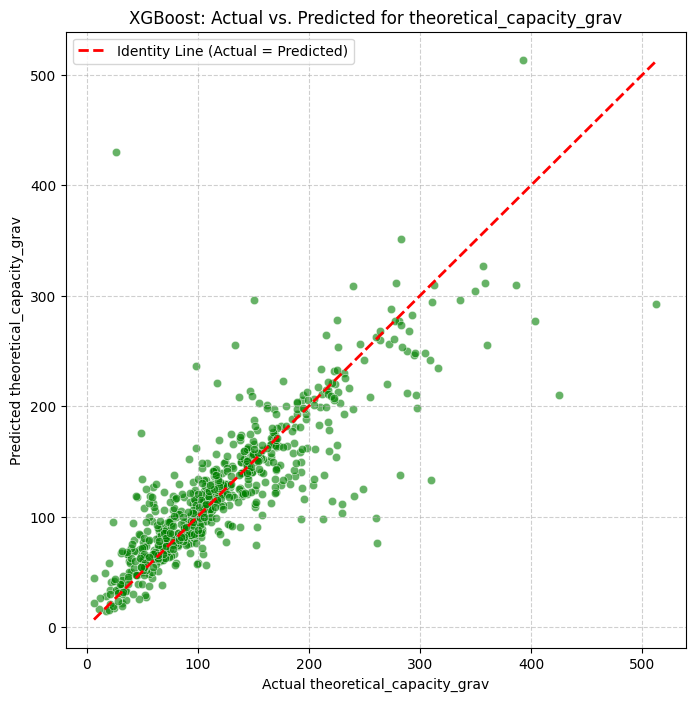

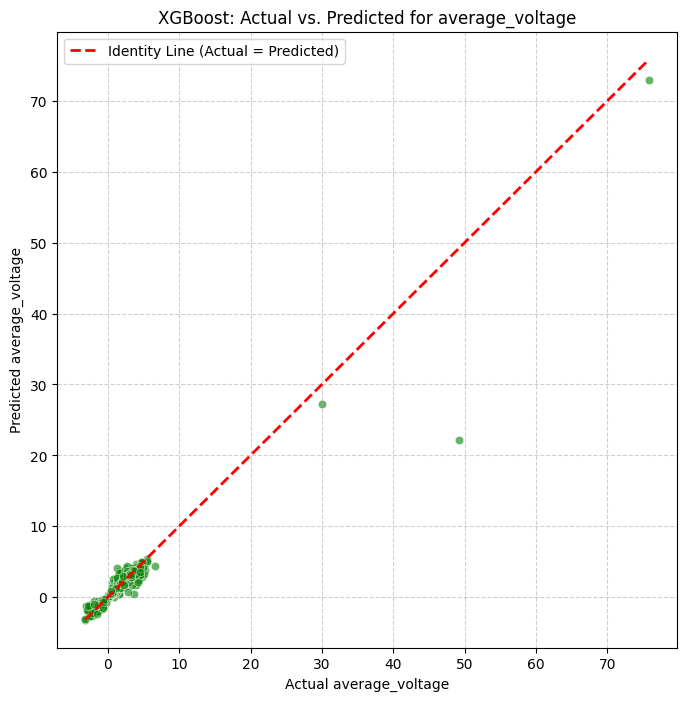

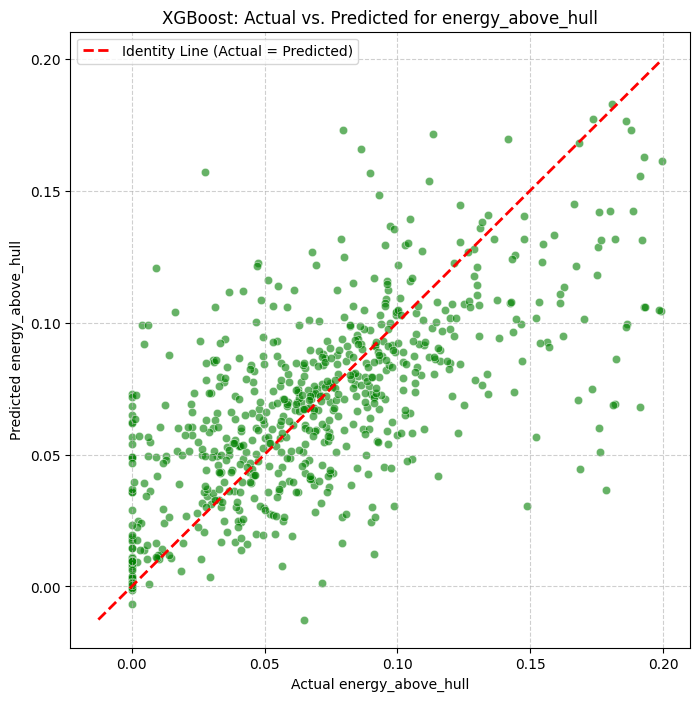


--- Generating Plots for Model: Random Forest ---


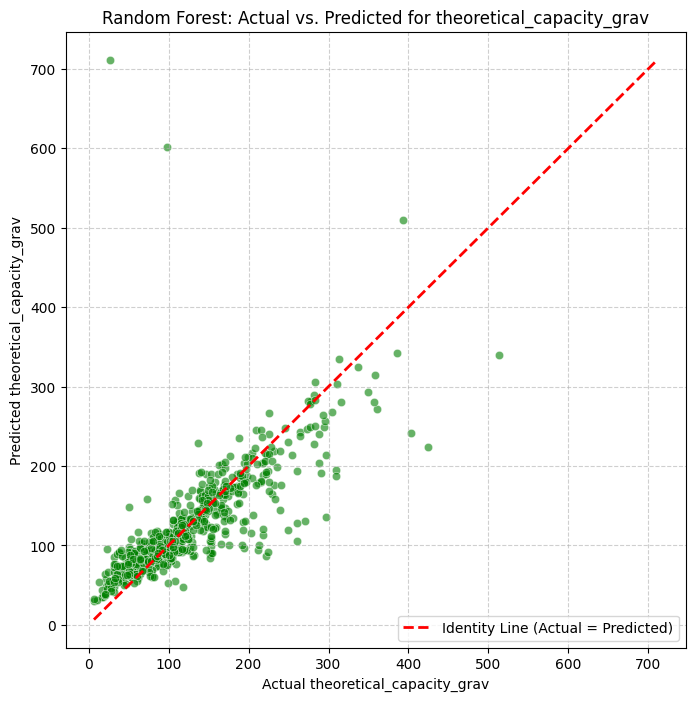

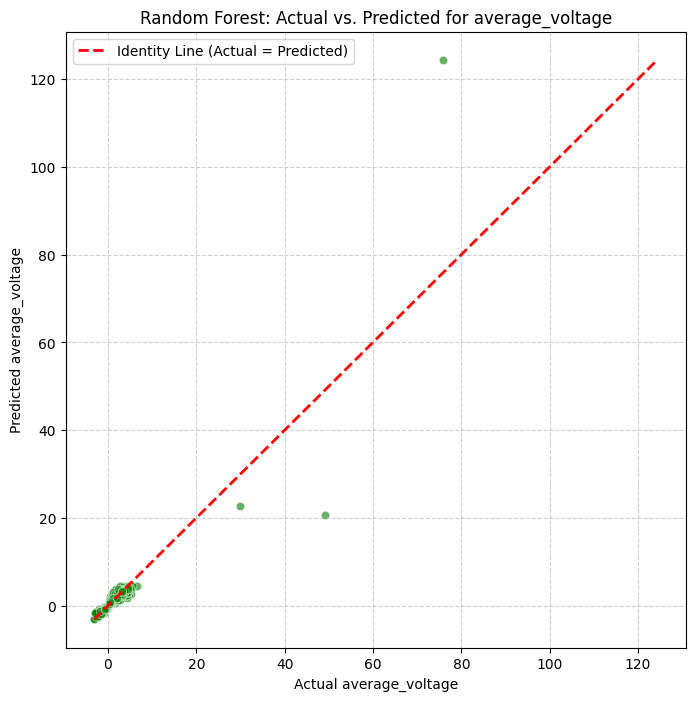

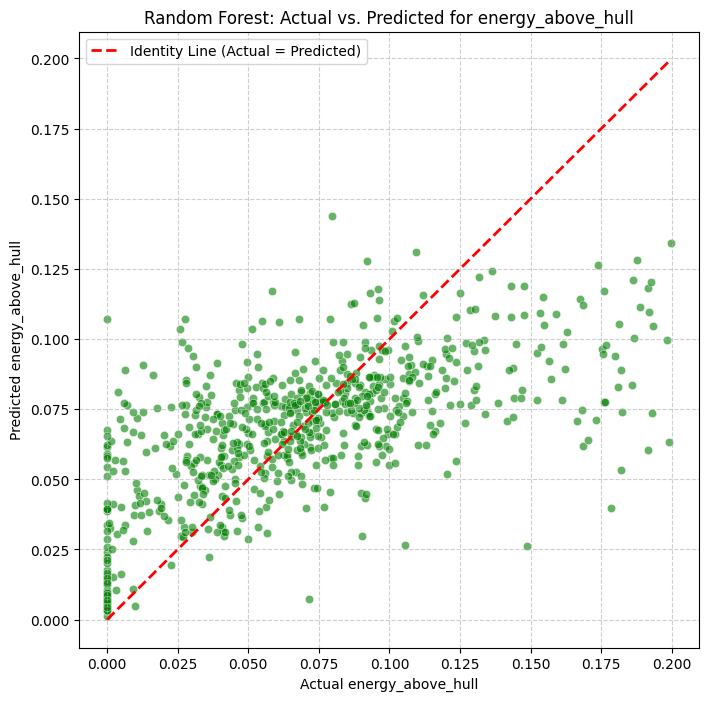


--- Generating Plots for Model: LightGBM ---


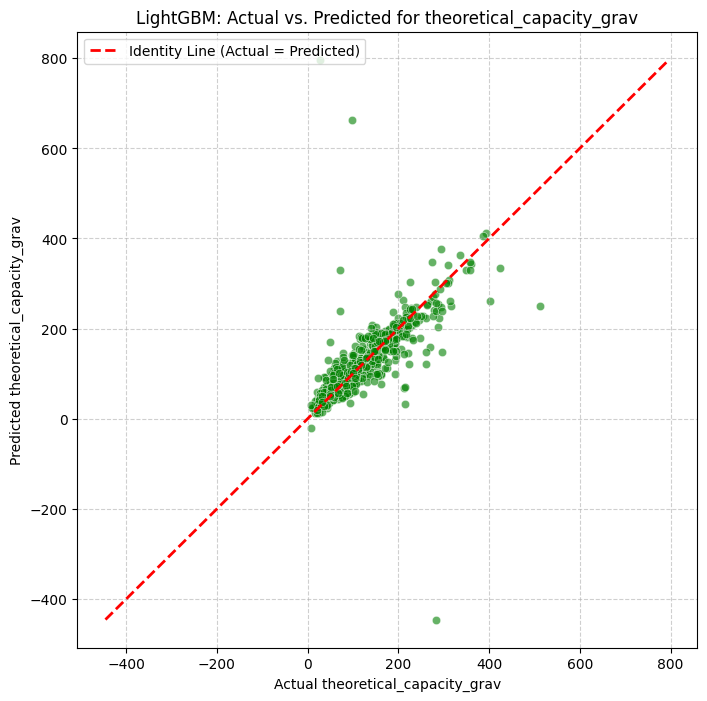

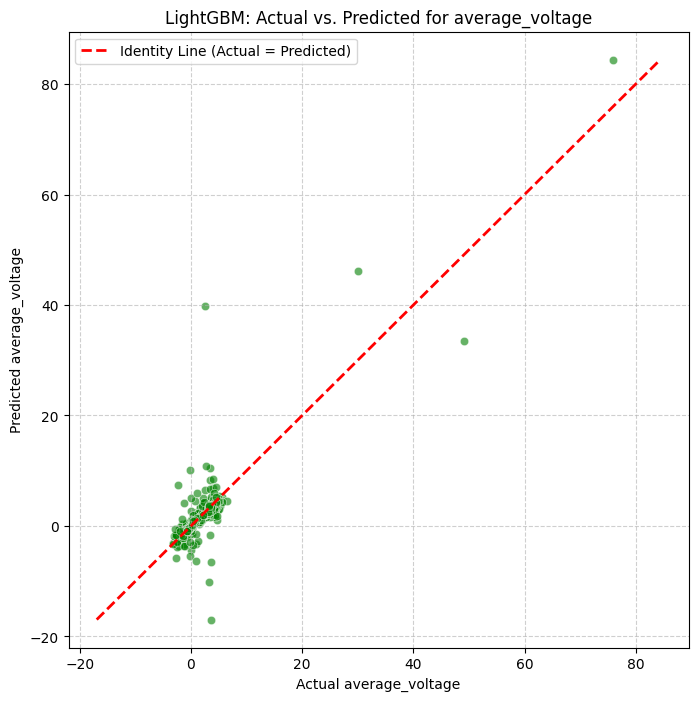

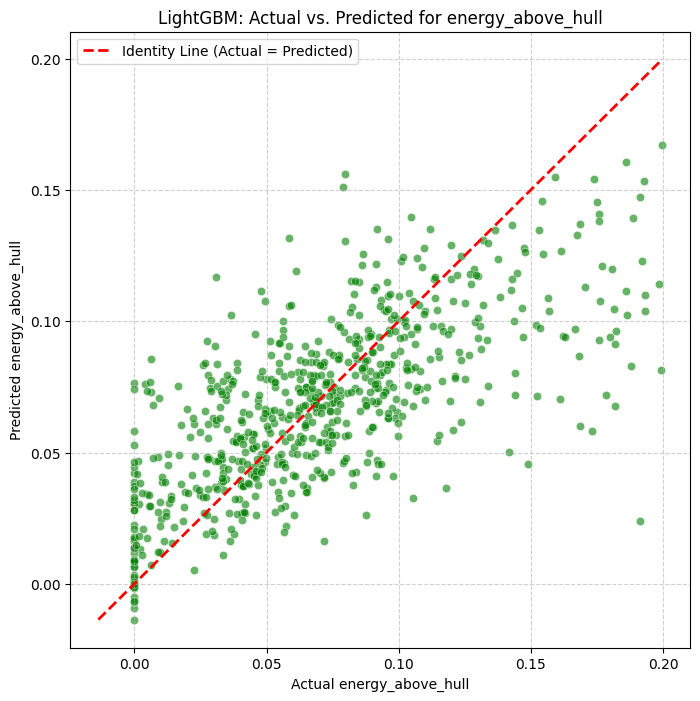


--- Predicted vs. Actual Plots Complete ---


In [12]:
# Predicted vs. Actual Plots for all three models

print("\n--- Generating Predicted vs. Actual Plots for All Models ---")

if 'all_models_error_analysis_dfs' in locals() and isinstance(all_models_error_analysis_dfs, dict) and 'target_kpis' in locals():

    for model_name, error_analysis_df in all_models_error_analysis_dfs.items():
        # Check if error analysis was successful for this model
        if 'Error' in error_analysis_df or 'Status' in error_analysis_df:
            print(f"\nSkipping plots for {model_name} due to previous error or status: {error_analysis_df}")
            continue # Skip to the next model


        print(f"\n--- Generating Plots for Model: {model_name} ---")

        for kpi in target_kpis:
            actual_col = f'{kpi}_actual'
            predicted_col = f'{kpi}_predicted'

            if actual_col in error_analysis_df.columns and predicted_col in error_analysis_df.columns:
                y_test_kpi = error_analysis_df[actual_col]
                y_pred_kpi = error_analysis_df[predicted_col]

                plt.figure(figsize=(8, 8))
                sns.scatterplot(x=y_test_kpi, y=y_pred_kpi, alpha=0.6, color='green')

                # Add the y=x identity line
                # Determine the range for the line based on the min and max of actual and predicted values
                min_val = min(y_test_kpi.min(), y_pred_kpi.min())
                max_val = max(y_test_kpi.max(), y_pred_kpi.max())
                plt.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='Identity Line (Actual = Predicted)')

                plt.title(f'{model_name}: Actual vs. Predicted for {kpi}') # Include model name in title
                plt.xlabel(f'Actual {kpi}')
                plt.ylabel(f'Predicted {kpi}')
                plt.grid(True, linestyle='--', alpha=0.6)
                plt.legend()
                plt.show()
            else:
                print(f"  Skipping plot for {kpi} for {model_name}: Actual or predicted columns not found in error analysis DataFrame.")

else:
    print("Error: Required variables (all_models_error_analysis_dfs, target_kpis) not found or are not correctly structured. Please run the error analysis step first.")

print("\n--- Predicted vs. Actual Plots Complete ---")

#### Absolute Error PLot


--- Generating Absolute Error Plots for All Models ---

--- Generating Absolute Error Plots for Model: XGBoost ---
  Generated plot for absolute error of theoretical_capacity_grav for XGBoost. Plotted 689 samples.
  Generated plot for absolute error of average_voltage for XGBoost. Plotted 689 samples.
  Generated plot for absolute error of energy_above_hull for XGBoost. Plotted 689 samples.


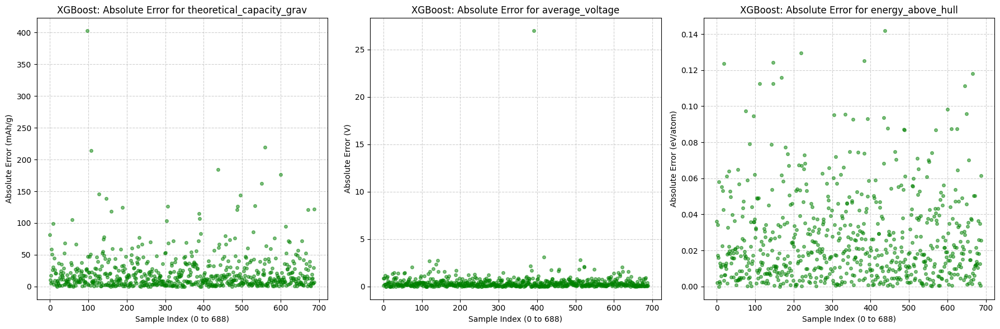


--- Generating Absolute Error Plots for Model: Random Forest ---
  Generated plot for absolute error of theoretical_capacity_grav for Random Forest. Plotted 689 samples.
  Generated plot for absolute error of average_voltage for Random Forest. Plotted 689 samples.
  Generated plot for absolute error of energy_above_hull for Random Forest. Plotted 689 samples.


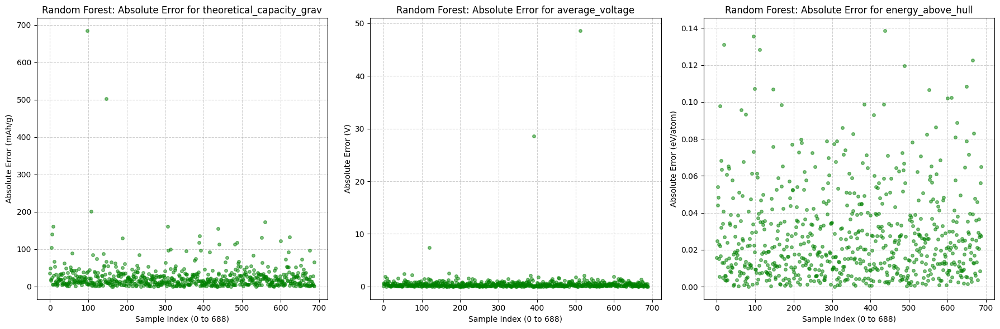


--- Generating Absolute Error Plots for Model: LightGBM ---
  Generated plot for absolute error of theoretical_capacity_grav for LightGBM. Plotted 689 samples.
  Generated plot for absolute error of average_voltage for LightGBM. Plotted 689 samples.
  Generated plot for absolute error of energy_above_hull for LightGBM. Plotted 689 samples.


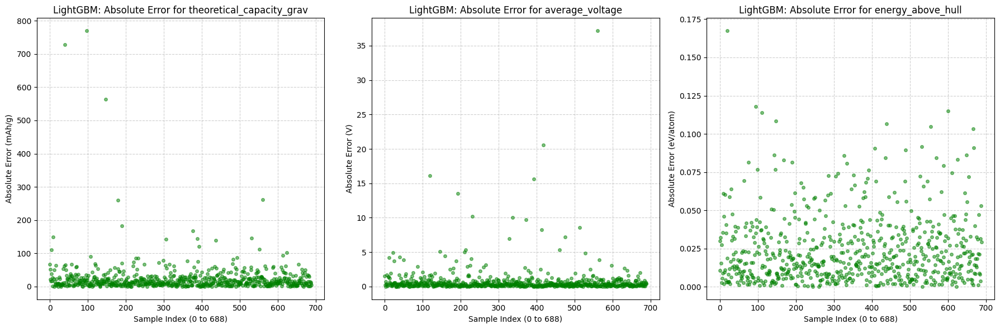


--- Absolute Error Plots Complete ---


In [13]:
# Absolute Error Plots for all three models

print("\n--- Generating Absolute Error Plots for All Models ---")

if 'all_models_absolute_errors_dfs' in locals() and isinstance(all_models_absolute_errors_dfs, dict) and 'target_kpis' in locals():

    # Define units for each KPI
    kpi_units = {
        'theoretical_capacity_grav': 'mAh/g',
        'average_voltage': 'V',
        'energy_above_hull': 'eV/atom'
    }

    for model_name, absolute_errors_df in all_models_absolute_errors_dfs.items():
        # Check if error calculation was successful for this model (optional check, assuming it was)
        if not isinstance(absolute_errors_df, pd.DataFrame):
             print(f"\nSkipping plots for {model_name}: Absolute errors data not found or is not a DataFrame.")
             continue # Skip to the next model

        print(f"\n--- Generating Absolute Error Plots for Model: {model_name} ---")

        num_kpis = len(target_kpis)

        # Set up the figure and axes for subplots for the current model's KPIs
        fig, axes = plt.subplots(1, num_kpis, figsize=(6 * num_kpis, 6))
        if num_kpis == 1:
            axes = [axes] # Ensure axes is iterable even for a single subplot


        for i, kpi in enumerate(target_kpis):
            if kpi in absolute_errors_df.columns:
                # Get the absolute errors for the current KPI
                kpi_absolute_errors = absolute_errors_df[kpi]

                # Create a temporary DataFrame with a reset index for plotting
                # This ensures the x-axis is sequential from 0 to N-1
                plot_data = kpi_absolute_errors.reset_index(drop=True)

                # Create the plot on the corresponding axis
                axes[i].plot(plot_data.index, plot_data.values, marker='o', linestyle='', alpha=0.5, markersize=4, color='green')

                axes[i].set_title(f'{model_name}: Absolute Error for {kpi}') # Include model name in title
                axes[i].set_xlabel(f'Sample Index (0 to {len(plot_data)-1})') # Updated label

                # Include units in the y-axis label
                y_label = f'Absolute Error ({kpi_units.get(kpi, "Units Unknown")})' # Get unit from dictionary, default if not found
                axes[i].set_ylabel(y_label)

                axes[i].grid(True, linestyle='--', alpha=0.6)

                print(f"  Generated plot for absolute error of {kpi} for {model_name}. Plotted {len(kpi_absolute_errors)} samples.")

            else:
                 print(f"  Skipping plot for {kpi} for {model_name}: Absolute error data not found.")


        # Adjust layout to prevent titles/labels overlapping
        plt.tight_layout()
        plt.show()

else:
    print("Error: Required variables (all_models_absolute_errors_dfs, target_kpis) not found or are not correctly structured. Please run the error analysis step first.")

print("\n--- Absolute Error Plots Complete ---")

#### Relative Error Plot


--- Generating Relative Error Plots for All Models ---

--- Generating Relative Error Plots for Model: XGBoost ---
  Generated plot for relative error of theoretical_capacity_grav for XGBoost. Plotted 689 samples (NaNs removed).
  Generated plot for relative error of average_voltage for XGBoost. Plotted 689 samples (NaNs removed).
  Generated plot for relative error of energy_above_hull for XGBoost. Plotted 643 samples (NaNs removed).


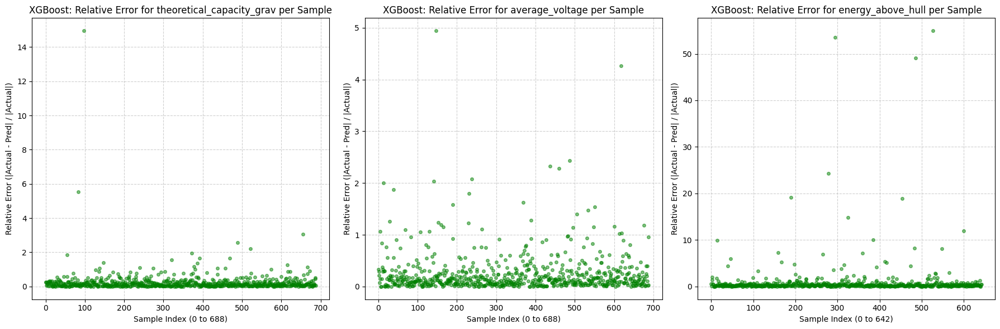


--- Generating Relative Error Plots for Model: Random Forest ---
  Generated plot for relative error of theoretical_capacity_grav for Random Forest. Plotted 689 samples (NaNs removed).
  Generated plot for relative error of average_voltage for Random Forest. Plotted 689 samples (NaNs removed).
  Generated plot for relative error of energy_above_hull for Random Forest. Plotted 643 samples (NaNs removed).


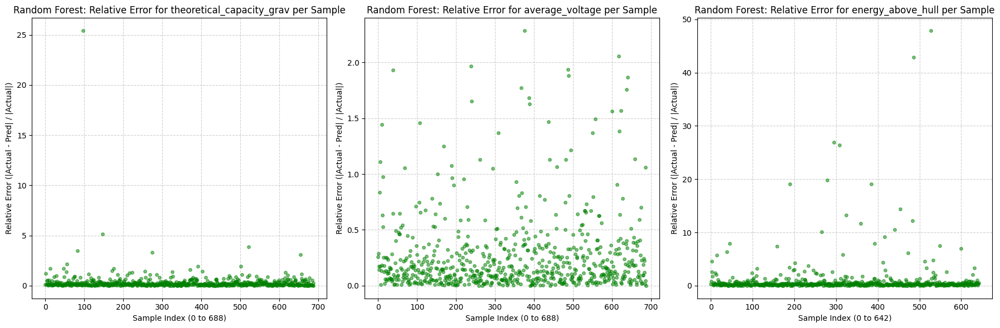


--- Generating Relative Error Plots for Model: LightGBM ---
  Generated plot for relative error of theoretical_capacity_grav for LightGBM. Plotted 689 samples (NaNs removed).
  Generated plot for relative error of average_voltage for LightGBM. Plotted 689 samples (NaNs removed).
  Generated plot for relative error of energy_above_hull for LightGBM. Plotted 643 samples (NaNs removed).


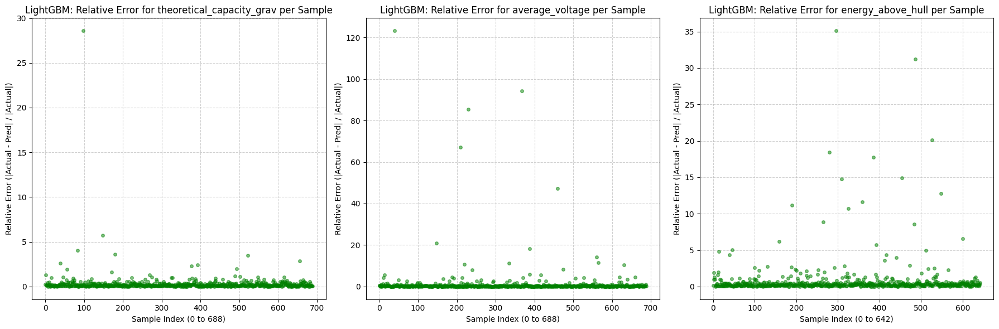


--- Relative Error Plots Complete ---


In [14]:
# Relative error plot per sample for all three models

print("\n--- Generating Relative Error Plots for All Models ---")

if 'all_models_relative_errors_dfs' in locals() and isinstance(all_models_relative_errors_dfs, dict) and 'target_kpis' in locals():

    for model_name, relative_errors_df in all_models_relative_errors_dfs.items():
        # Check if error calculation was successful for this model (optional check)
        if not isinstance(relative_errors_df, pd.DataFrame):
             print(f"\nSkipping plots for {model_name}: Relative errors data not found or is not a DataFrame.")
             continue # Skip to the next model

        print(f"\n--- Generating Relative Error Plots for Model: {model_name} ---")

        num_kpis = len(target_kpis)

        # Set up the figure and axes for subplots for the current model's KPIs
        fig, axes = plt.subplots(1, num_kpis, figsize=(6 * num_kpis, 6))
        if num_kpis == 1:
            axes = [axes] # Ensure axes is iterable even for a single subplot


        for i, kpi in enumerate(target_kpis):
            if kpi in relative_errors_df.columns:
                # Get the relative errors for the current KPI
                # Drop NaNs because cannot plot undefined relative errors (where actual was 0)
                kpi_relative_errors = relative_errors_df[kpi].dropna()

                # Create a temporary DataFrame with a reset index for plotting
                # This ensures the x-axis is sequential from 0 to N-1
                plot_data = kpi_relative_errors.reset_index(drop=True)


                # Create the plot on the corresponding axis
                # Use the new 0-based index for the x-axis
                axes[i].plot(plot_data.index, plot_data.values, marker='o', linestyle='', alpha=0.5, markersize=4, color='green')

                axes[i].set_title(f'{model_name}: Relative Error for {kpi} per Sample') # Include model name in title
                axes[i].set_xlabel(f'Sample Index (0 to {len(plot_data)-1})') # Updated label
                axes[i].set_ylabel('Relative Error (|Actual - Pred| / |Actual|)')
                axes[i].grid(True, linestyle='--', alpha=0.6)

                print(f"  Generated plot for relative error of {kpi} for {model_name}. Plotted {len(kpi_relative_errors)} samples (NaNs removed).")

            else:
                 print(f"  Skipping plot for {kpi} for {model_name}: Relative error data not found.")


        # Adjust layout to prevent titles/labels overlapping
        plt.tight_layout()
        plt.show()

else:
    print("Error: Required variables (all_models_relative_errors_dfs, target_kpis) not found or are not correctly structured. Please run the error analysis step first.")

print("\n--- Relative Error Plots Complete ---")

#### Logarithmic Error Plot


--- Generating Logarithmic Absolute and Relative Error Plots for All Models ---

--- Generating Logarithmic Error Plots for Model: XGBoost ---
  Generated plot for logarithmic absolute error of theoretical_capacity_grav for XGBoost. Plotted 689 samples.
  Generated plot for logarithmic relative error of theoretical_capacity_grav for XGBoost. Plotted 689 samples (NaNs removed).
  Generated plot for logarithmic absolute error of average_voltage for XGBoost. Plotted 689 samples.
  Generated plot for logarithmic relative error of average_voltage for XGBoost. Plotted 689 samples (NaNs removed).
  Generated plot for logarithmic absolute error of energy_above_hull for XGBoost. Plotted 689 samples.
  Generated plot for logarithmic relative error of energy_above_hull for XGBoost. Plotted 643 samples (NaNs removed).


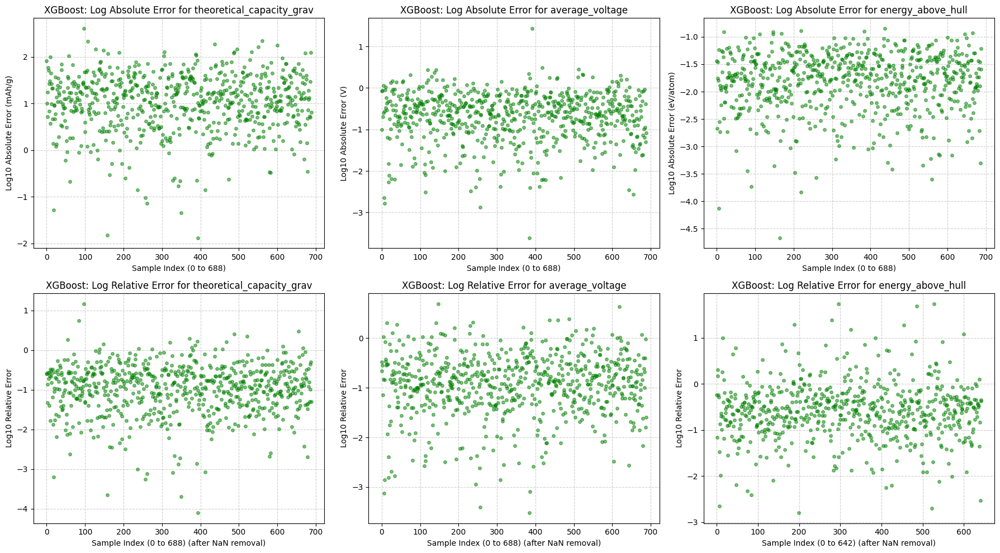


--- Generating Logarithmic Error Plots for Model: Random Forest ---
  Generated plot for logarithmic absolute error of theoretical_capacity_grav for Random Forest. Plotted 689 samples.
  Generated plot for logarithmic relative error of theoretical_capacity_grav for Random Forest. Plotted 689 samples (NaNs removed).
  Generated plot for logarithmic absolute error of average_voltage for Random Forest. Plotted 689 samples.
  Generated plot for logarithmic relative error of average_voltage for Random Forest. Plotted 689 samples (NaNs removed).
  Generated plot for logarithmic absolute error of energy_above_hull for Random Forest. Plotted 689 samples.
  Generated plot for logarithmic relative error of energy_above_hull for Random Forest. Plotted 643 samples (NaNs removed).


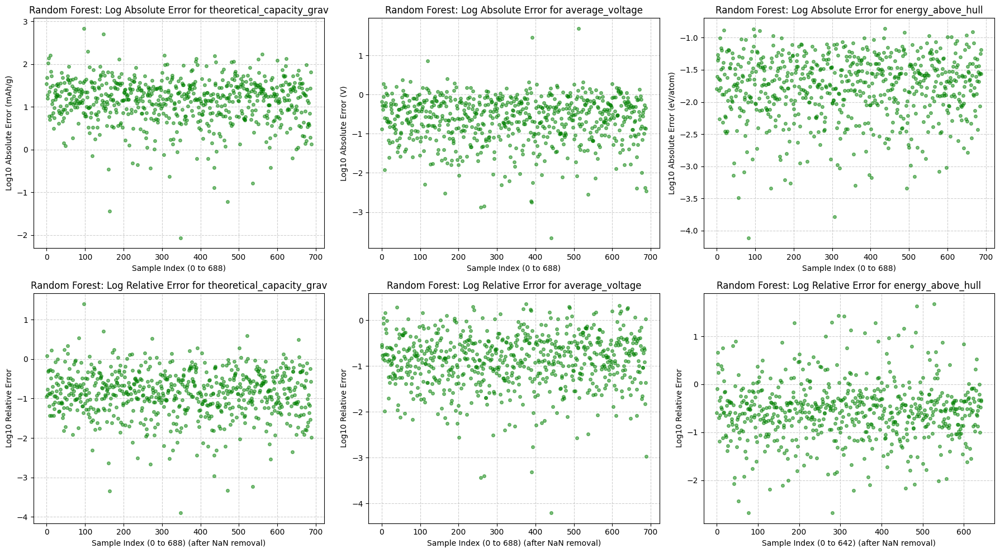


--- Generating Logarithmic Error Plots for Model: LightGBM ---
  Generated plot for logarithmic absolute error of theoretical_capacity_grav for LightGBM. Plotted 689 samples.
  Generated plot for logarithmic relative error of theoretical_capacity_grav for LightGBM. Plotted 689 samples (NaNs removed).
  Generated plot for logarithmic absolute error of average_voltage for LightGBM. Plotted 689 samples.
  Generated plot for logarithmic relative error of average_voltage for LightGBM. Plotted 689 samples (NaNs removed).
  Generated plot for logarithmic absolute error of energy_above_hull for LightGBM. Plotted 689 samples.
  Generated plot for logarithmic relative error of energy_above_hull for LightGBM. Plotted 643 samples (NaNs removed).


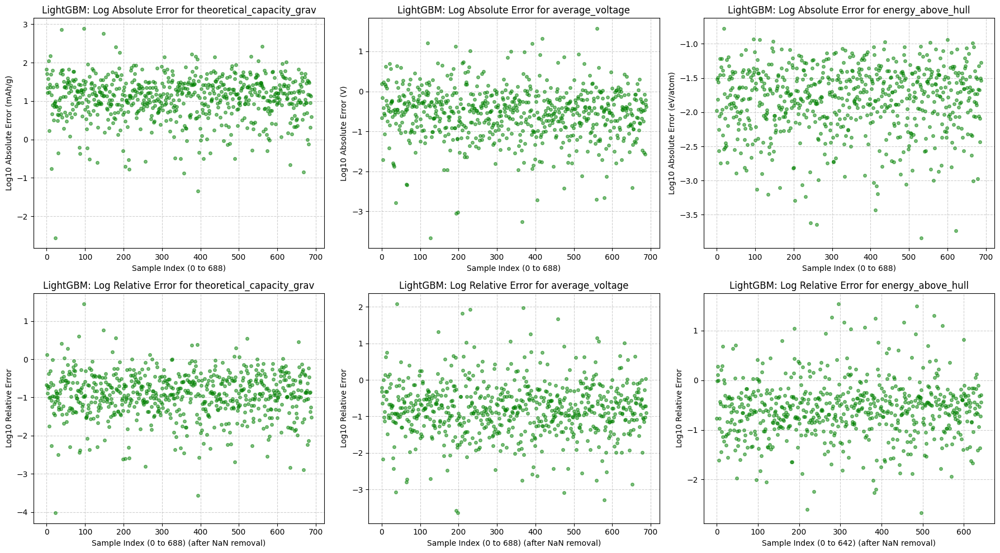


--- Logarithmic Error Plots Complete ---


In [15]:
# Logarithmic Error Plot for Absolute and Relative Errors for All Models

print("\n--- Generating Logarithmic Absolute and Relative Error Plots for All Models ---")

if 'all_models_absolute_errors_dfs' in locals() and isinstance(all_models_absolute_errors_dfs, dict) and \
   'all_models_relative_errors_dfs' in locals() and isinstance(all_models_relative_errors_dfs, dict) and \
   'target_kpis' in locals():

    # Define units for each KPI (re-using from previous cell)
    kpi_units = {
        'theoretical_capacity_grav': 'mAh/g',
        'average_voltage': 'V',
        'energy_above_hull': 'eV/atom'
    }

    # Iterate through each model
    # We can use keys from either error dictionary, assuming they are the same
    for model_name in all_models_absolute_errors_dfs.keys():
        if model_name in all_models_relative_errors_dfs: # Ensure relative errors also exist for this model
            print(f"\n--- Generating Logarithmic Error Plots for Model: {model_name} ---")

            absolute_errors_df = all_models_absolute_errors_dfs[model_name]
            relative_errors_df = all_models_relative_errors_dfs[model_name]

            num_kpis = len(target_kpis)

            # Set up the figure and axes for subplots (2 rows for absolute and relative)
            fig, axes = plt.subplots(2, num_kpis, figsize=(6 * num_kpis, 10))

            # If only one KPI, axes will be a 1D array, need to reshape for consistent indexing
            if num_kpis == 1:
                axes = axes.reshape(2, 1)

            for i, kpi in enumerate(target_kpis):
                if kpi in absolute_errors_df.columns and kpi in relative_errors_df.columns:
                    # Logarithmic Absolute Error Plot (Top Row)
                    kpi_absolute_errors = absolute_errors_df[kpi]

                    # Calculate log10 of absolute errors. Handle zero or near-zero errors by adding a small epsilon.
                    # Add small epsilon before taking log to avoid log(0) which is -inf
                    log_abs_errors = np.log10(kpi_absolute_errors + 1e-9)


                    # Create temporary DataFrame for plotting (0-based index)
                    plot_data_abs = pd.DataFrame({'log_error': log_abs_errors}).reset_index(drop=True)


                    # Plot on the top row
                    axes[0, i].plot(plot_data_abs.index, plot_data_abs['log_error'], marker='o', linestyle='', alpha=0.5, markersize=4, color='green')
                    axes[0, i].set_title(f'{model_name}: Log Absolute Error for {kpi}') # Include model name
                    axes[0, i].set_xlabel(f'Sample Index (0 to {len(plot_data_abs)-1})')

                    # Include units in the y-axis label
                    y_label_abs = f'Log10 Absolute Error ({kpi_units.get(kpi, "Units Unknown")})'
                    axes[0, i].set_ylabel(y_label_abs)
                    axes[0, i].grid(True, linestyle='--', alpha=0.6)

                    print(f"  Generated plot for logarithmic absolute error of {kpi} for {model_name}. Plotted {len(kpi_absolute_errors)} samples.")


                    # Logarithmic Relative Error Plot (Bottom Row)
                    kpi_relative_errors = relative_errors_df[kpi].dropna() # Drop NaNs (where actual was 0)

                    # Calculate log10 of relative errors. Handle zero errors.
                    # Add epsilon before taking log.
                    log_rel_errors = np.log10(kpi_relative_errors + 1e-9)

                    # Create temporary DataFrame for plotting (0-based index)
                    plot_data_rel = pd.DataFrame({'log_error': log_rel_errors}).reset_index(drop=True)


                    # Plot on the bottom row
                    axes[1, i].plot(plot_data_rel.index, plot_data_rel['log_error'], marker='o', linestyle='', alpha=0.5, markersize=4, color='green')
                    axes[1, i].set_title(f'{model_name}: Log Relative Error for {kpi}') # Include model name
                    axes[1, i].set_xlabel(f'Sample Index (0 to {len(plot_data_rel)-1}) (after NaN removal)')
                    axes[1, i].set_ylabel('Log10 Relative Error')
                    axes[1, i].grid(True, linestyle='--', alpha=0.6)

                    print(f"  Generated plot for logarithmic relative error of {kpi} for {model_name}. Plotted {len(kpi_relative_errors)} samples (NaNs removed).")

                else:
                     print(f"  Skipping plots for {kpi} for {model_name}: Error data not found.")


            # Adjust layout to prevent titles/labels overlapping
            plt.tight_layout()
            plt.show()

        else:
             print(f"\nSkipping Logarithmic Error Plots for {model_name}: Relative error data not found.")


else:
    print("Error: Required error DataFrames (all_models_absolute_errors_dfs, all_models_relative_errors_dfs) or target_kpis not found or are not correctly structured. Please run the error analysis step first.")

print("\n--- Logarithmic Error Plots Complete ---")

### Model Interpretability (using SHAP Values)

In [16]:
import shap

In [17]:
# Generate SHAP Explanation for All Models

print("\n--- Generating SHAP Explanations for All Models ---")

# Dictionary to store SHAP results for each model and KPI
all_models_shap_results = {}

# Dictionary mapping model names to loaded model objects (re-using from previous cell)
loaded_models = {
    'XGBoost': loaded_xgboost_model if 'loaded_xgboost_model' in locals() else None,
    'Random Forest': loaded_random_forest_model if 'loaded_random_forest_model' in locals() else None,
    'LightGBM': loaded_lightgbm_model if 'loaded_lightgbm_model' in locals() else None
}

# Ensure X_test_scaled_dfs and target_kpis are available
if 'X_test_scaled_dfs' in locals() and isinstance(X_test_scaled_dfs, dict) and 'target_kpis' in locals():

    # Iterate through each model
    for model_name, model in loaded_models.items():
        if model is not None and model_name in X_test_scaled_dfs:
            print(f"\n--- Generating SHAP for Model: {model_name} ---")

            # Get the scaled test data for the current model
            X_shap = X_test_scaled_dfs[model_name]

            # Check if the model is a MultiOutputRegressor and has fitted estimators
            if isinstance(model, MultiOutputRegressor) and hasattr(model, 'estimators_') and len(model.estimators_) == len(target_kpis):
                print(f"Found {len(model.estimators_)} fitted estimators for {model_name}.")

                # Dictionary to store SHAP results for this model's KPIs
                model_shap_results = {}

                print(f"Calculating SHAP values for {model_name} on {X_shap.shape[0]} samples...")

                for i, kpi in enumerate(target_kpis):
                    print(f"  Calculating SHAP values for KPI: {kpi} using {model_name} estimator...")
                    try:
                        # Get the fitted estimator for the current KPI
                        estimator_kpi = model.estimators_[i]

                        # Initialize the SHAP explainer for the current estimator
                        # Use TreeExplainer for tree-based models (XGBoost, RandomForest, LightGBM)
                        explainer_kpi = shap.TreeExplainer(estimator_kpi)

                        # Calculate SHAP values for this KPI's estimator
                        # The output of explainer_kpi.shap_values will be an array of SHAP values for this single output
                        shap_values_kpi = explainer_kpi.shap_values(X_shap)

                        # Store the results for this KPI
                        model_shap_results[kpi] = {
                            'explainer': explainer_kpi,
                            'shap_values': shap_values_kpi
                        }
                        print(f"  SHAP value calculation complete for {kpi} ({model_name}).")

                    except Exception as e:
                        print(f"  Error calculating SHAP values for {kpi} ({model_name}): {e}")
                        model_shap_results[kpi] = {'error': str(e)} # Store error info

                # Store the SHAP results for the current model
                all_models_shap_results[model_name] = model_shap_results
                print(f"\nSHAP explanation generation complete for {model_name}.")

            else:
                print(f"Skipping SHAP for {model_name}: Model is not a MultiOutputRegressor with fitted estimators matching target KPIs.")

        elif model is None:
             print(f"\n--- Skipping SHAP for {model_name} ---")
             print(f"{model_name} model was not loaded successfully.")
        elif model_name not in X_test_scaled_dfs:
             print(f"\n--- Skipping SHAP for {model_name} ---")
             print(f"Scaled test data for {model_name} not found in X_test_scaled_dfs.")


else:
    print("Error: Required variables (X_test_scaled_dfs, target_kpis) not found or are not correctly structured. Skipping SHAP explanation generation.")

print("\n--- Overall SHAP Explanation Generation Complete ---")


--- Generating SHAP Explanations for All Models ---

--- Generating SHAP for Model: XGBoost ---
Found 3 fitted estimators for XGBoost.
Calculating SHAP values for XGBoost on 689 samples...
  Calculating SHAP values for KPI: theoretical_capacity_grav using XGBoost estimator...
  SHAP value calculation complete for theoretical_capacity_grav (XGBoost).
  Calculating SHAP values for KPI: average_voltage using XGBoost estimator...
  SHAP value calculation complete for average_voltage (XGBoost).
  Calculating SHAP values for KPI: energy_above_hull using XGBoost estimator...
  SHAP value calculation complete for energy_above_hull (XGBoost).

SHAP explanation generation complete for XGBoost.

--- Generating SHAP for Model: Random Forest ---
Found 3 fitted estimators for Random Forest.
Calculating SHAP values for Random Forest on 689 samples...
  Calculating SHAP values for KPI: theoretical_capacity_grav using Random Forest estimator...
  SHAP value calculation complete for theoretical_capacit

#### SHAP Summary Plots (Dot Plots)


--- Generating SHAP Summary (Dot) Plots for All Models ---

--- Generating SHAP Summary (Dot) Plots for Model: XGBoost ---
  Generating SHAP Summary (Dot) Plot for KPI: theoretical_capacity_grav (XGBoost)


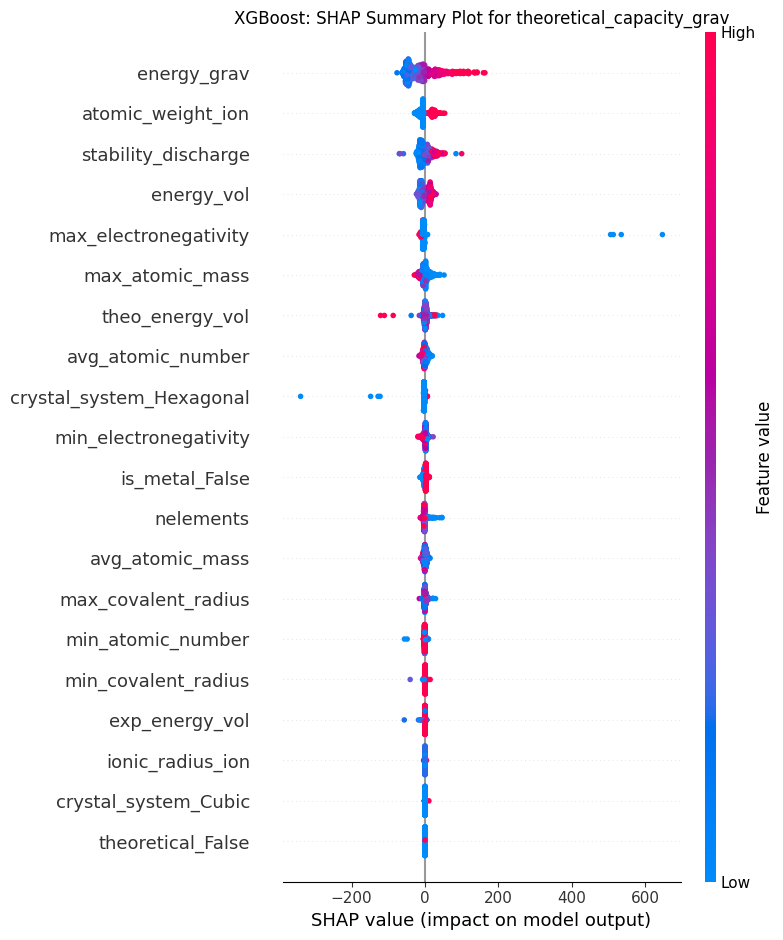

  Generating SHAP Summary (Dot) Plot for KPI: average_voltage (XGBoost)


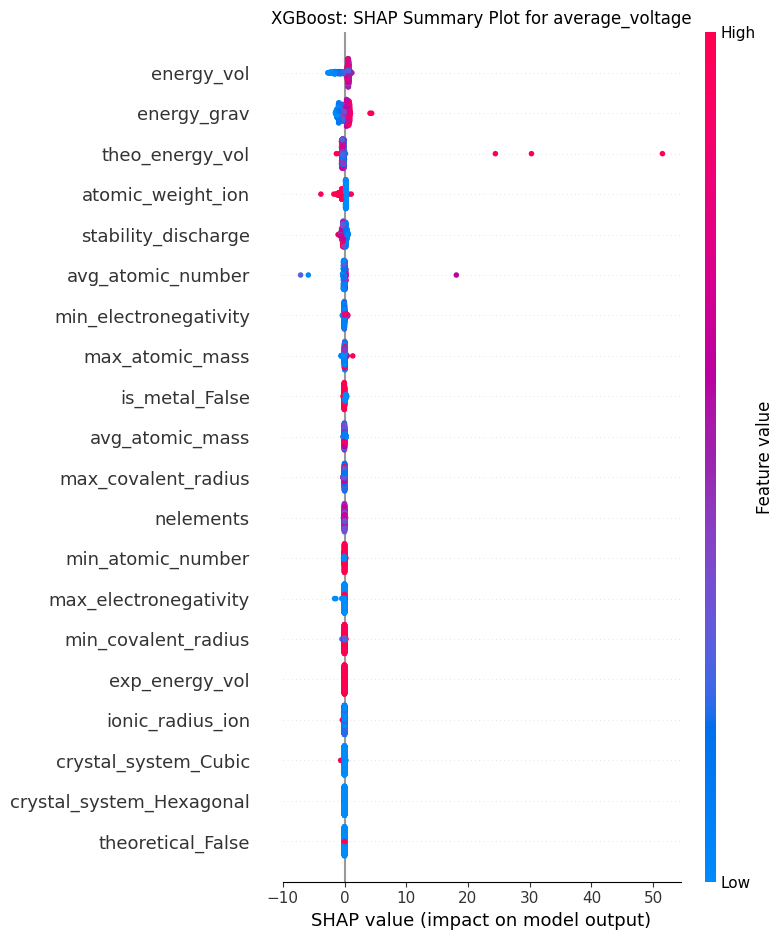

  Generating SHAP Summary (Dot) Plot for KPI: energy_above_hull (XGBoost)


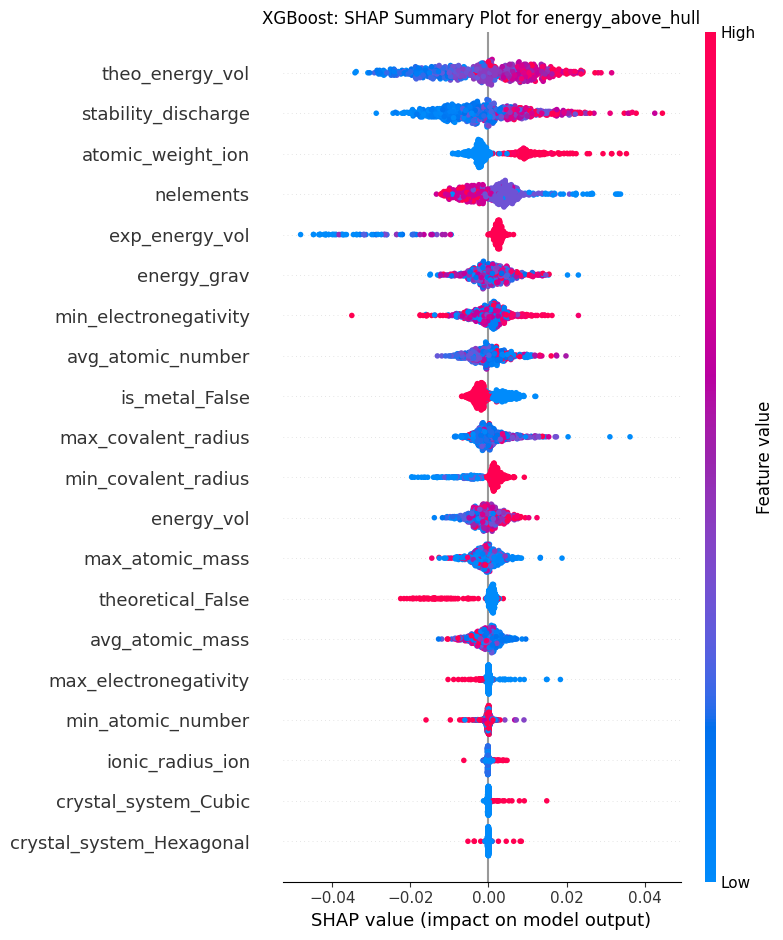


--- Generating SHAP Summary (Dot) Plots for Model: Random Forest ---
  Generating SHAP Summary (Dot) Plot for KPI: theoretical_capacity_grav (Random Forest)


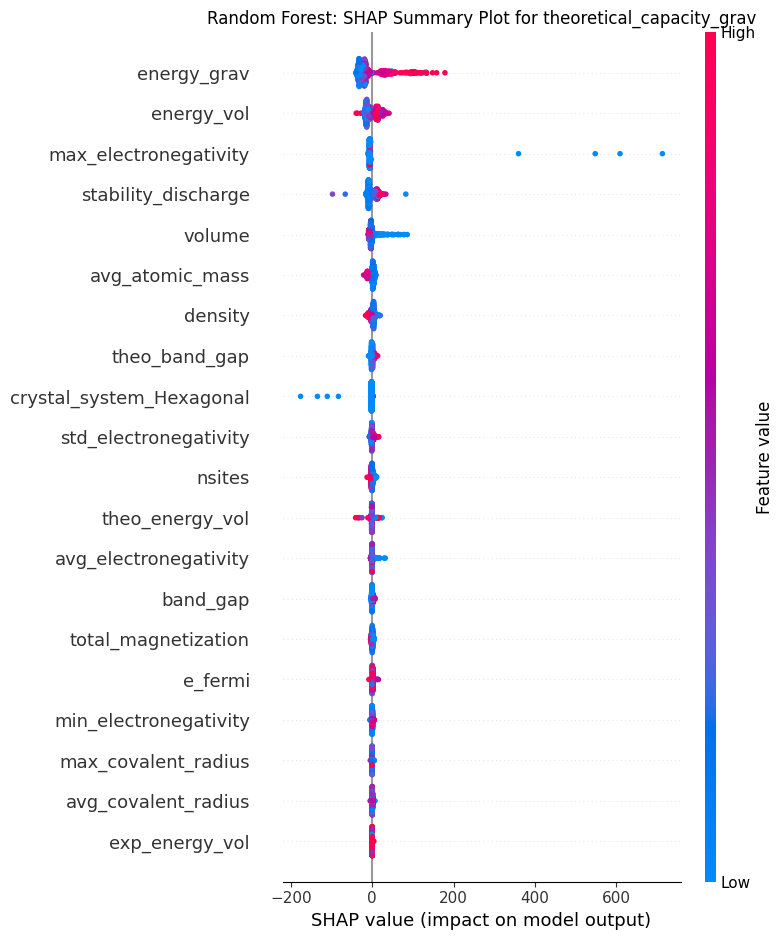

  Generating SHAP Summary (Dot) Plot for KPI: average_voltage (Random Forest)


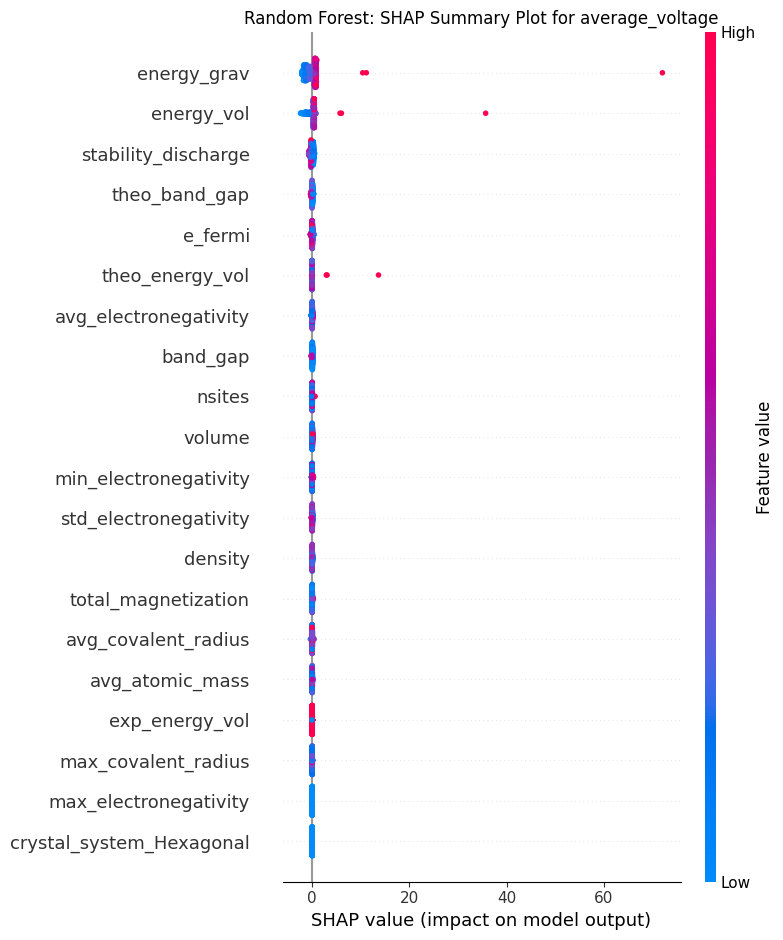

  Generating SHAP Summary (Dot) Plot for KPI: energy_above_hull (Random Forest)


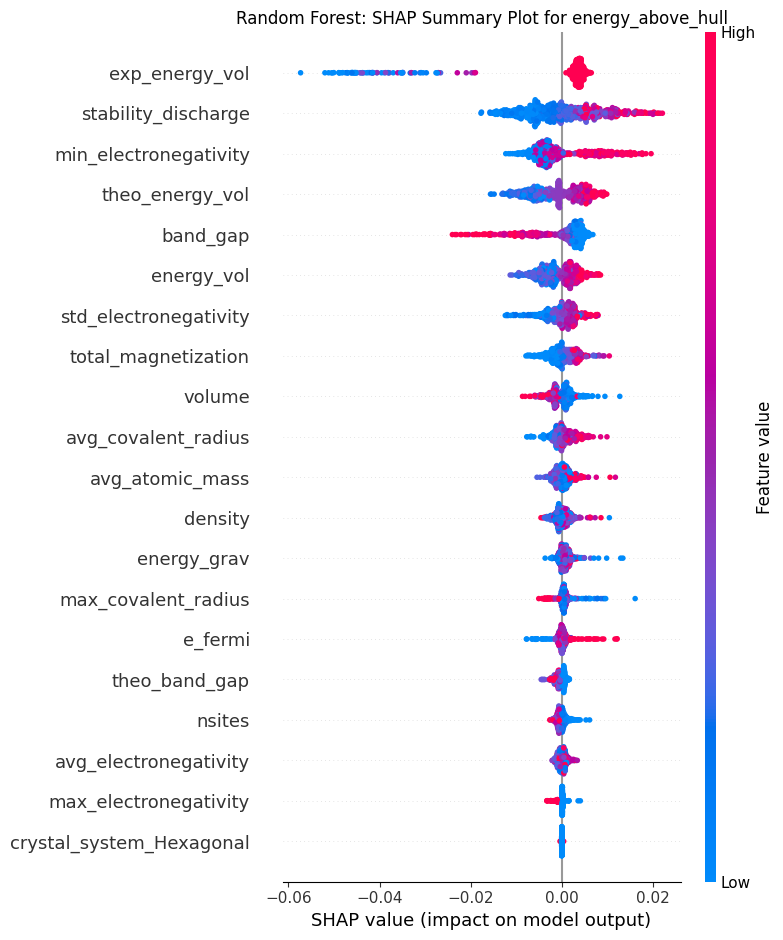


--- Generating SHAP Summary (Dot) Plots for Model: LightGBM ---
  Generating SHAP Summary (Dot) Plot for KPI: theoretical_capacity_grav (LightGBM)


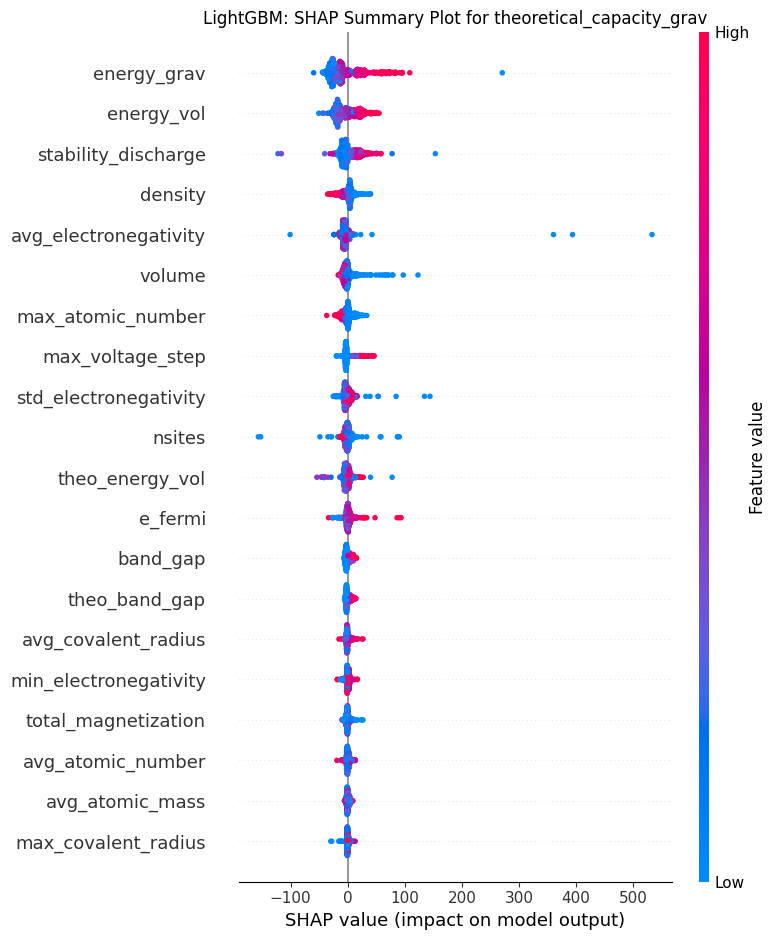

  Generating SHAP Summary (Dot) Plot for KPI: average_voltage (LightGBM)


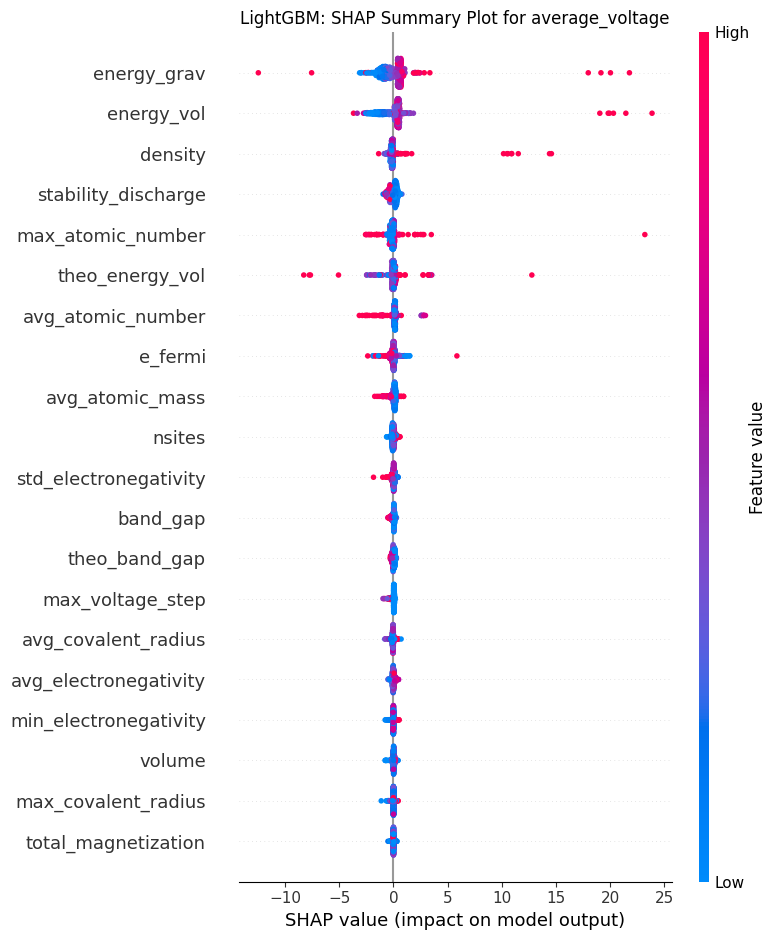

  Generating SHAP Summary (Dot) Plot for KPI: energy_above_hull (LightGBM)


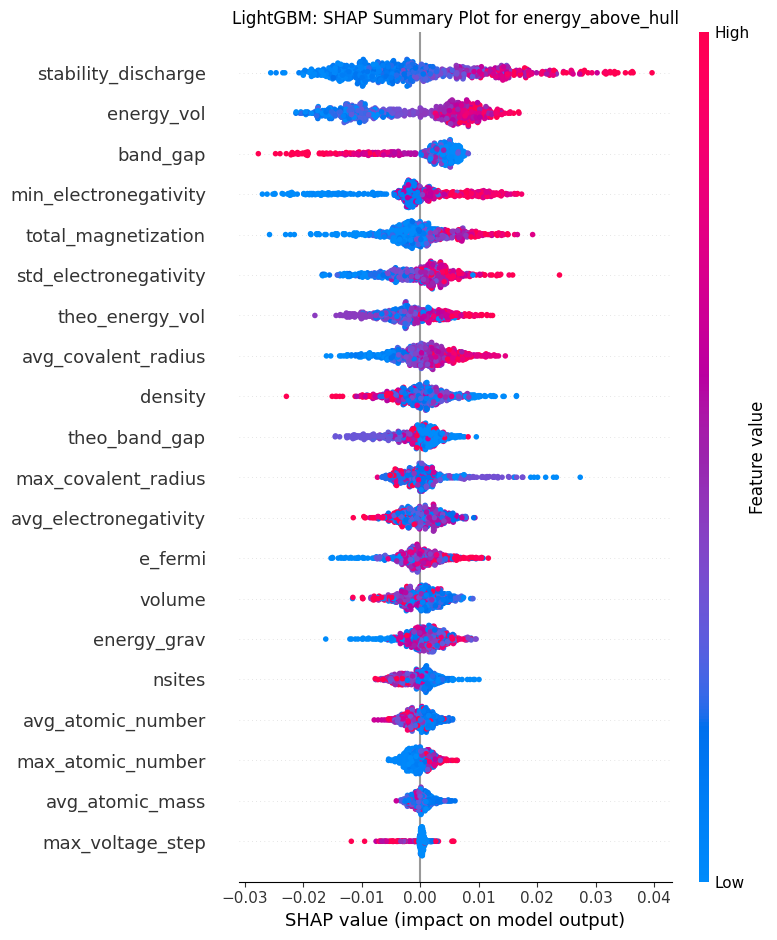


--- Overall SHAP Summary (Dot) Plots Complete ---


In [18]:
# Generate SHAP Summary (Dot) Plots for each KPI for all models

print("\n--- Generating SHAP Summary (Dot) Plots for All Models ---")

if 'all_models_shap_results' in locals() and isinstance(all_models_shap_results, dict) and \
   'X_test_scaled_dfs' in locals() and isinstance(X_test_scaled_dfs, dict) and 'target_kpis' in locals():

    # Iterate through each model's SHAP results
    for model_name, model_shap_results in all_models_shap_results.items():
        print(f"\n--- Generating SHAP Summary (Dot) Plots for Model: {model_name} ---")

        # Get the corresponding scaled test data for this model (needed for feature names)
        if model_name in X_test_scaled_dfs:
             X_shap = X_test_scaled_dfs[model_name]
        else:
             print(f"  Skipping plots for {model_name}: Scaled test data not found in X_test_scaled_dfs.")
             continue # Skip to the next model


        # Iterate through each KPI's SHAP results for the current model
        for kpi in target_kpis:
            if kpi in model_shap_results and 'shap_values' in model_shap_results[kpi]:
                print(f"  Generating SHAP Summary (Dot) Plot for KPI: {kpi} ({model_name})")
                shap_values = model_shap_results[kpi]['shap_values']

                try:
                    # Use the correct X_shap DataFrame for feature names
                    shap.summary_plot(shap_values, X_shap, plot_type="dot", show=False)
                    plt.title(f'{model_name}: SHAP Summary Plot for {kpi}') # Include model name in title
                    plt.tight_layout()
                    plt.show()
                except Exception as e:
                    print(f"    Could not generate SHAP Summary (Dot) Plot for {kpi} ({model_name}): {e}")

            else:
                print(f"  SHAP values for {kpi} ({model_name}) not found in all_models_shap_results. Skipping dot plot.")

else:
    print("Required variables (all_models_shap_results, X_test_scaled_dfs, target_kpis) not found or are not correctly structured. Please run previous cells.")

print("\n--- Overall SHAP Summary (Dot) Plots Complete ---")

#### SHAP Summary Plots (Bar Plots)


--- Generating SHAP Summary (Bar) Plots for All Models ---

--- Generating SHAP Summary (Bar) Plots for Model: XGBoost ---
  Generating SHAP Summary (Bar) Plot for KPI: theoretical_capacity_grav (XGBoost)


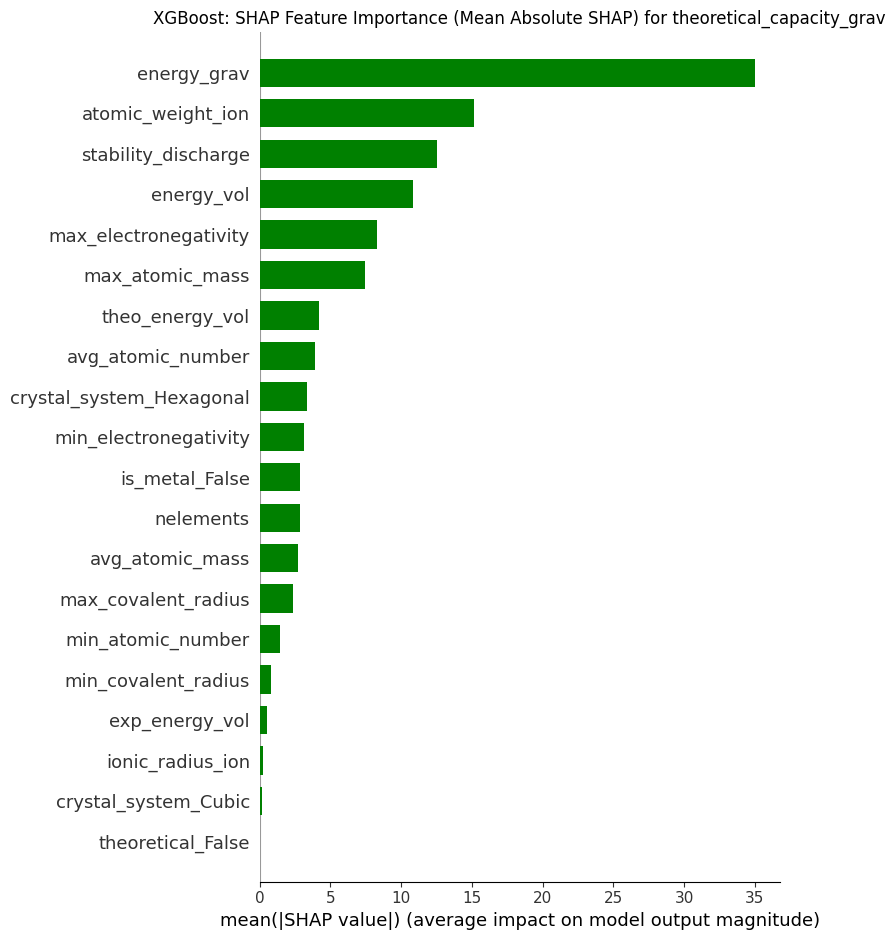

  Generating SHAP Summary (Bar) Plot for KPI: average_voltage (XGBoost)


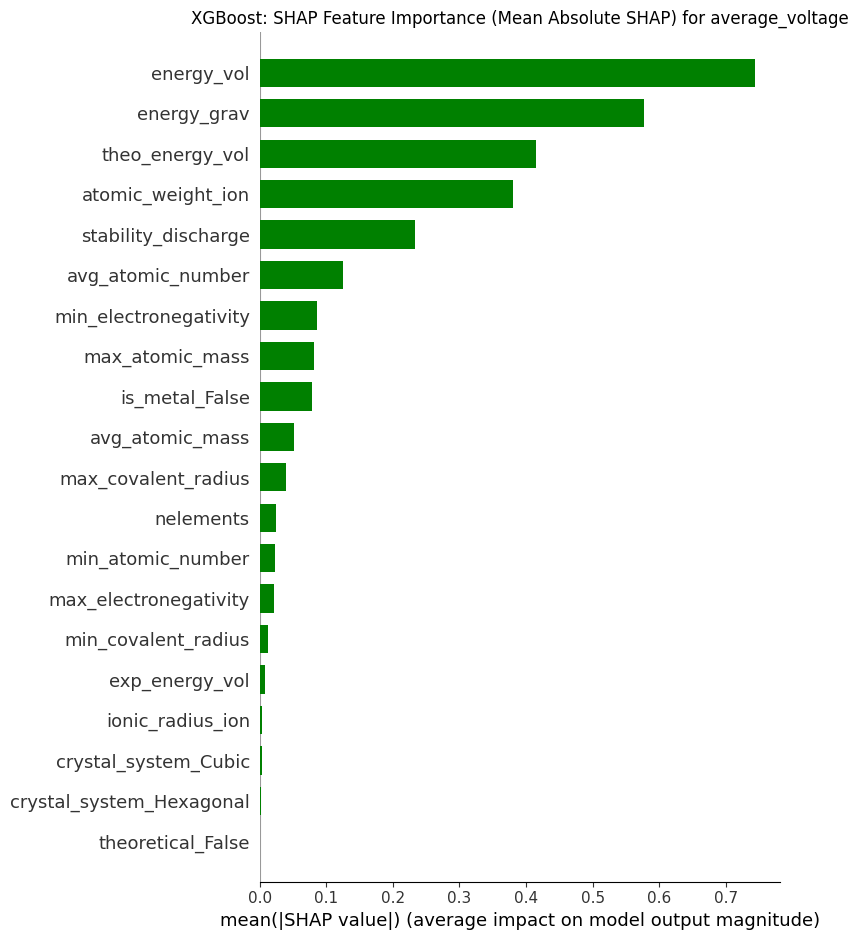

  Generating SHAP Summary (Bar) Plot for KPI: energy_above_hull (XGBoost)


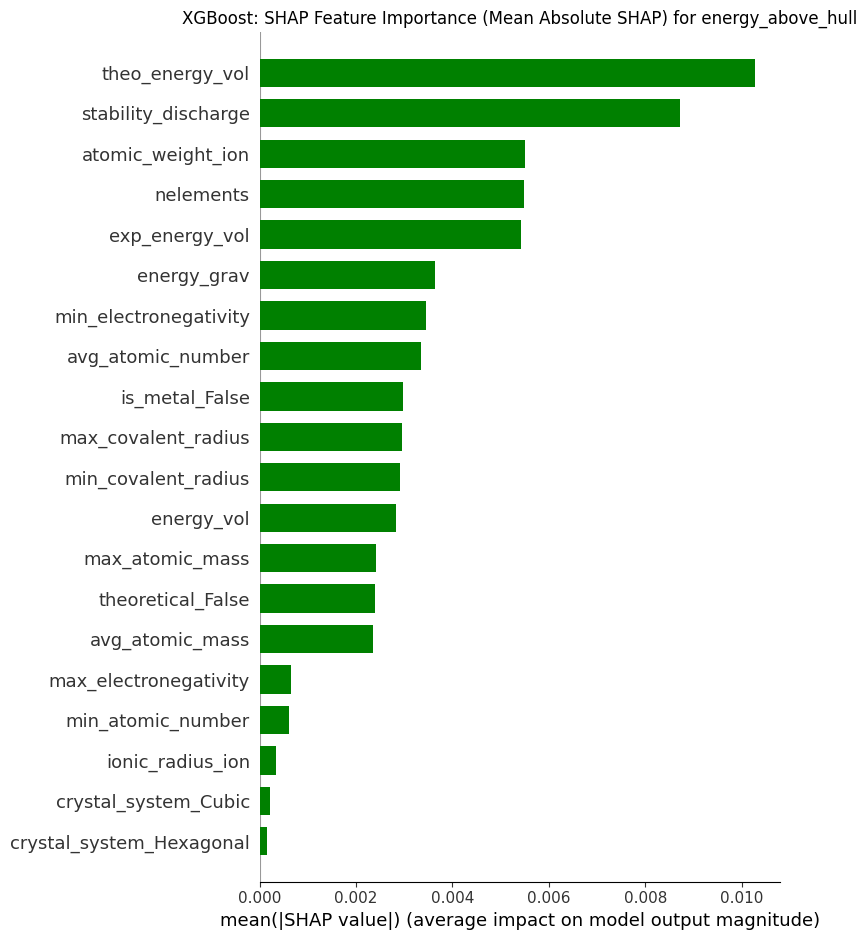


--- Generating SHAP Summary (Bar) Plots for Model: Random Forest ---
  Generating SHAP Summary (Bar) Plot for KPI: theoretical_capacity_grav (Random Forest)


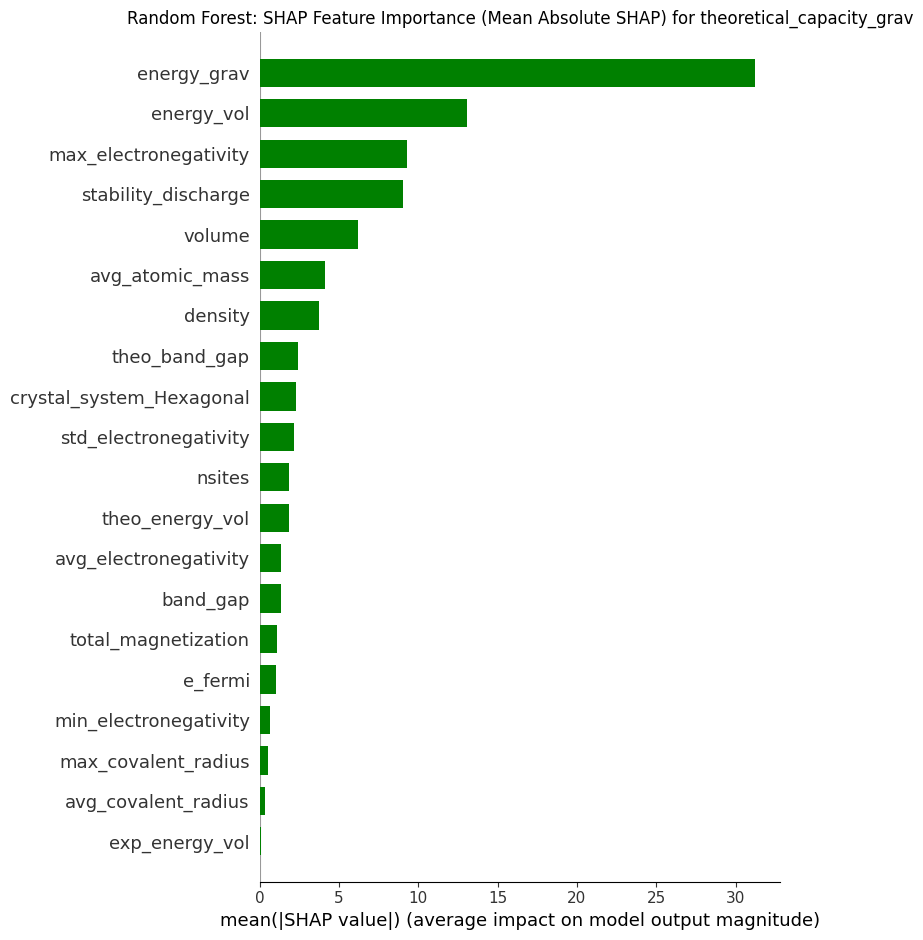

  Generating SHAP Summary (Bar) Plot for KPI: average_voltage (Random Forest)


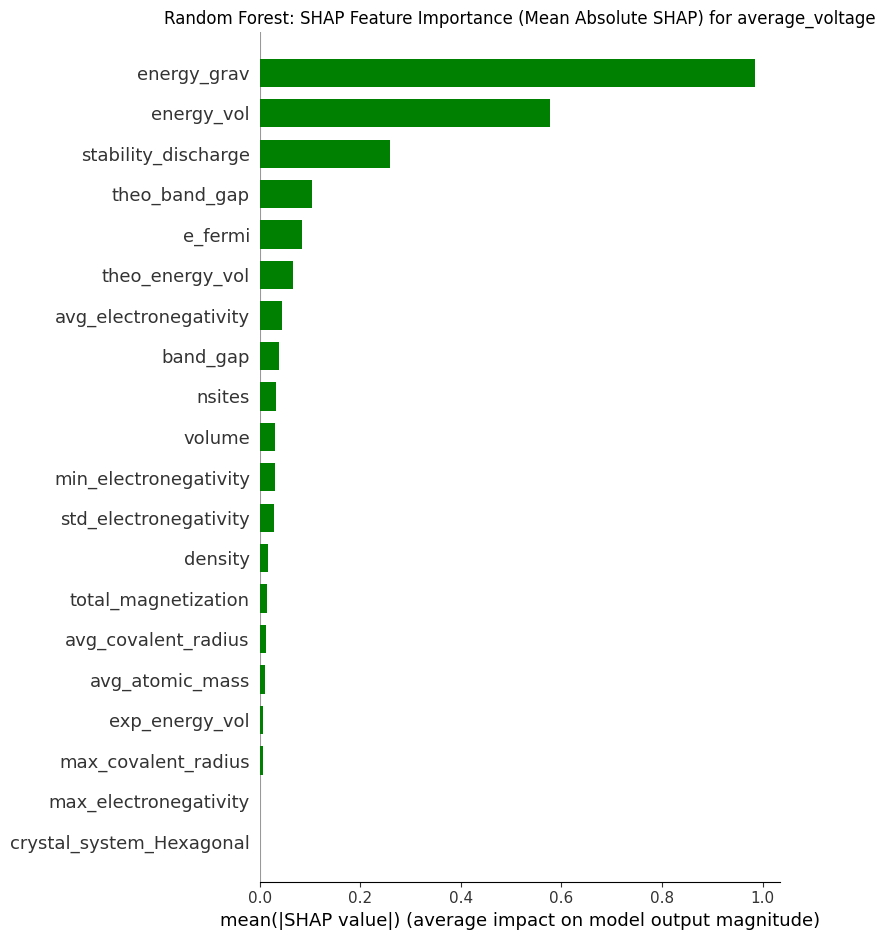

  Generating SHAP Summary (Bar) Plot for KPI: energy_above_hull (Random Forest)


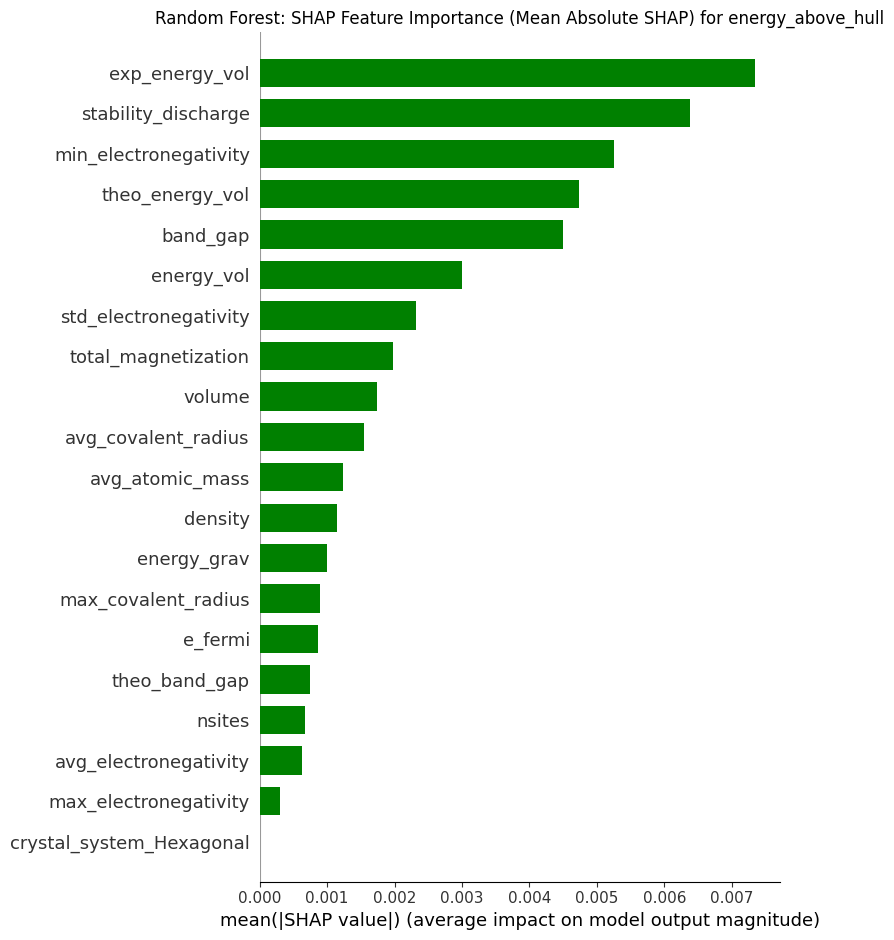


--- Generating SHAP Summary (Bar) Plots for Model: LightGBM ---
  Generating SHAP Summary (Bar) Plot for KPI: theoretical_capacity_grav (LightGBM)


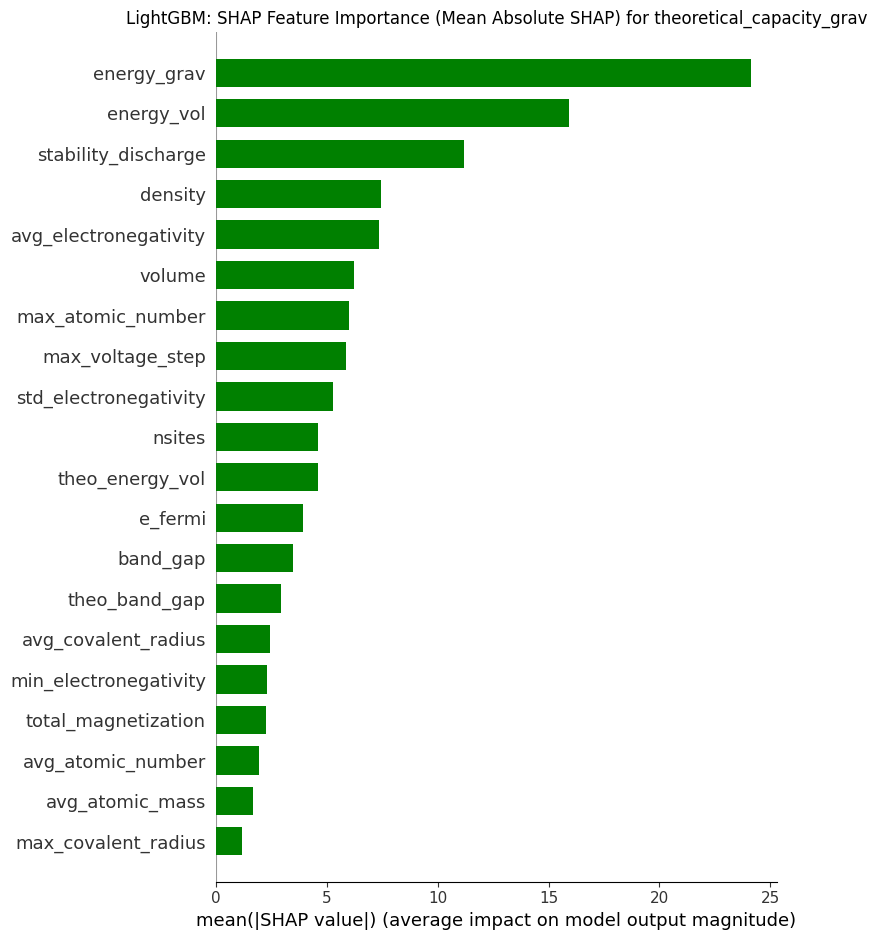

  Generating SHAP Summary (Bar) Plot for KPI: average_voltage (LightGBM)


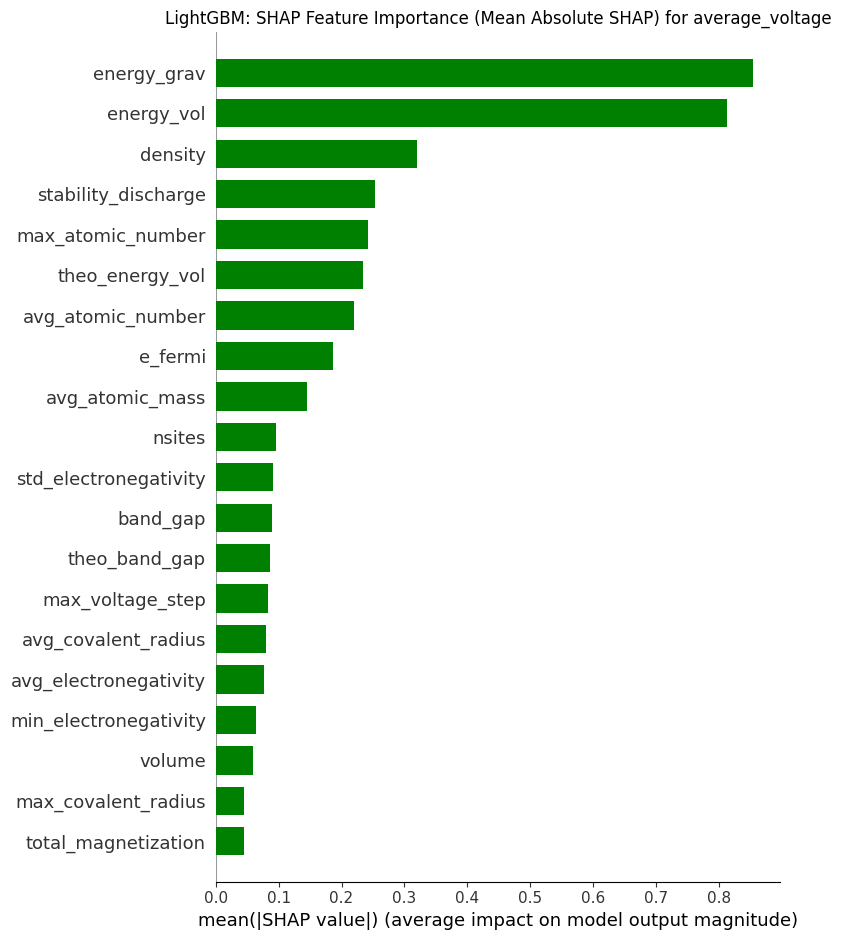

  Generating SHAP Summary (Bar) Plot for KPI: energy_above_hull (LightGBM)


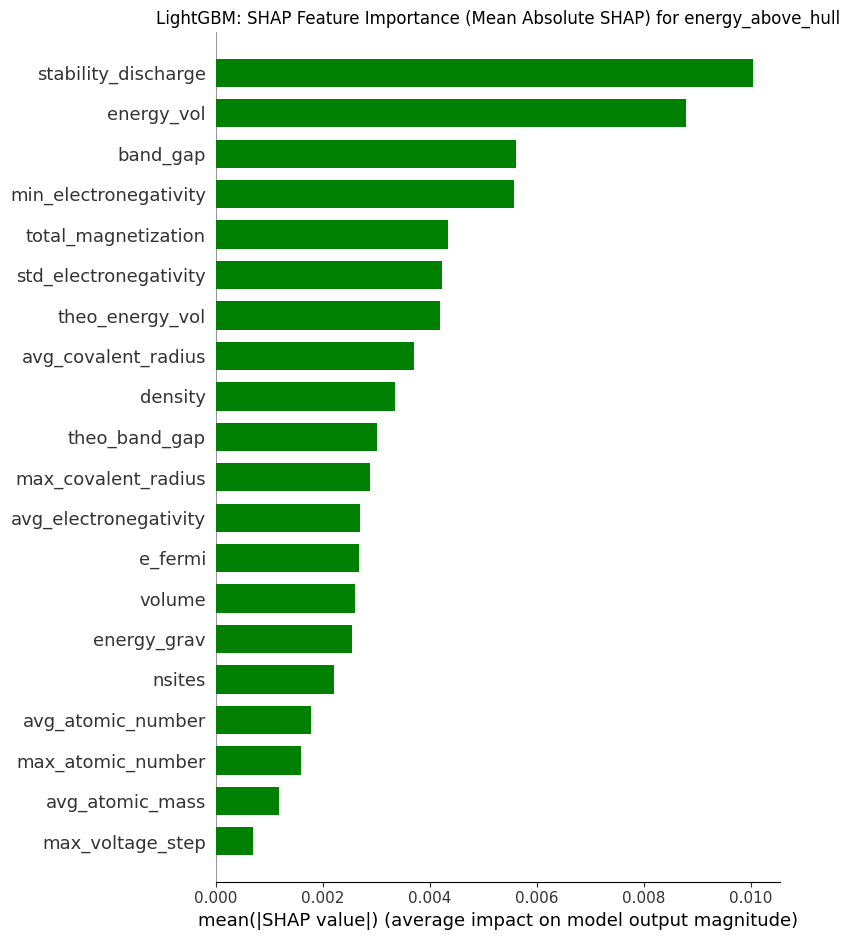


--- Overall SHAP Summary (Bar) Plots Complete ---


In [19]:
# Generate SHAP Summary (Bar) Plots for each KPI for all models

print("\n--- Generating SHAP Summary (Bar) Plots for All Models ---")

if 'all_models_shap_results' in locals() and isinstance(all_models_shap_results, dict) and \
   'X_test_scaled_dfs' in locals() and isinstance(X_test_scaled_dfs, dict) and 'target_kpis' in locals():

    # Iterate through each model's SHAP results
    for model_name, model_shap_results in all_models_shap_results.items():
        print(f"\n--- Generating SHAP Summary (Bar) Plots for Model: {model_name} ---")

        # Get the corresponding scaled test data for this model (needed for feature names)
        if model_name in X_test_scaled_dfs:
             X_shap = X_test_scaled_dfs[model_name]
        else:
             print(f"  Skipping plots for {model_name}: Scaled test data not found in X_test_scaled_dfs.")
             continue # Skip to the next model


        # Iterate through each KPI's SHAP results for the current model
        for kpi in target_kpis:
            if kpi in model_shap_results and 'shap_values' in model_shap_results[kpi]:
                print(f"  Generating SHAP Summary (Bar) Plot for KPI: {kpi} ({model_name})")
                shap_values = model_shap_results[kpi]['shap_values']

                try:
                    # Use the correct X_shap DataFrame for feature names
                    shap.summary_plot(shap_values, X_shap, plot_type="bar", show=False, color='green')
                    plt.title(f'{model_name}: SHAP Feature Importance (Mean Absolute SHAP) for {kpi}') # Include model name in title
                    plt.tight_layout()
                    plt.show()
                except Exception as e:
                    print(f"    Could not generate SHAP Summary (Bar) Plot for {kpi} ({model_name}): {e}")

            else:
                print(f"  SHAP values for {kpi} ({model_name}) not found in all_models_shap_results. Skipping bar plot.")

else:
    print("Required variables (all_models_shap_results, X_test_scaled_dfs, target_kpis) not found or are not correctly structured. Please run previous cells.")

print("\n--- Overall SHAP Summary (Bar) Plots Complete ---")

#### SHAP Dependence Plots


--- Generating SHAP Dependence Plots for All Models ---

--- Generating SHAP Dependence Plots for Model: XGBoost ---
  Analyzing SHAP for KPI: theoretical_capacity_grav (XGBoost) to find top features for dependence plots...
  Top 5 features for theoretical_capacity_grav (XGBoost): ['energy_grav', 'atomic_weight_ion', 'stability_discharge', 'energy_vol', 'max_electronegativity']
    Generating dependence plot for feature: energy_grav


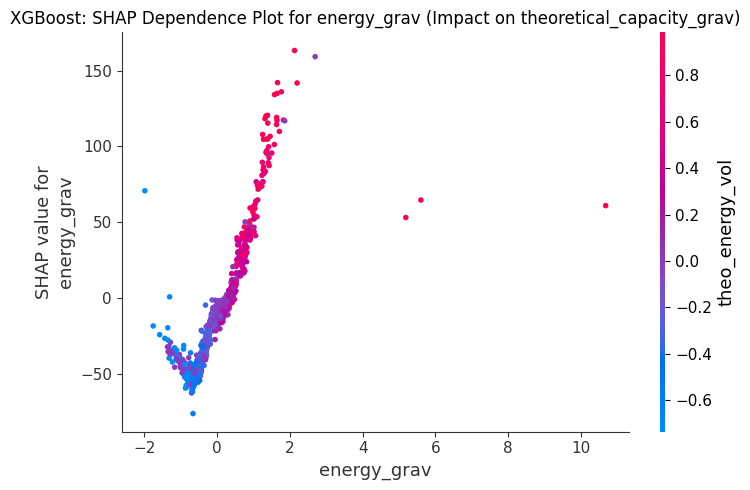

    Generating dependence plot for feature: atomic_weight_ion


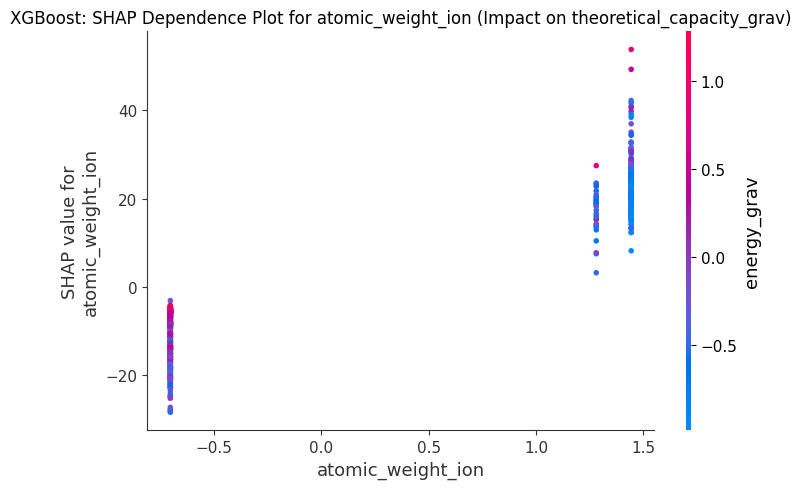

    Generating dependence plot for feature: stability_discharge


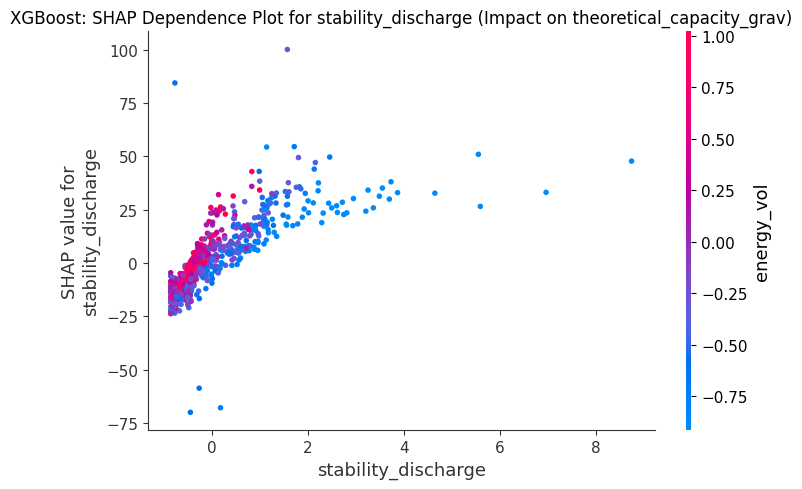

    Generating dependence plot for feature: energy_vol


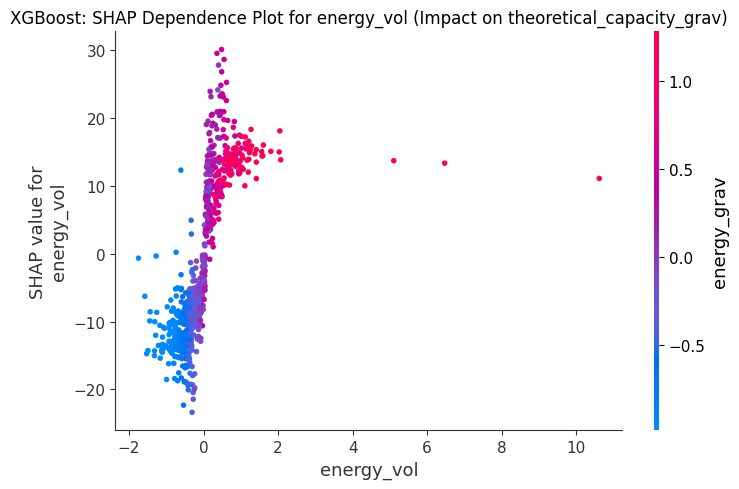

    Generating dependence plot for feature: max_electronegativity


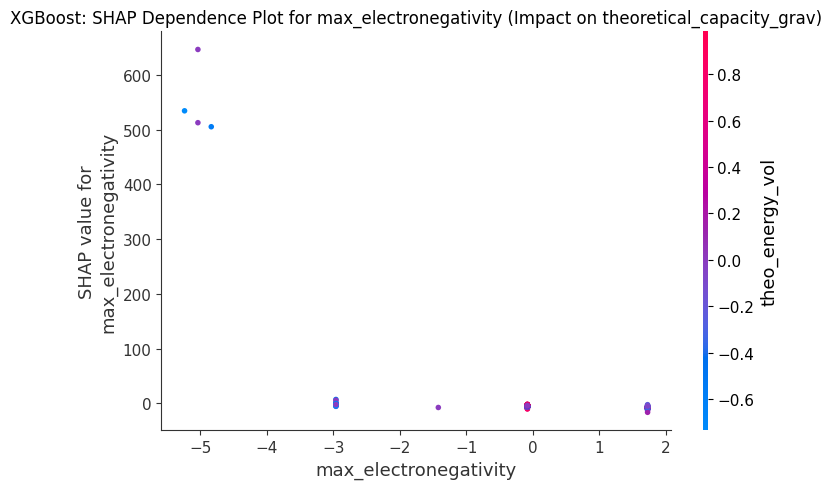

  Analyzing SHAP for KPI: average_voltage (XGBoost) to find top features for dependence plots...
  Top 5 features for average_voltage (XGBoost): ['energy_vol', 'energy_grav', 'theo_energy_vol', 'atomic_weight_ion', 'stability_discharge']
    Generating dependence plot for feature: energy_vol


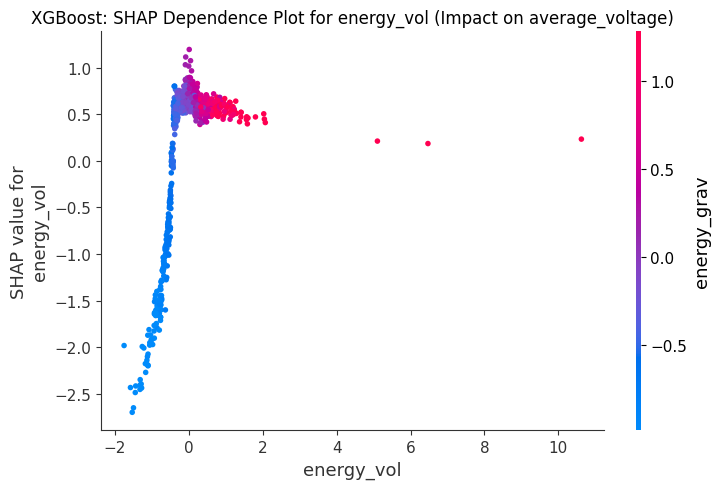

    Generating dependence plot for feature: energy_grav


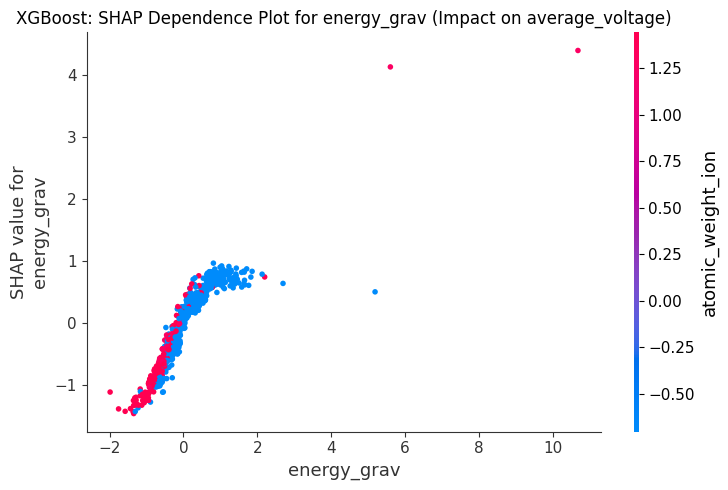

    Generating dependence plot for feature: theo_energy_vol


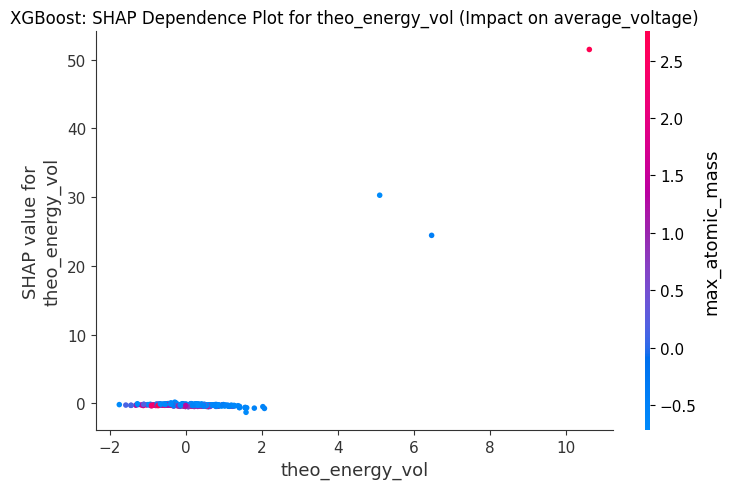

    Generating dependence plot for feature: atomic_weight_ion


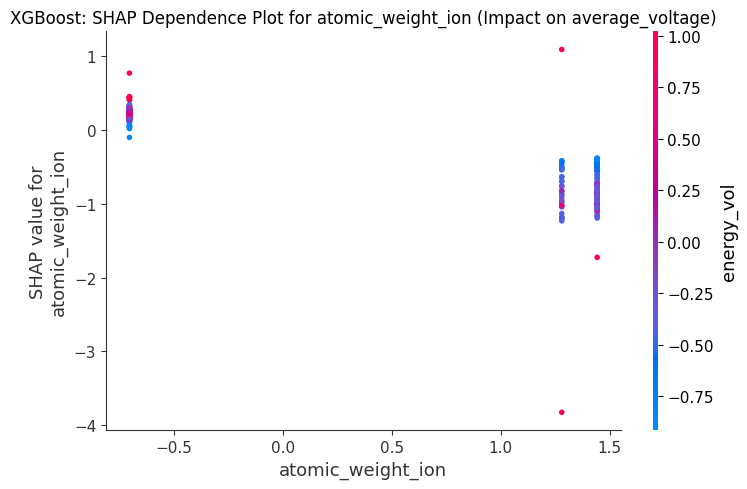

    Generating dependence plot for feature: stability_discharge


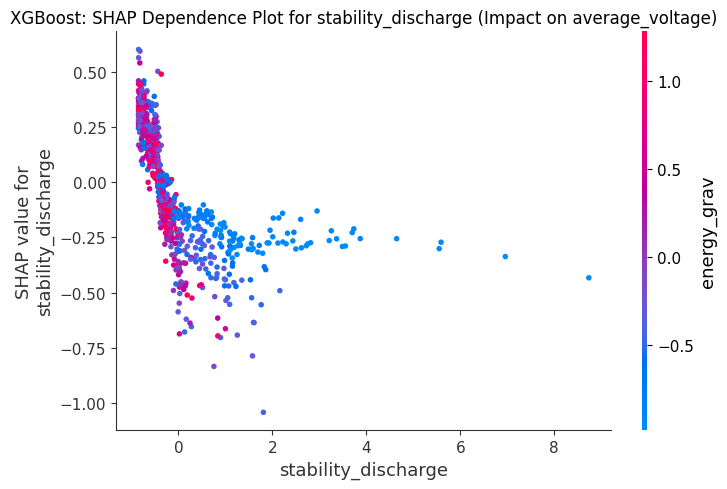

  Analyzing SHAP for KPI: energy_above_hull (XGBoost) to find top features for dependence plots...
  Top 5 features for energy_above_hull (XGBoost): ['theo_energy_vol', 'stability_discharge', 'atomic_weight_ion', 'nelements', 'exp_energy_vol']
    Generating dependence plot for feature: theo_energy_vol


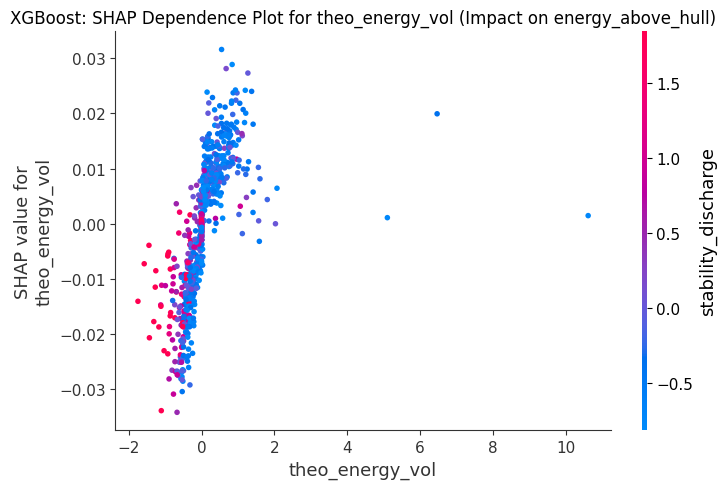

    Generating dependence plot for feature: stability_discharge


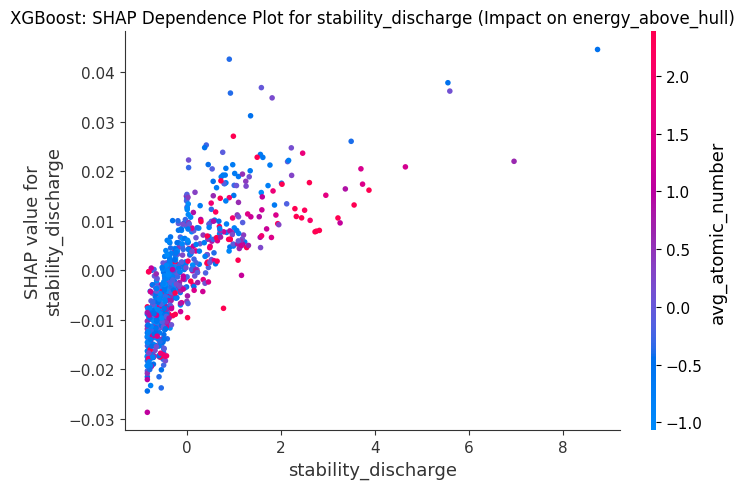

    Generating dependence plot for feature: atomic_weight_ion


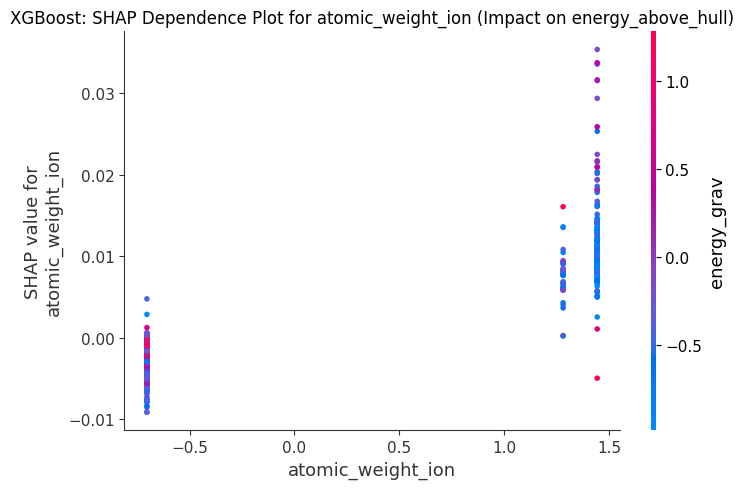

    Generating dependence plot for feature: nelements


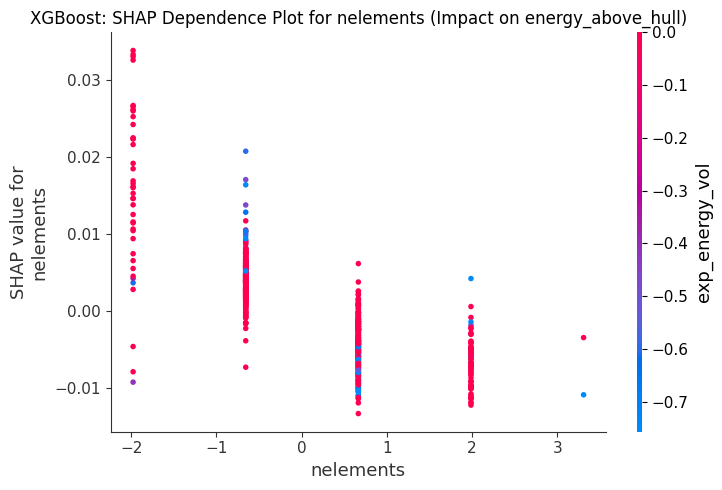

    Generating dependence plot for feature: exp_energy_vol


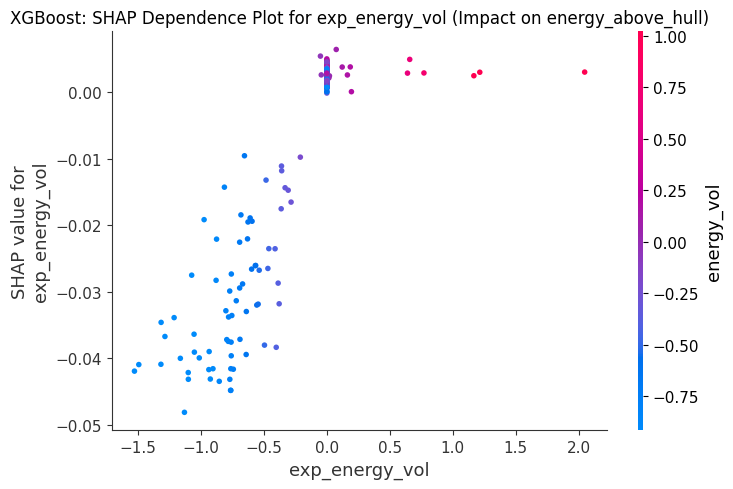


--- Generating SHAP Dependence Plots for Model: Random Forest ---
  Analyzing SHAP for KPI: theoretical_capacity_grav (Random Forest) to find top features for dependence plots...
  Top 5 features for theoretical_capacity_grav (Random Forest): ['energy_grav', 'energy_vol', 'max_electronegativity', 'stability_discharge', 'volume']
    Generating dependence plot for feature: energy_grav


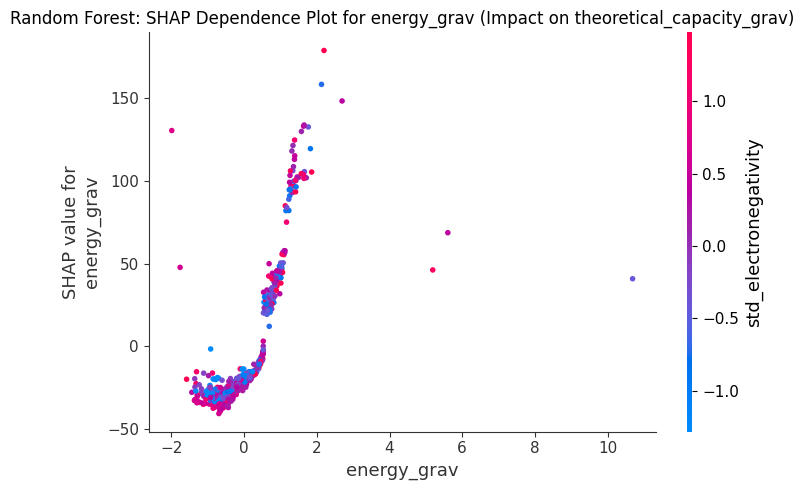

    Generating dependence plot for feature: energy_vol


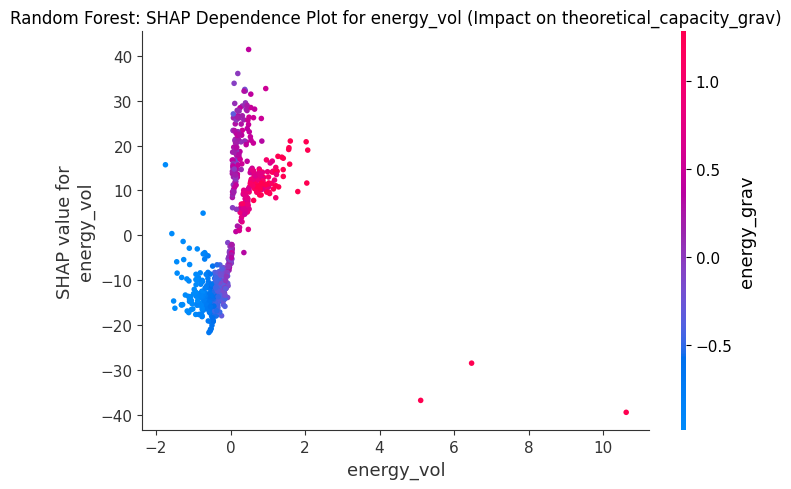

    Generating dependence plot for feature: max_electronegativity


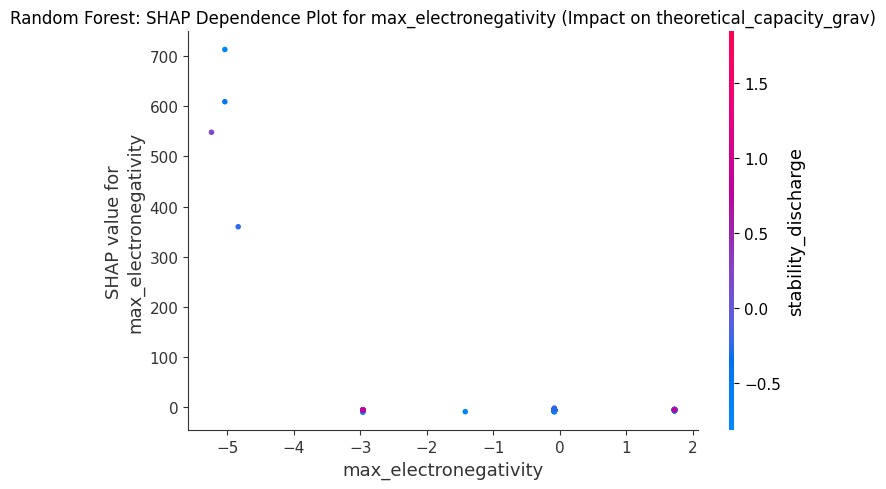

    Generating dependence plot for feature: stability_discharge


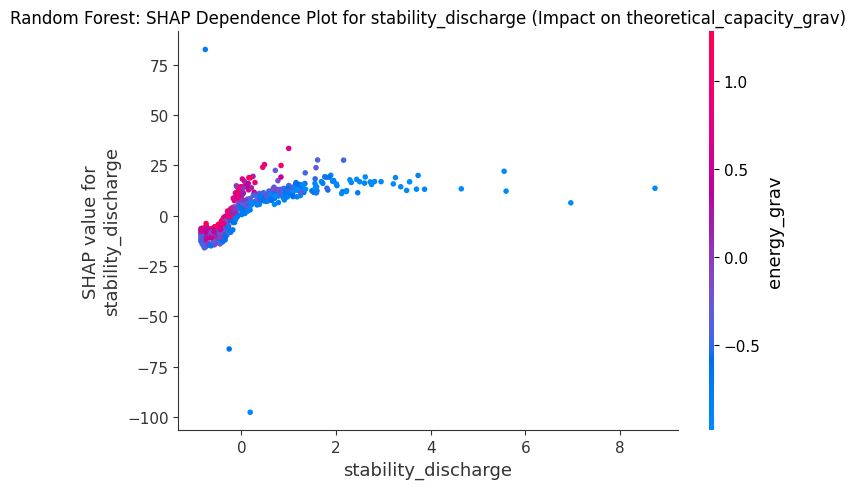

    Generating dependence plot for feature: volume


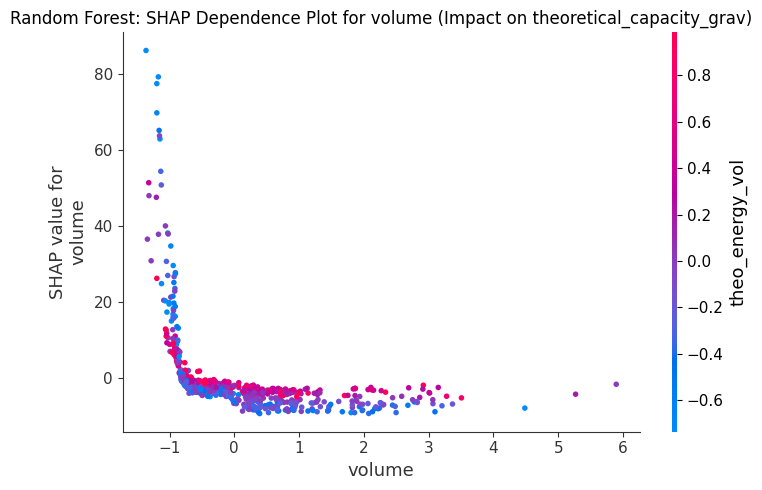

  Analyzing SHAP for KPI: average_voltage (Random Forest) to find top features for dependence plots...
  Top 5 features for average_voltage (Random Forest): ['energy_grav', 'energy_vol', 'stability_discharge', 'theo_band_gap', 'e_fermi']
    Generating dependence plot for feature: energy_grav


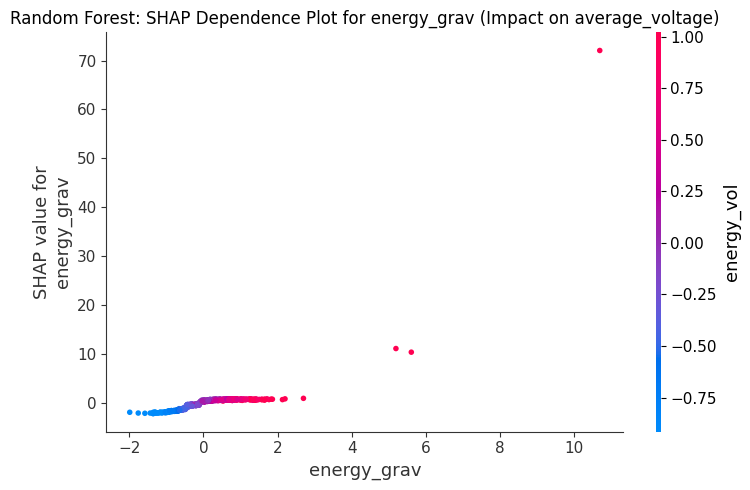

    Generating dependence plot for feature: energy_vol


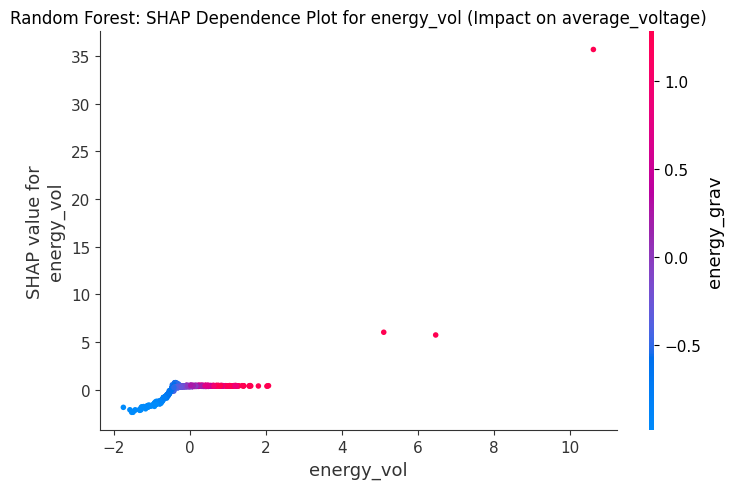

    Generating dependence plot for feature: stability_discharge


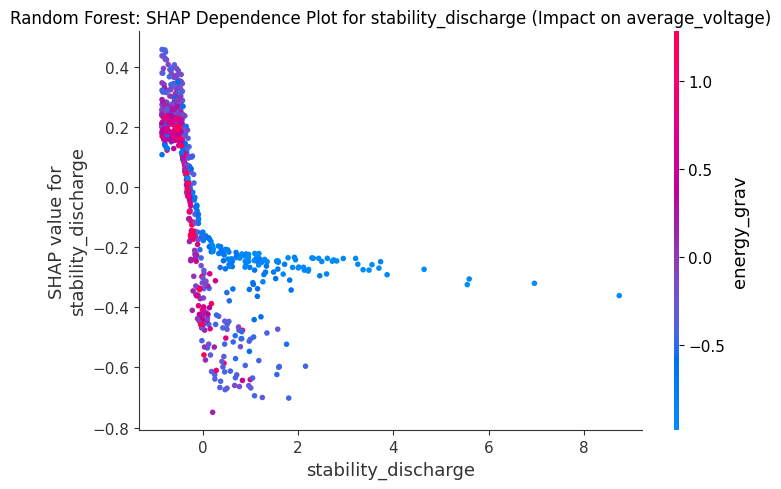

    Generating dependence plot for feature: theo_band_gap


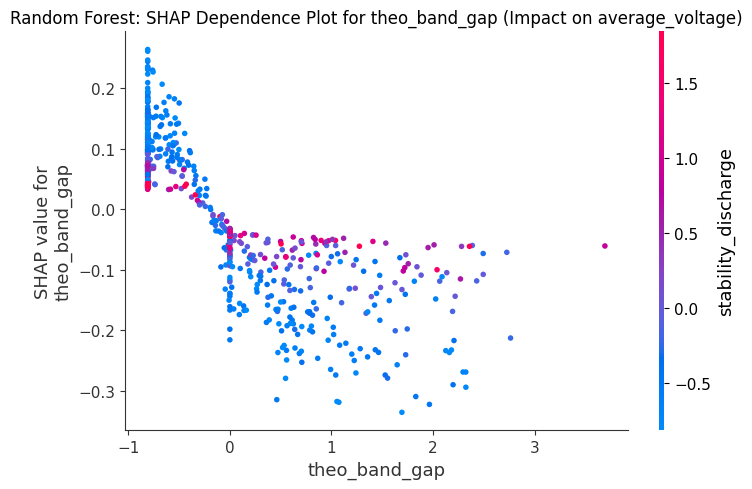

    Generating dependence plot for feature: e_fermi


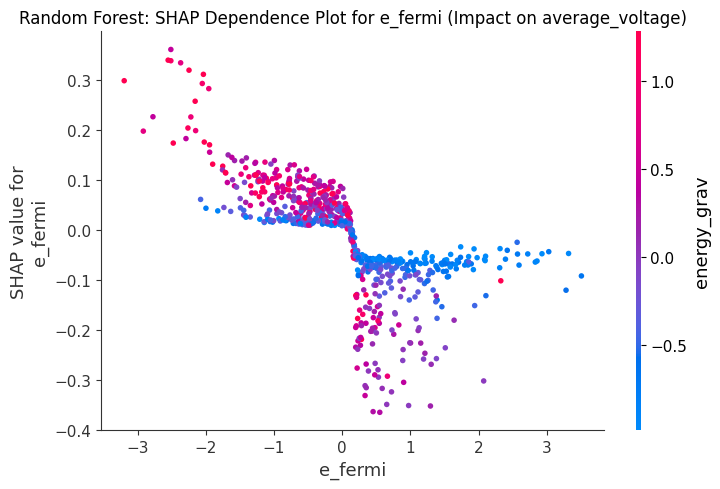

  Analyzing SHAP for KPI: energy_above_hull (Random Forest) to find top features for dependence plots...
  Top 5 features for energy_above_hull (Random Forest): ['exp_energy_vol', 'stability_discharge', 'min_electronegativity', 'theo_energy_vol', 'band_gap']
    Generating dependence plot for feature: exp_energy_vol


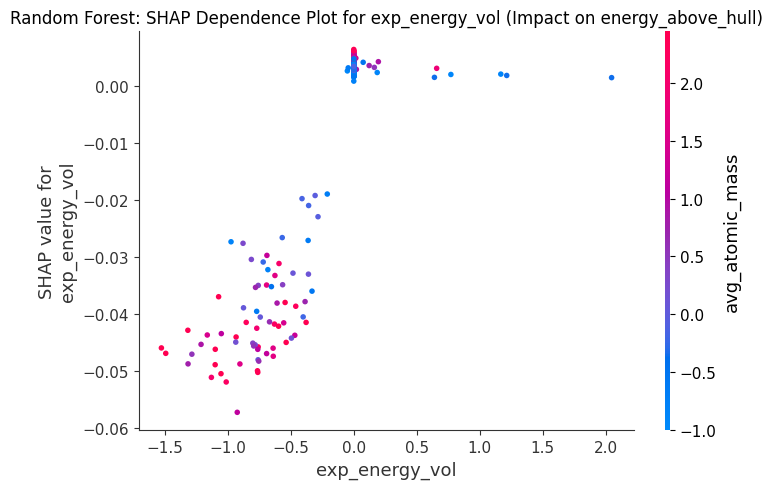

    Generating dependence plot for feature: stability_discharge


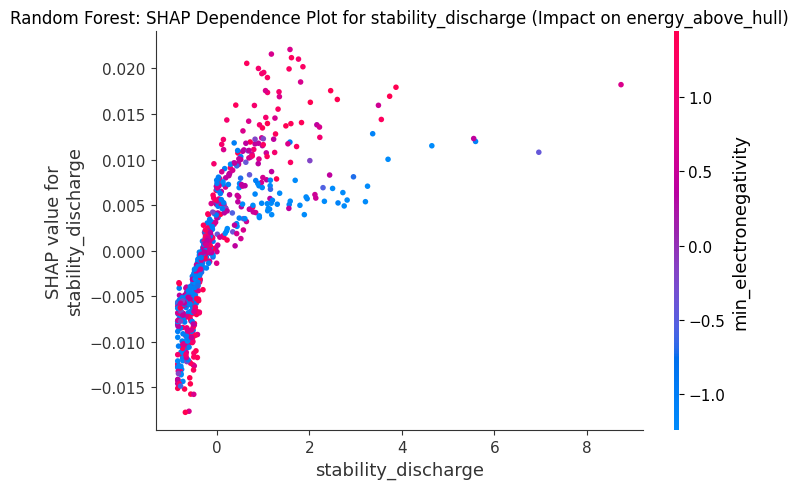

    Generating dependence plot for feature: min_electronegativity


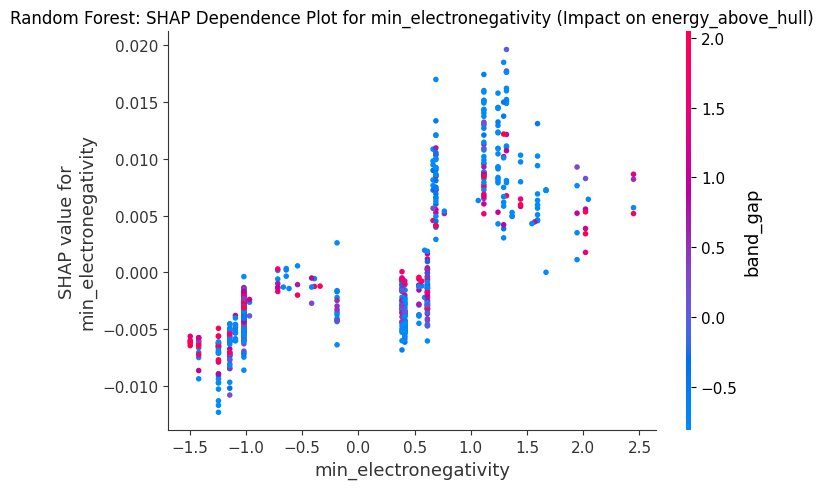

    Generating dependence plot for feature: theo_energy_vol


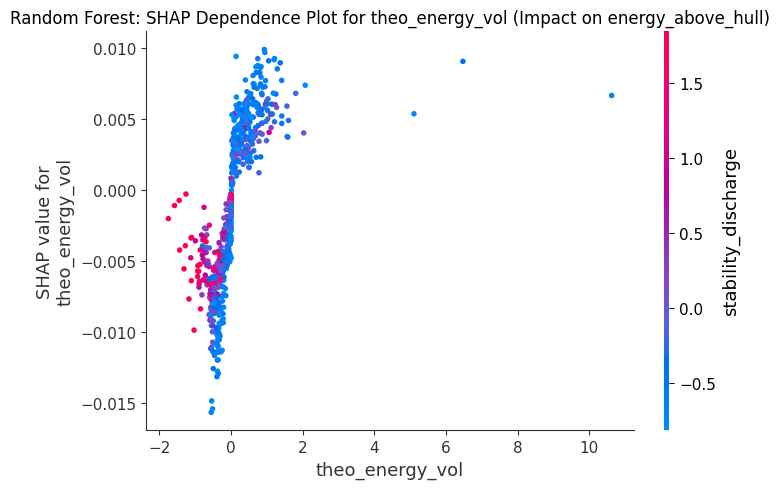

    Generating dependence plot for feature: band_gap


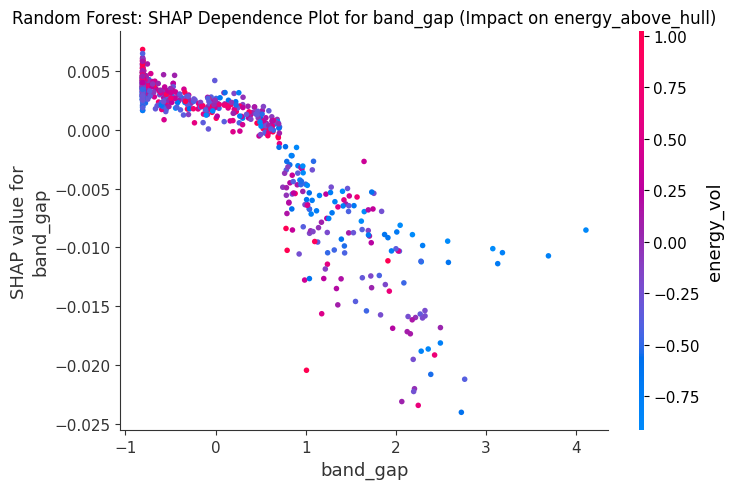


--- Generating SHAP Dependence Plots for Model: LightGBM ---
  Analyzing SHAP for KPI: theoretical_capacity_grav (LightGBM) to find top features for dependence plots...
  Top 5 features for theoretical_capacity_grav (LightGBM): ['energy_grav', 'energy_vol', 'stability_discharge', 'density', 'avg_electronegativity']
    Generating dependence plot for feature: energy_grav


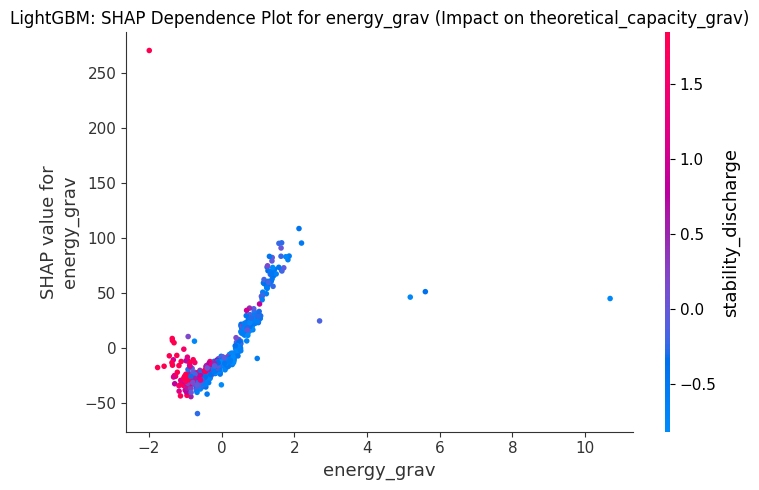

    Generating dependence plot for feature: energy_vol


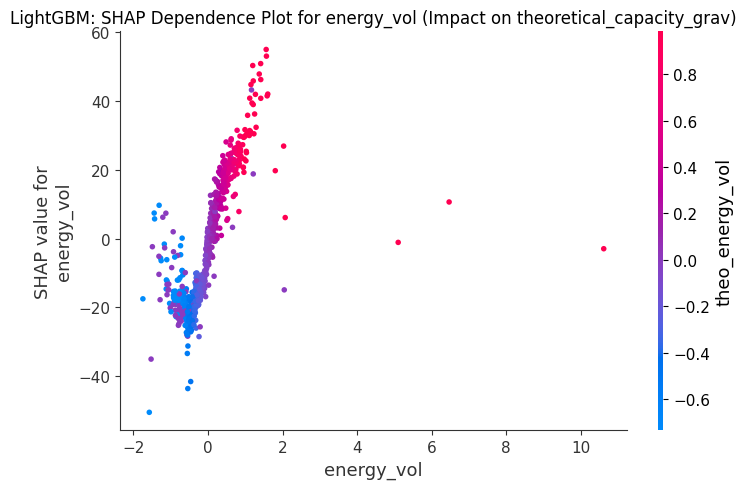

    Generating dependence plot for feature: stability_discharge


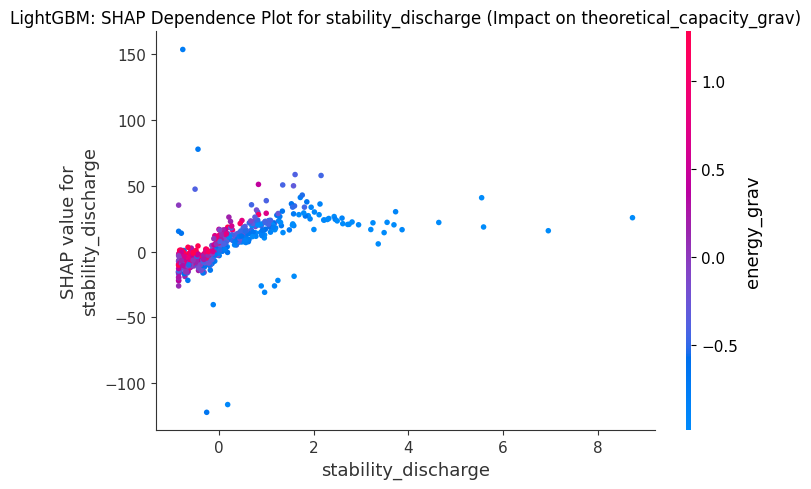

    Generating dependence plot for feature: density


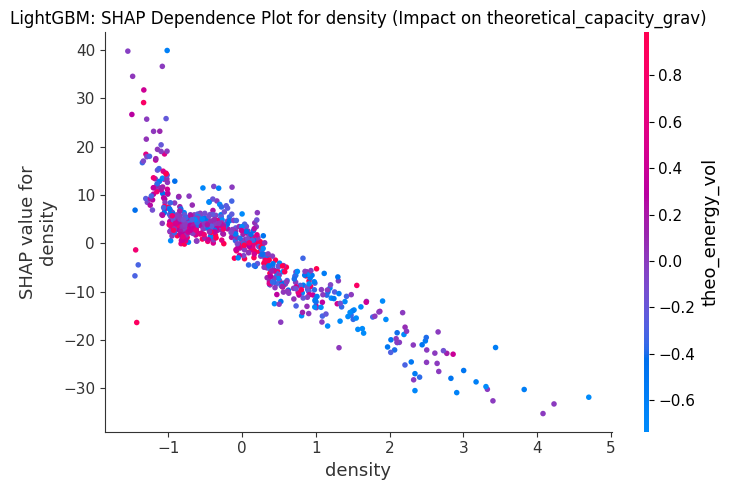

    Generating dependence plot for feature: avg_electronegativity


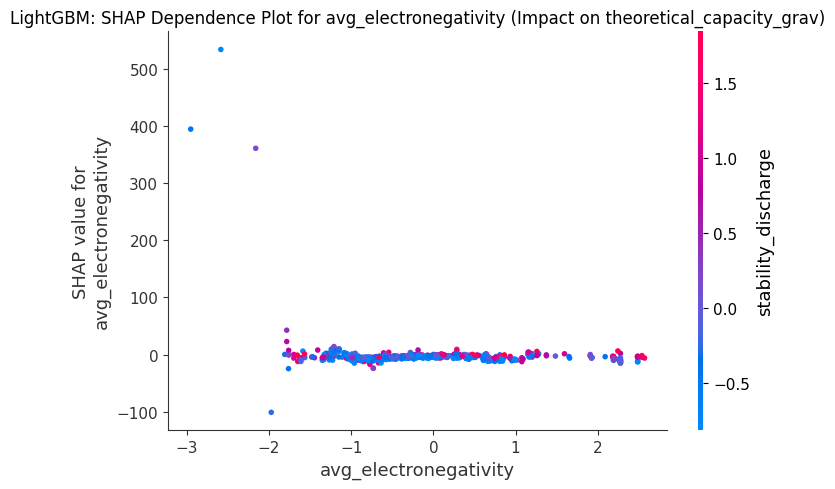

  Analyzing SHAP for KPI: average_voltage (LightGBM) to find top features for dependence plots...
  Top 5 features for average_voltage (LightGBM): ['energy_grav', 'energy_vol', 'density', 'stability_discharge', 'max_atomic_number']
    Generating dependence plot for feature: energy_grav


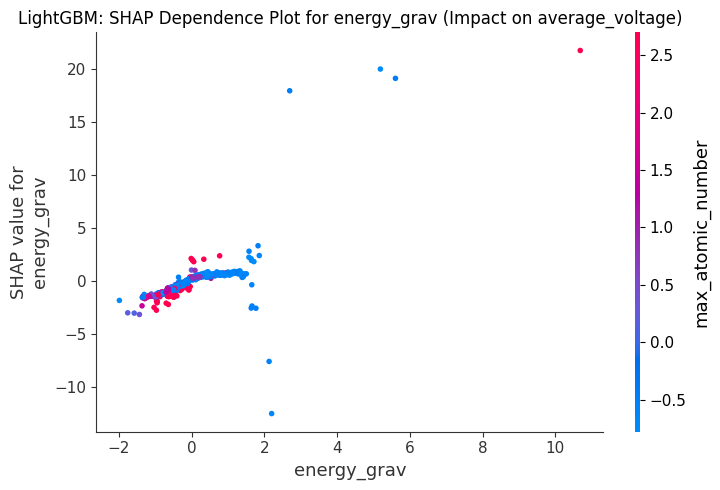

    Generating dependence plot for feature: energy_vol


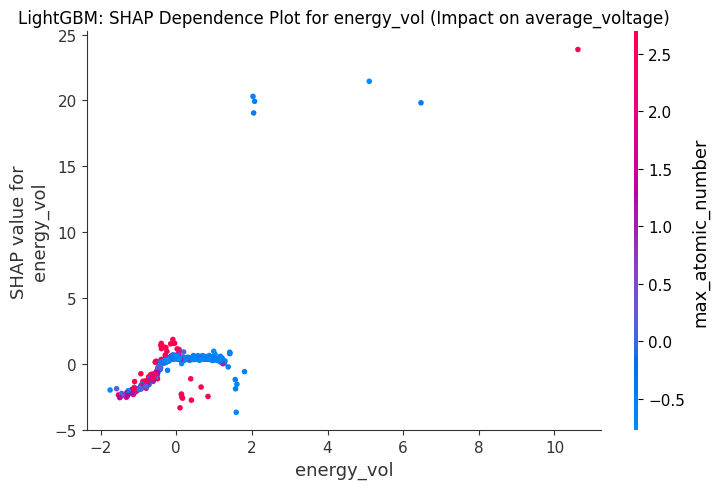

    Generating dependence plot for feature: density


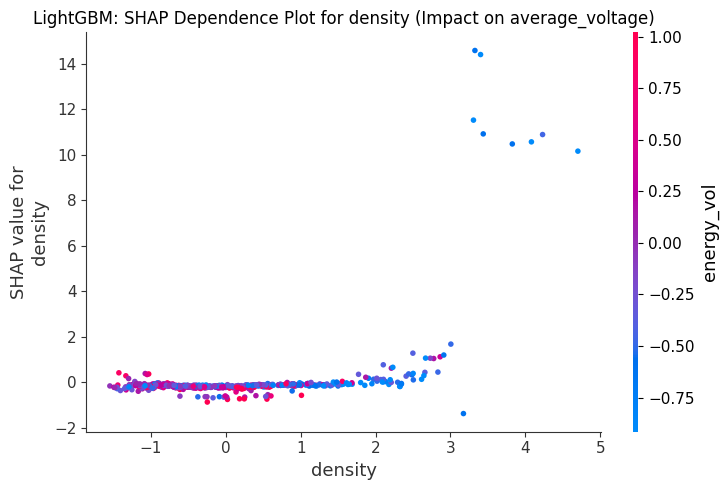

    Generating dependence plot for feature: stability_discharge


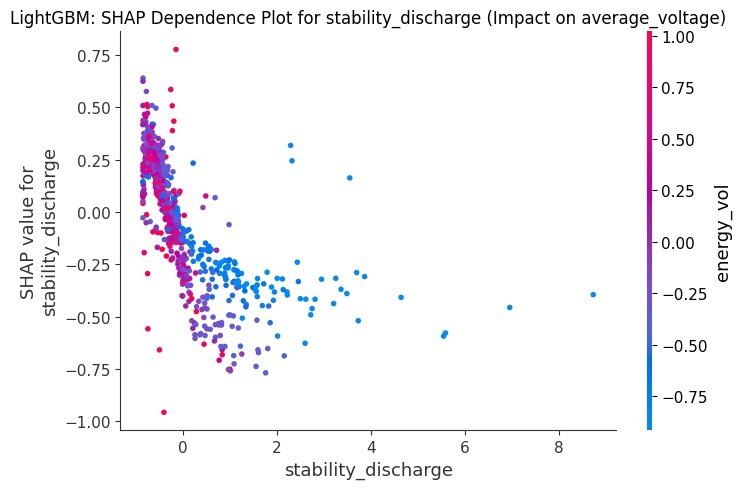

    Generating dependence plot for feature: max_atomic_number


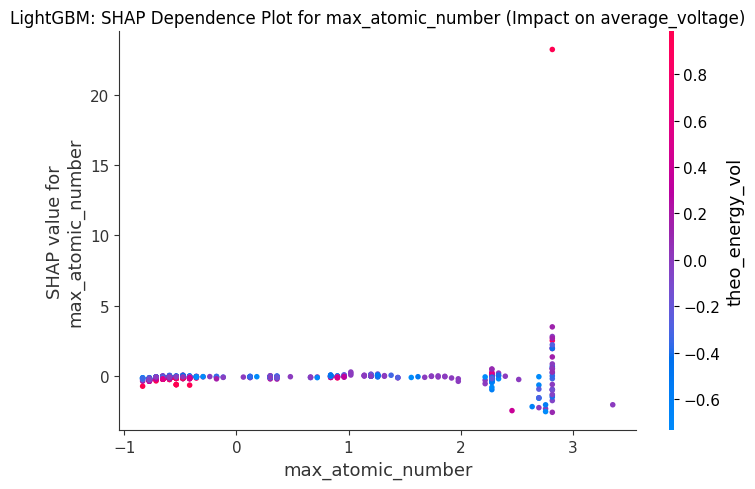

  Analyzing SHAP for KPI: energy_above_hull (LightGBM) to find top features for dependence plots...
  Top 5 features for energy_above_hull (LightGBM): ['stability_discharge', 'energy_vol', 'band_gap', 'min_electronegativity', 'total_magnetization']
    Generating dependence plot for feature: stability_discharge


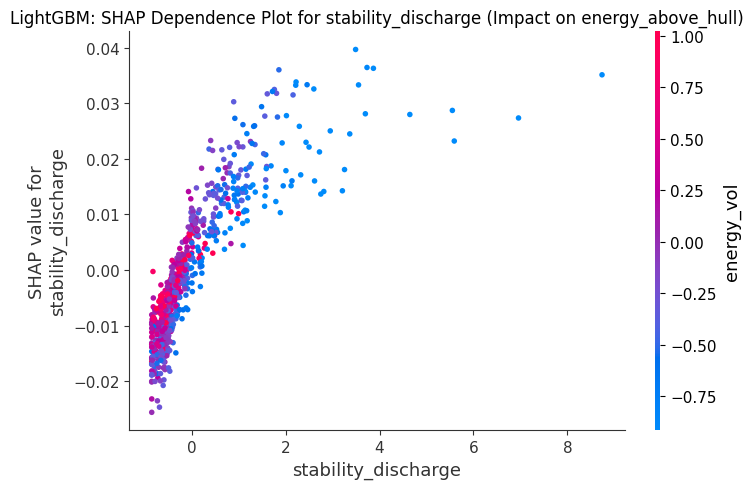

    Generating dependence plot for feature: energy_vol


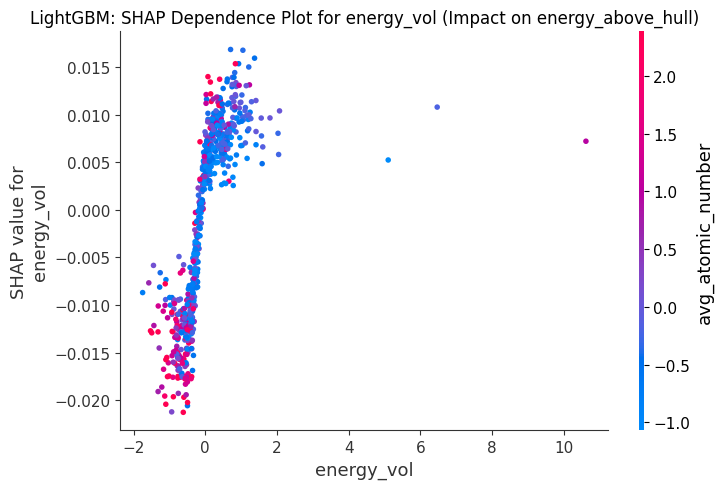

    Generating dependence plot for feature: band_gap


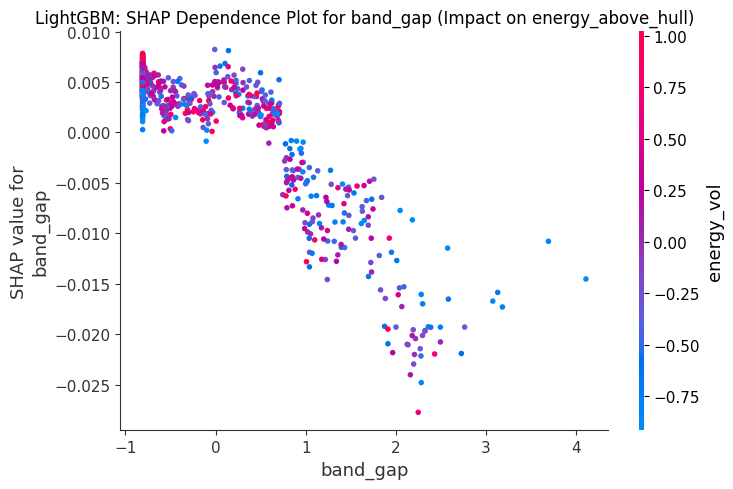

    Generating dependence plot for feature: min_electronegativity


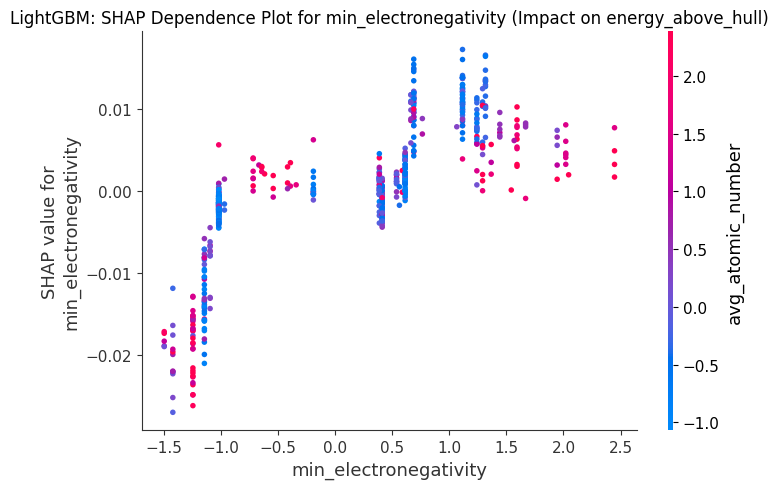

    Generating dependence plot for feature: total_magnetization


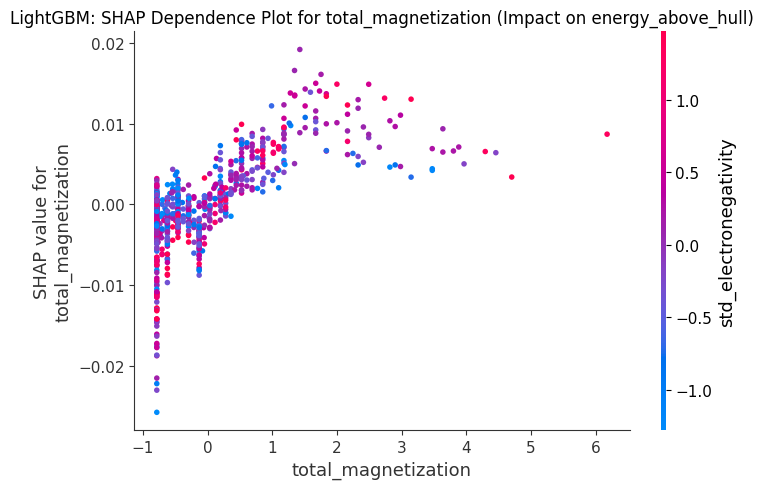


--- Overall SHAP Dependence Plots Complete ---


In [20]:
# Generate SHAP Dependence Plots for the top features of each KPI for all models

print("\n--- Generating SHAP Dependence Plots for All Models ---")

if 'all_models_shap_results' in locals() and isinstance(all_models_shap_results, dict) and \
   'X_test_scaled_dfs' in locals() and isinstance(X_test_scaled_dfs, dict) and \
   'target_kpis' in locals():

    top_n_features = 5 # Define how many top features to plot dependence for

    # Iterate through each model's SHAP results
    for model_name, model_shap_results in all_models_shap_results.items():
        print(f"\n--- Generating SHAP Dependence Plots for Model: {model_name} ---")

        # Get the corresponding scaled test data for this model (needed for feature names)
        if model_name in X_test_scaled_dfs:
             X_shap = X_test_scaled_dfs[model_name]
        else:
             print(f"  Skipping dependence plots for {model_name}: Scaled test data not found in X_test_scaled_dfs.")
             continue # Skip to the next model

        # Iterate through each KPI's SHAP results for the current model
        for kpi in target_kpis:
            if kpi in model_shap_results and 'shap_values' in model_shap_results[kpi]:
                print(f"  Analyzing SHAP for KPI: {kpi} ({model_name}) to find top features for dependence plots...")
                shap_values = model_shap_results[kpi]['shap_values']

                # Calculate mean absolute SHAP values to find top features for the current KPI and model
                mean_abs_shap_values = np.abs(shap_values).mean(axis=0)
                feature_importances = pd.Series(mean_abs_shap_values, index=X_shap.columns) # Use X_shap columns for feature names
                top_features = feature_importances.sort_values(ascending=False).head(top_n_features).index.tolist()

                print(f"  Top {top_n_features} features for {kpi} ({model_name}): {top_features}")

                # Generate dependence plot for each top feature
                for feature in top_features:
                    print(f"    Generating dependence plot for feature: {feature}")
                    # Ensure the feature exists in the DataFrame used for plotting
                    if feature in X_shap.columns: # Use X_shap for column check
                        try:
                            shap.dependence_plot(feature, shap_values, X_shap, interaction_index="auto", show=False) # Use X_shap here
                            plt.title(f'{model_name}: SHAP Dependence Plot for {feature} (Impact on {kpi})') # Include model name
                            plt.tight_layout()
                            plt.show()
                        except Exception as e:
                            print(f"      Could not generate dependence plot for {feature} ({model_name}): {e}")
                    else:
                        print(f"      Feature '{feature}' not found in {model_name} X_shap data. Skipping dependence plot.")
            else:
                print(f"  SHAP values for {kpi} ({model_name}) not found in all_models_shap_results. Skipping dependence plots.")

else:
    print("Required variables (all_models_shap_results, X_test_scaled_dfs, target_kpis) not found or are not correctly structured. Please run previous cells.")

print("\n--- Overall SHAP Dependence Plots Complete ---")

### Uncertainty Quantification (Assessing Prediction Confidence)

#### Residual Analysis


--- Starting Residual Analysis for All Models ---

--- Performing Residual Analysis for Model: XGBoost ---
Residuals calculated for XGBoost. Shape: (689, 3)

--- Generating Residuals vs. Predicted Plots for XGBoost ---


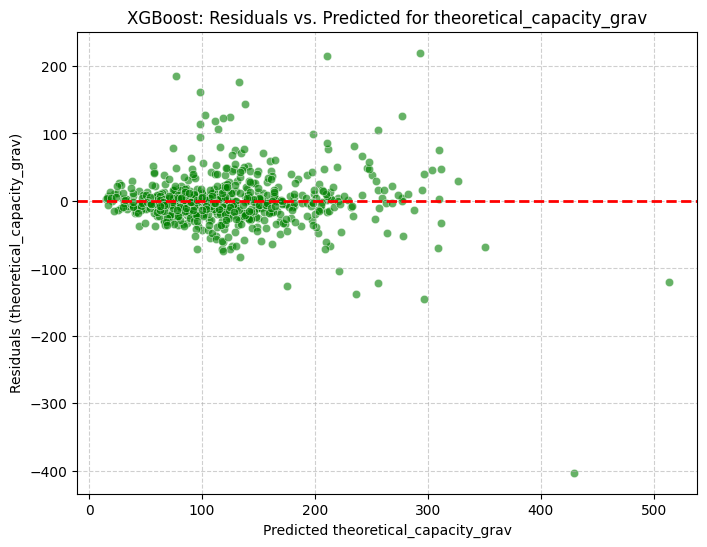

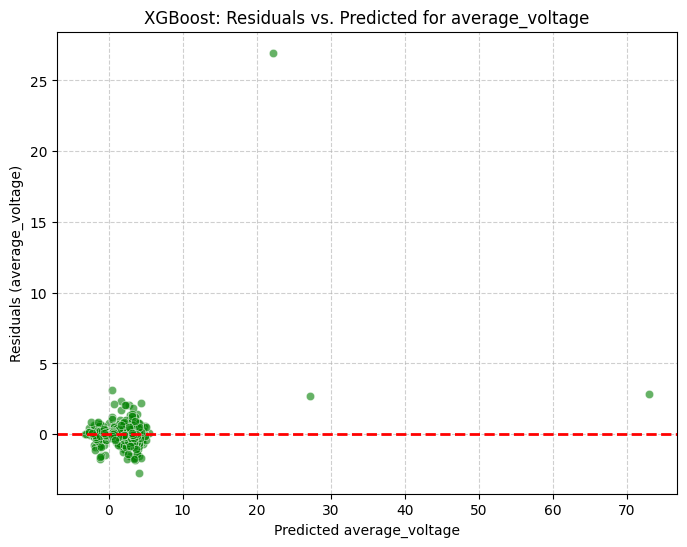

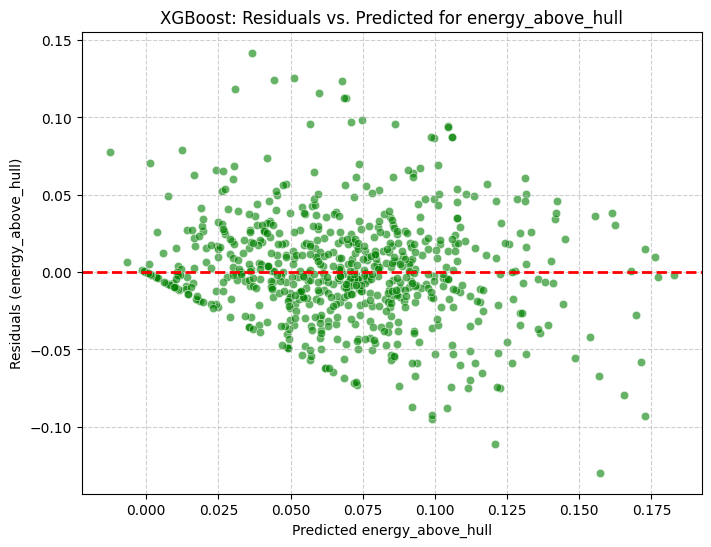


--- Generating Residuals Histograms for XGBoost ---


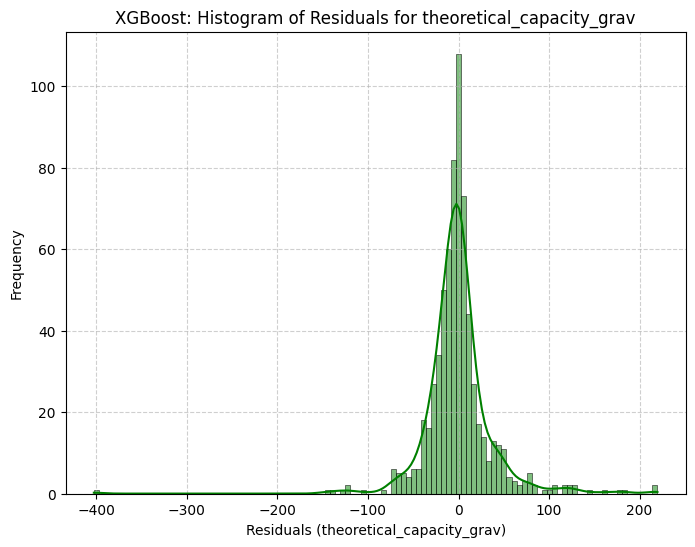

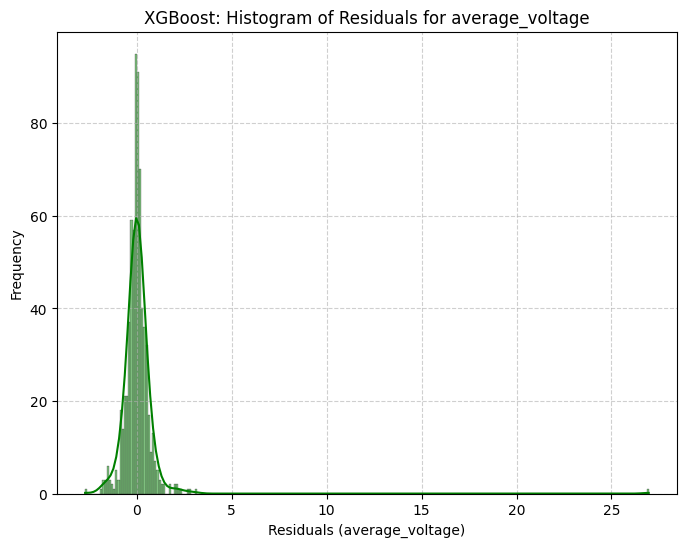

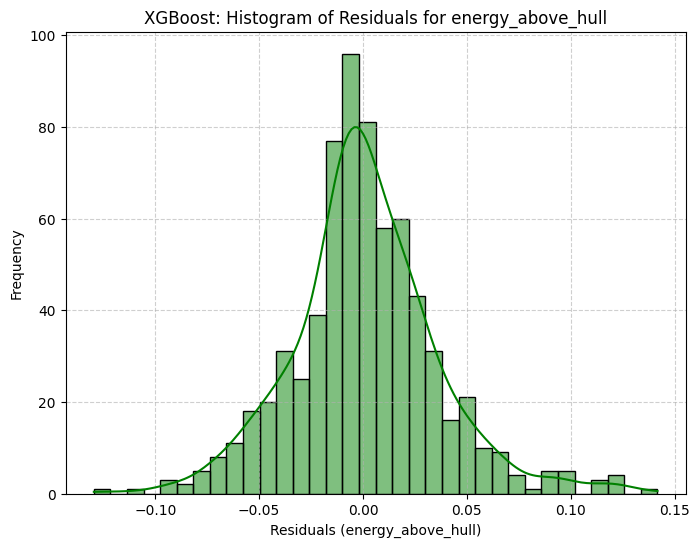


--- Performing Residual Analysis for Model: Random Forest ---
Residuals calculated for Random Forest. Shape: (689, 3)

--- Generating Residuals vs. Predicted Plots for Random Forest ---


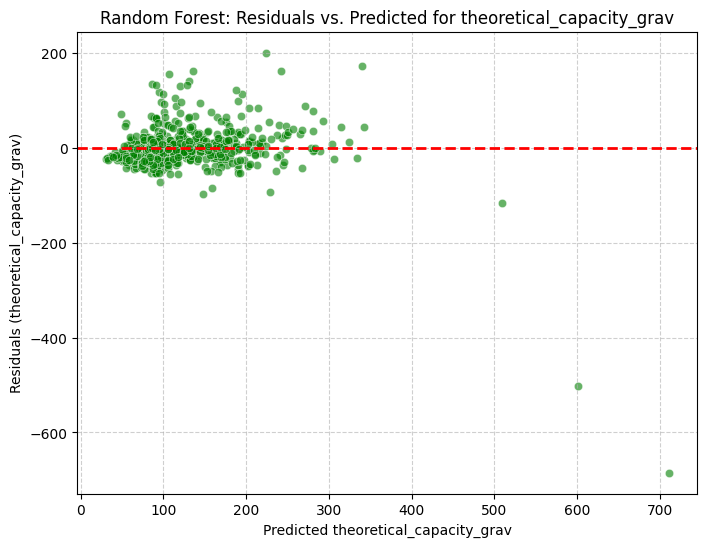

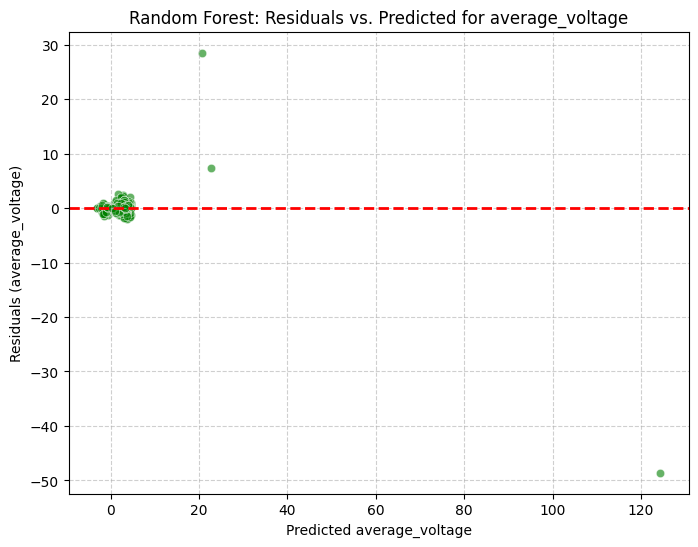

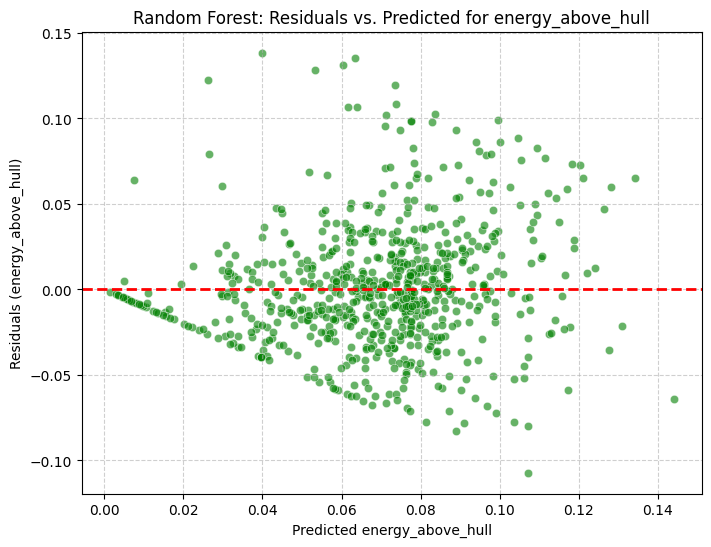


--- Generating Residuals Histograms for Random Forest ---


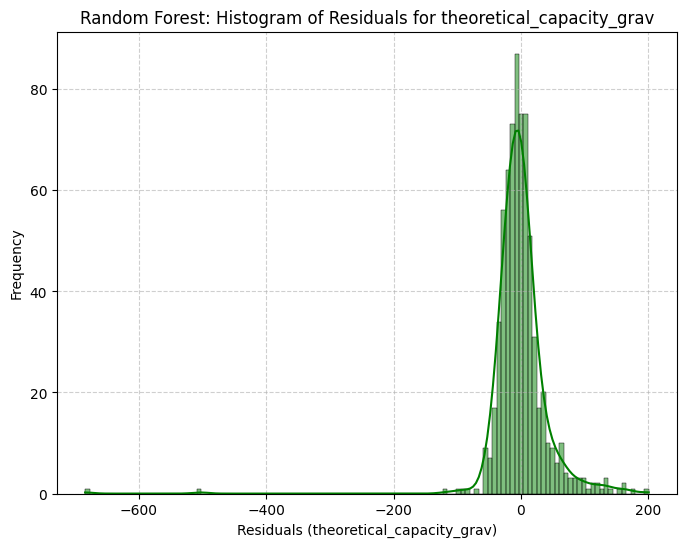

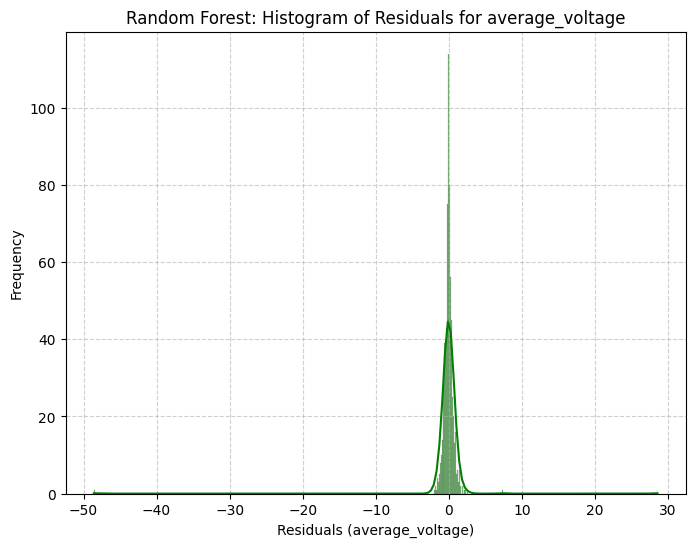

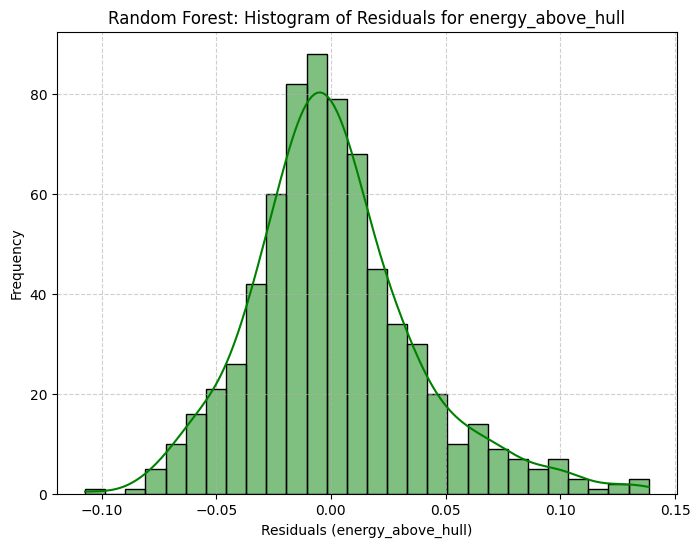


--- Performing Residual Analysis for Model: LightGBM ---
Residuals calculated for LightGBM. Shape: (689, 3)

--- Generating Residuals vs. Predicted Plots for LightGBM ---


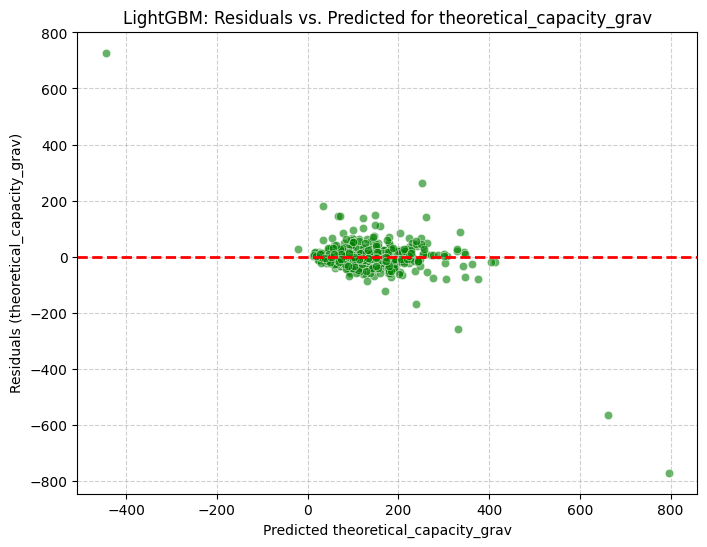

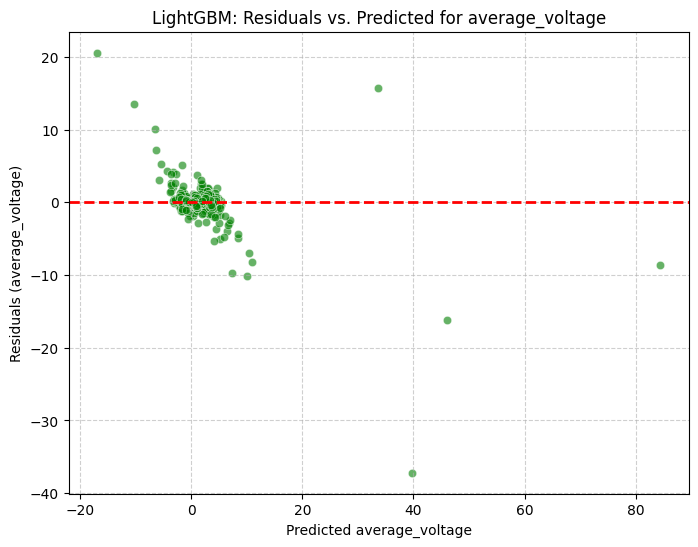

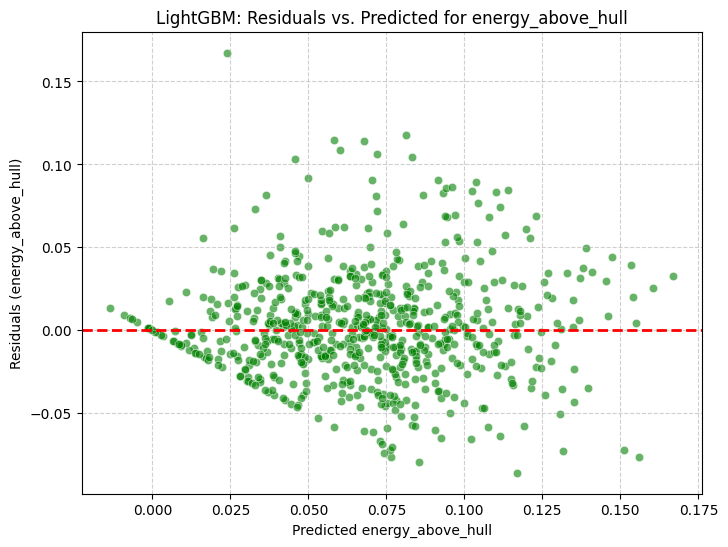


--- Generating Residuals Histograms for LightGBM ---


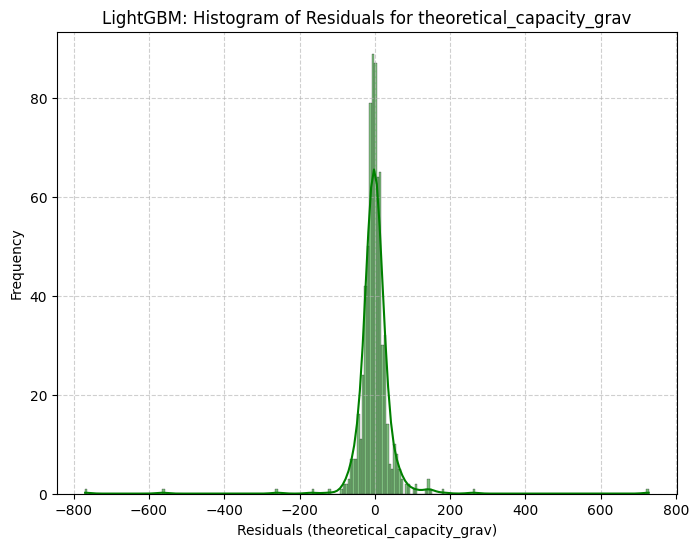

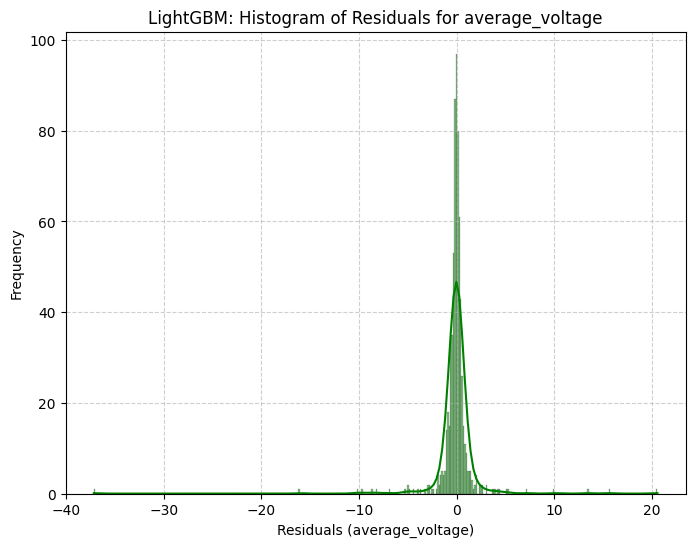

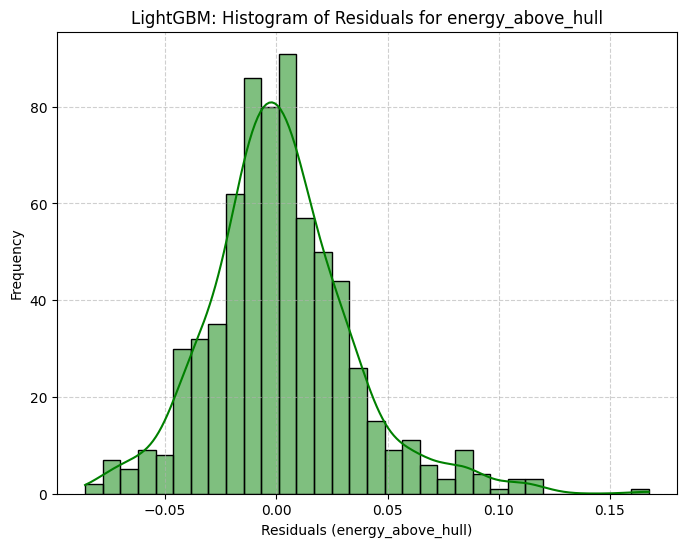


--- Overall Residual Analysis Complete ---


In [21]:
print("\n--- Starting Residual Analysis for All Models ---")

if 'all_models_error_analysis_dfs' in locals() and isinstance(all_models_error_analysis_dfs, dict) and 'target_kpis' in locals():

    for model_name, error_analysis_df in all_models_error_analysis_dfs.items():
        # Check if error analysis was successful for this model
        if 'Error' in error_analysis_df or 'Status' in error_analysis_df:
            print(f"\nSkipping residual analysis for {model_name} due to previous error or status: {error_analysis_df}")
            continue # Skip to the next model


        print(f"\n--- Performing Residual Analysis for Model: {model_name} ---")

        # Extract actual and predicted values for all KPIs for the current model
        # Ensure the columns exist before extracting
        actual_cols = [f'{kpi}_actual' for kpi in target_kpis]
        predicted_cols = [f'{kpi}_predicted' for kpi in target_kpis]

        if all(col in error_analysis_df.columns for col in actual_cols) and all(col in error_analysis_df.columns for col in predicted_cols):
            y_test_model = error_analysis_df[actual_cols]
            y_pred_model = error_analysis_df[predicted_cols]

            # Rename columns to original KPI names for residual DataFrame
            y_test_model.columns = target_kpis
            y_pred_model.columns = target_kpis

            # Calculate residuals (Actual - Predicted) for each target KPI
            residuals_df = y_test_model - y_pred_model

            print(f"Residuals calculated for {model_name}. Shape: {residuals_df.shape}")

            # Scatter plots of Residuals vs. Predicted values
            print(f"\n--- Generating Residuals vs. Predicted Plots for {model_name} ---")
            for kpi in target_kpis:
                plt.figure(figsize=(8, 6))
                sns.scatterplot(x=y_pred_model[kpi], y=residuals_df[kpi], alpha=0.6, color='green')
                plt.axhline(0, color='red', linestyle='--', lw=2) # Add a horizontal line at y=0
                plt.title(f'{model_name}: Residuals vs. Predicted for {kpi}') # Include model name
                plt.xlabel(f'Predicted {kpi}')
                plt.ylabel(f'Residuals ({kpi})')
                plt.grid(True, linestyle='--', alpha=0.6)
                plt.show()

            # Histograms of Residuals
            print(f"\n--- Generating Residuals Histograms for {model_name} ---")
            for kpi in target_kpis:
                plt.figure(figsize=(8, 6))
                sns.histplot(residuals_df[kpi], kde=True, color='green')
                plt.title(f'{model_name}: Histogram of Residuals for {kpi}') # Include model name
                plt.xlabel(f'Residuals ({kpi})')
                plt.ylabel('Frequency')
                plt.grid(True, linestyle='--', alpha=0.6)
                plt.show()
        else:
            print(f"  Skipping residual analysis for {model_name}: Actual or predicted columns not found in error analysis DataFrame.")

else:
    print("Error: Required variables (all_models_error_analysis_dfs, target_kpis) not found or are not correctly structured. Skipping residual analysis.")

print("\n--- Overall Residual Analysis Complete ---")

# Appendix: Summary of Notebook Analysis (Reduced Features Models)

This notebook provides a detailed analysis and interpretation of three machine learning models (XGBoost, Random Forest, and LightGBM) that were trained using a **reduced set of features**. The primary goal is to evaluate their performance with this smaller feature set and to understand the influence of these specific features on the model predictions.

## Notebook Structure and Analysis Steps:

### Data Loading and Preparation (Reduced Features)
This section handles the initial setup by:
- Importing essential Python libraries (`os`, `joblib`, `pandas`, `numpy`, `random`, `sys`, `sklearn`, `xgboost`) required for data handling, modeling, and analysis.
- Defining specific file paths for loading the saved models (trained on reduced features), the data scaler, the list of selected features for each model, and the test datasets (X and Y) containing these reduced features.
- Loading the previously trained MultiOutputRegressor models, the StandardScaler object, and a dictionary mapping each model to its specific list of selected feature names from `.joblib` files.
- Defining the three target KPIs (`theoretical_capacity_grav`, `average_voltage`, `energy_above_hull`).
- Loading the test data (X and Y) with the reduced feature sets for each model from CSV files.
- Preparing the loaded test data by separating material IDs and formula information and ensuring each model's test data only contains the specific features it was trained on.

### Quick Model Prediction Test (Reduced Features)
This section serves as a rapid verification of the loaded models' functionality:
- A single, random material from the test set is selected.
- Predictions are generated for this sample using each of the loaded models trained on reduced features.
- The actual and predicted KPI values are displayed, along with the calculated absolute and relative errors for this specific material.

### Model Analysis (Reduced Features)

#### Model Evaluation & Performance Metrics
This part quantitatively assesses the overall performance of the reduced-feature models on the entire test dataset:
- Predictions are made for all samples in the test set using the respective reduced feature sets for each model.
- Standard regression performance metrics including Mean Absolute Error (MAE), Root Mean Squared Error (RMSE), R-squared (`r2_score`), and Mean Absolute Percentage Error (MAPE) are calculated for each of the three target KPIs.
- The calculated performance metrics are displayed for each model and KPI, providing a direct comparison of their overall accuracy with reduced features.

#### Error Analysis per Sample
This section provides a detailed look at the prediction errors for every individual sample:
- Absolute errors (`|Actual - Predicted|`) and relative errors (`|Actual - Predicted| / |Actual|`) are calculated for each sample in the test set, for each KPI and model.
- Summary statistics (mean, std, min, max, quartiles) for both absolute and relative errors are displayed.
- Samples exhibiting the largest absolute and relative errors for selected KPIs are identified and listed.

#### Visualizations
This section generates plots to visually represent the models' performance and error characteristics:
- **Prediction vs. Actual Plots:** Scatter plots are generated to compare the predicted KPI values against the actual values for each model, including an identity line for reference.
- **Absolute Error Plot:** Scatter plots show the magnitude of the absolute error for each sample across the test set.
- **Relative Error Plot:** Scatter plots display the proportional error for each sample (excluding cases where the actual value is zero).
- **Logarithmic Error Plot:** Logarithmic plots of absolute and relative errors are generated to visualize error distribution across different scales.

#### Model Interpretability (using SHAP Values on Reduced Features)
This section uses SHAP values to understand the influence of the reduced features:
- SHAP values are calculated for each model and KPI using the test data with reduced features, quantifying each feature's contribution to the predictions.
- **SHAP Summary Plots (Dot Plots):** These plots show the distribution of SHAP values for each reduced feature, indicating their overall impact and how different feature values affect predictions.
- **SHAP Summary Plots (Bar Plots):** These plots rank the reduced features by their mean absolute SHAP value, providing a clear hierarchy of feature importance in the reduced set.
- **SHAP Dependence Plots:** These plots illustrate the relationship between a specific reduced feature's value and its corresponding SHAP value, helping to understand how changing a single feature impacts the prediction.

### Uncertainty Quantification (Assessing Prediction Confidence with Reduced Features)

#### Residual Analysis
This final section analyzes the residuals (differences between actual and predicted values) to assess prediction uncertainty:
- Residuals are calculated for each model's predictions on the test set.
- **Residuals vs. Predicted Plots:** Scatter plots show residuals against predicted values, helping to identify patterns like heteroscedasticity or biases.
- **Residuals Histograms:** Histograms visualize the distribution of residuals, ideally centered around zero and normally distributed, indicating random errors.